In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import keras
sns.set()

data = pd.read_pickle(r'C:\Users\admin\Desktop\Γιάννης\Πτυχιακή\files\TOV_tab_data.pkl')
data

,rho_c,M,R
0,5.500000e+14,0.507957,11.406550
1,5.527418e+14,0.512967,11.397576
2,5.554973e+14,0.518019,11.388848
3,5.582666e+14,0.523112,11.380356
4,5.610496e+14,0.528246,11.372093
...,...,...,...
395,3.921222e+15,1.678635,8.270069
396,3.940770e+15,1.676750,8.258821
397,3.960415e+15,1.674857,8.247619
398,3.980158e+15,1.672956,8.236475


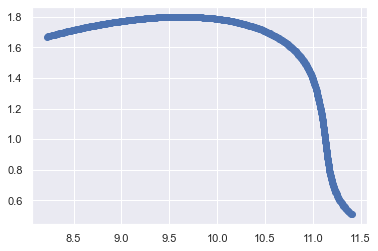

In [ ]:
import matplotlib.pyplot as plt

plt.scatter(data.R, data.M)

In [ ]:
TargetVariable=['M','R']
Predictors=['rho_c']

X=data[Predictors].values
y=data[TargetVariable].values

from sklearn.preprocessing import StandardScaler
PredictorScaler=StandardScaler()
TargetVarScaler=StandardScaler()

PredictorScalerFit=PredictorScaler.fit(X)
TargetVarScalerFit=TargetVarScaler.fit(y)

X=PredictorScalerFit.transform(X)
y=TargetVarScalerFit.transform(y)

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(280, 1)
(280, 2)
(120, 1)
(120, 2)


In [ ]:
from keras.models import Sequential
from keras.layers import Dense


model = Sequential()

model.add(Dense(units=5, input_dim=1, kernel_initializer='normal', activation='tanh'))

model.add(Dense(units=20, kernel_initializer='normal', activation='tanh'))

model.add(Dense(units=25, kernel_initializer='normal', activation='relu'))

model.add(Dense(units=15, kernel_initializer='normal', activation='tanh'))

model.add(Dense(units=20, kernel_initializer='normal', activation='relu'))


model.add(Dense(2, kernel_initializer='normal'))

model.compile(loss='mean_squared_error', optimizer='adam')

model.fit(X_train, y_train ,batch_size = 10, epochs = 50, verbose=1)

Epoch 1/50
28/28 [==============================] - 0s 741us/step - loss: 0.9438
Epoch 2/50
28/28 [==============================] - 0s 704us/step - loss: 0.9286
Epoch 3/50
28/28 [==============================] - 0s 704us/step - loss: 0.7319
Epoch 4/50
28/28 [==============================] - 0s 667us/step - loss: 0.3230
Epoch 5/50
28/28 [==============================] - 0s 704us/step - loss: 0.1876
Epoch 6/50
28/28 [==============================] - 0s 741us/step - loss: 0.1543
Epoch 7/50
28/28 [==============================] - 0s 741us/step - loss: 0.1391
Epoch 8/50
28/28 [==============================] - 0s 741us/step - loss: 0.1265
Epoch 9/50
28/28 [==============================] - 0s 704us/step - loss: 0.1140
Epoch 10/50
28/28 [==============================] - 0s 741us/step - loss: 0.1036
Epoch 11/50
28/28 [==============================] - 0s 704us/step - loss: 0.0901
Epoch 12/50
28/28 [==============================] - 0s 704us/step - loss: 0.0766
Epoch 13/50
28/28 [======

In [ ]:
def FunctionFindBestParams(X_train, y_train, X_test, y_test):
    
    batch_size_list=[5, 8, 10]
    epoch_list  =   [10, 50, 100]
    
    import pandas as pd
    SearchResultsData=pd.DataFrame(columns=['TrialNumber', 'Parameters', 'Accuracy'])
    
    TrialNumber=0
    for batch_size_trial in batch_size_list:
        for epochs_trial in epoch_list:
            temp = pd.DataFrame({})
            
            TrialNumber+=1
            
            model = Sequential()
            
            model.add(Dense(units=5, input_dim=X_train.shape[1], kernel_initializer='normal', activation='tanh'))

            model.add(Dense(units=20, kernel_initializer='normal', activation='tanh'))
            
            model.add(Dense(units=25, kernel_initializer='normal', activation='relu'))
            
            model.add(Dense(units=15, kernel_initializer='normal', activation='tanh'))
            
            model.add(Dense(units=20, kernel_initializer='normal', activation='relu'))

            model.add(Dense(2, kernel_initializer='normal'))

            model.compile(loss='mean_squared_error', optimizer='adam')

            model.fit(X_train, y_train ,batch_size = batch_size_trial, epochs = epochs_trial, verbose=0)
            
            y_mod       = model.predict(X_test)
            y_mod_norm  = np.sqrt(y_mod.T[0]**2 + y_mod.T[1]**2)
            y_test_norm = np.sqrt(y_test.T[0]**2 + y_test.T[1]**2)
            
            MAPE = np.mean(100 * (np.abs(y_test_norm-y_mod_norm)/y_test_norm))
            
            print(TrialNumber, 'Parameters:','batch_size:', batch_size_trial,'-', 'epochs:',epochs_trial, 'Accuracy:', 100-MAPE)
            
            temp = pd.DataFrame(data=[[TrialNumber, str(batch_size_trial)+'-'+str(epochs_trial), 100-MAPE]],
                                                                    columns=['TrialNumber', 'Parameters', 'Accuracy'] )
            
            frames = [SearchResultsData,temp]
            
            SearchResultsData = pd.concat(frames, ignore_index = True)
    return(SearchResultsData)


ResultsData=FunctionFindBestParams(X_train, y_train, X_test, y_test)

4/4 [==============================] - 0s 1ms/step
1 Parameters: batch_size: 5 - epochs: 10 Accuracy: 82.29439422609545
4/4 [==============================] - 0s 1ms/step
2 Parameters: batch_size: 5 - epochs: 50 Accuracy: 99.48502968664432
4/4 [==============================] - 0s 1ms/step
3 Parameters: batch_size: 5 - epochs: 100 Accuracy: 99.39860930493607
4/4 [==============================] - 0s 1ms/step
4 Parameters: batch_size: 8 - epochs: 10 Accuracy: 86.1434953408777
4/4 [==============================] - 0s 1ms/step
5 Parameters: batch_size: 8 - epochs: 50 Accuracy: 98.92876675846628
4/4 [==============================] - 0s 1ms/step
6 Parameters: batch_size: 8 - epochs: 100 Accuracy: 99.08827781735982
4/4 [==============================] - 0s 667us/step
7 Parameters: batch_size: 10 - epochs: 10 Accuracy: 83.84126954977174
4/4 [==============================] - 0s 667us/step
8 Parameters: batch_size: 10 - epochs: 50 Accuracy: 99.04672408627022
4/4 [============================

<AxesSubplot:xlabel='Parameters'>

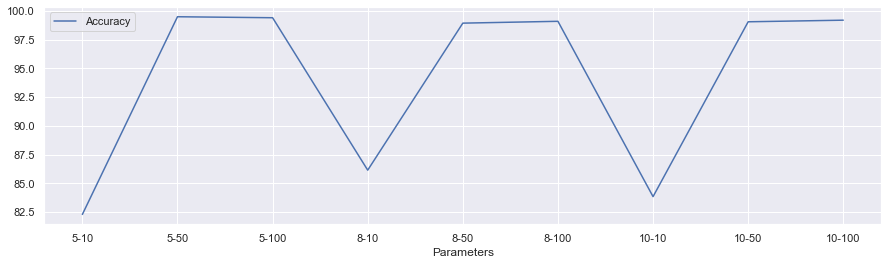

In [ ]:
%matplotlib inline
ResultsData.plot(x='Parameters', y='Accuracy', figsize=(15,4), kind='line')

## Straight lines correlation to number of neurons

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 96.45571980054237


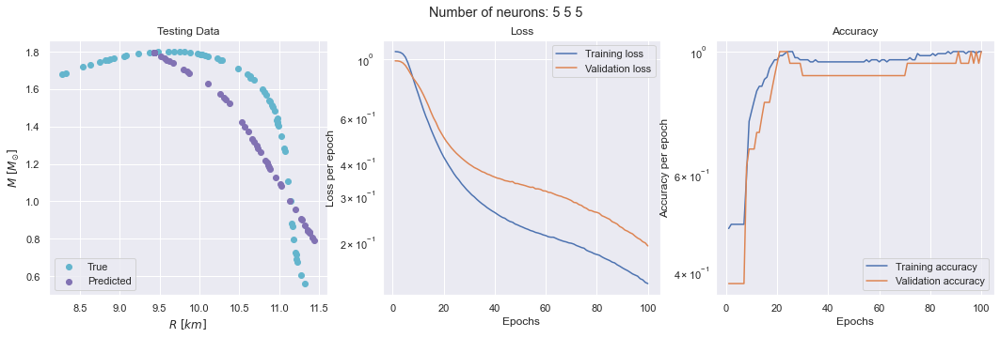

2/2 [==============================] - 0s 1000us/step
The Accuracy of ANN model is: 99.51530629366825


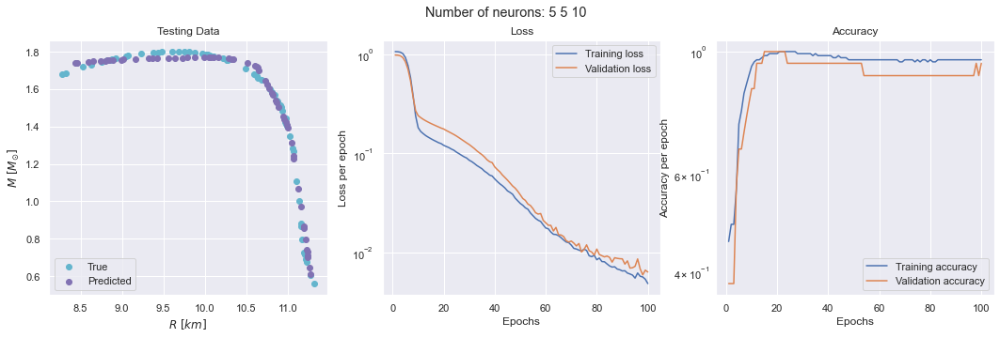

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.5335255152754


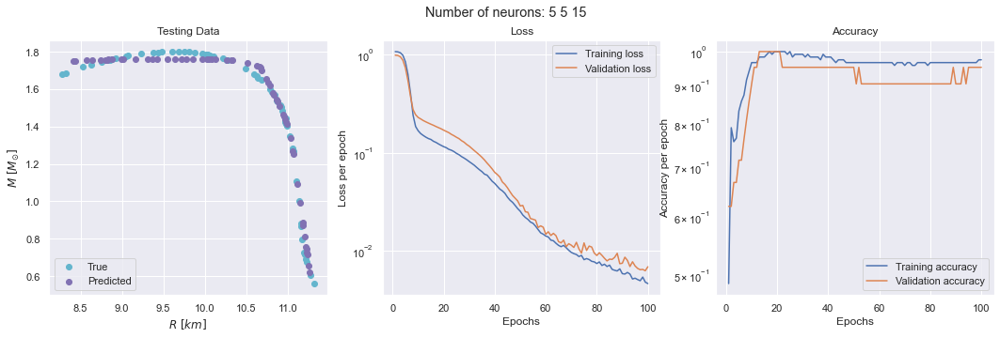

2/2 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 98.27823220453448


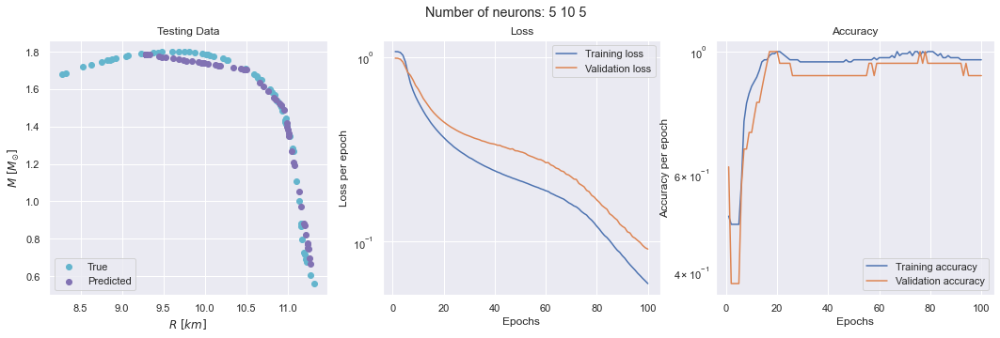

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.63559046934343


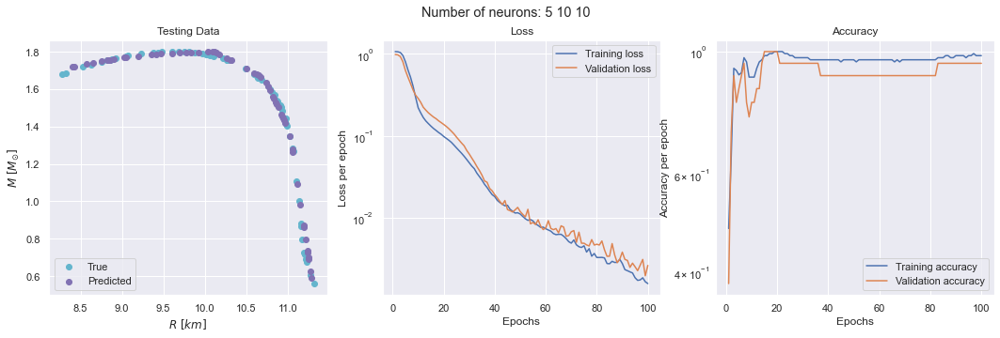

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.47391195578055


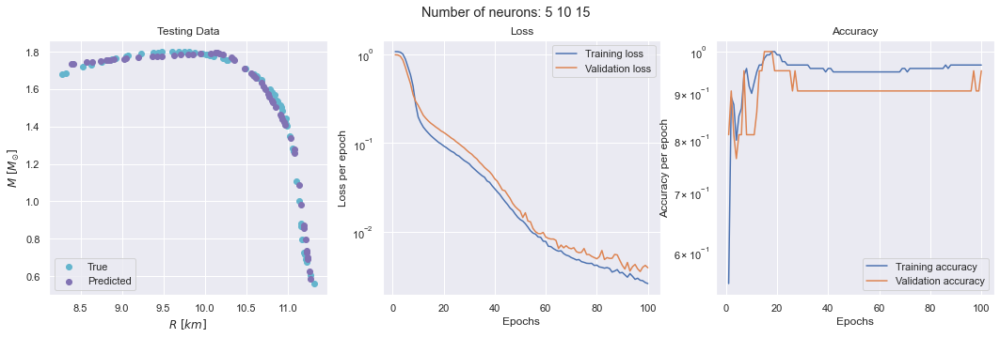

2/2 [==============================] - 0s 1000us/step
The Accuracy of ANN model is: 99.45497257311041


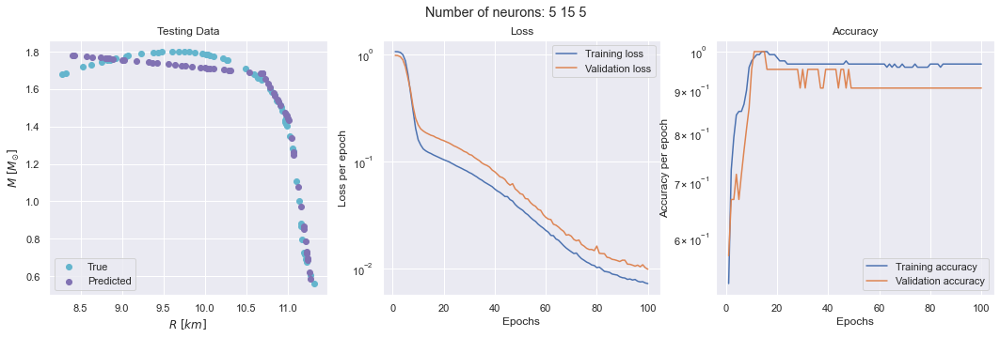

2/2 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.68749375968063


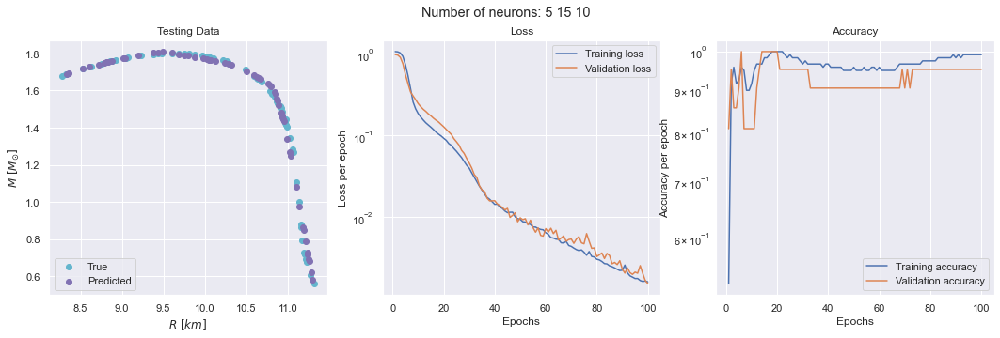

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.77714838028966


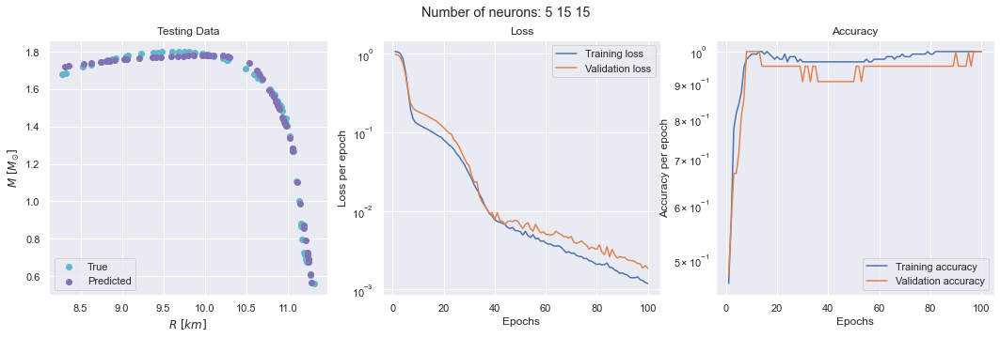

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.27099199010635


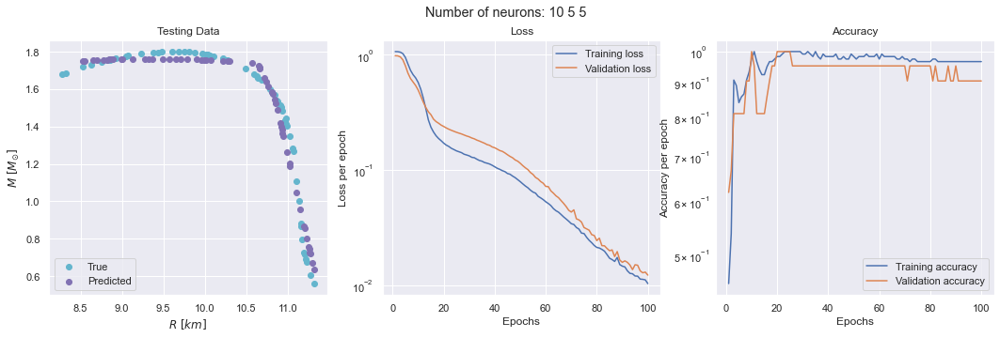

2/2 [==============================] - 0s 1000us/step
The Accuracy of ANN model is: 99.46766041183682


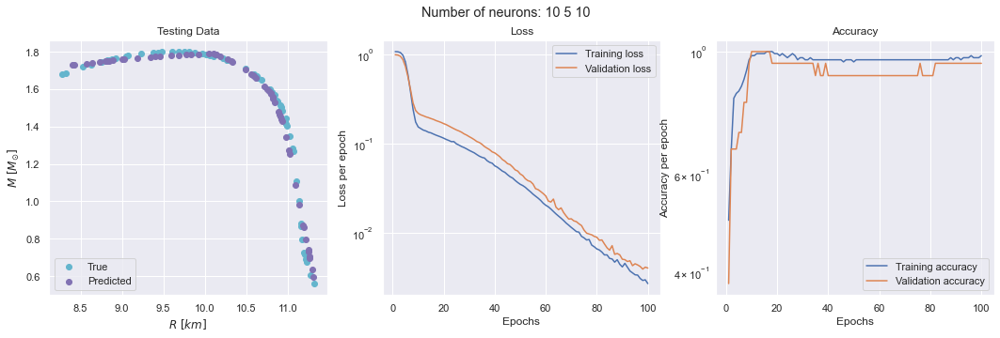

2/2 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.43948599633504


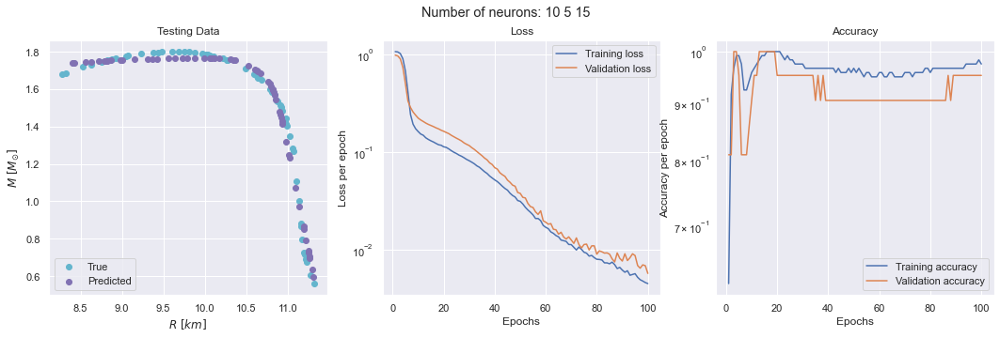

2/2 [==============================] - 0s 1000us/step
The Accuracy of ANN model is: 99.30421817970293


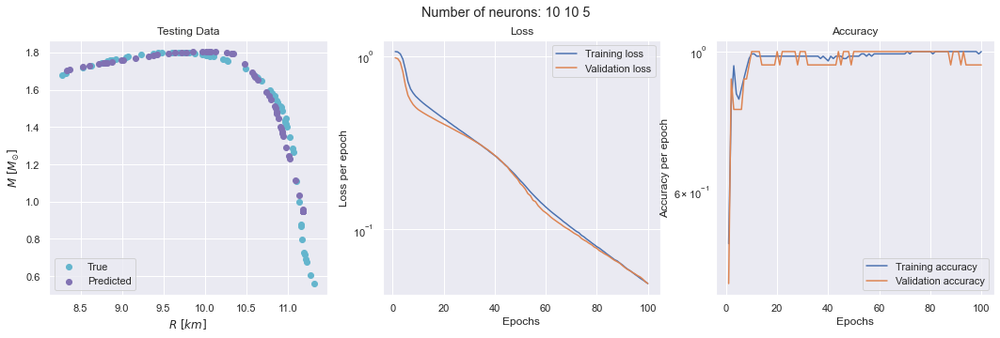

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.27284687896405


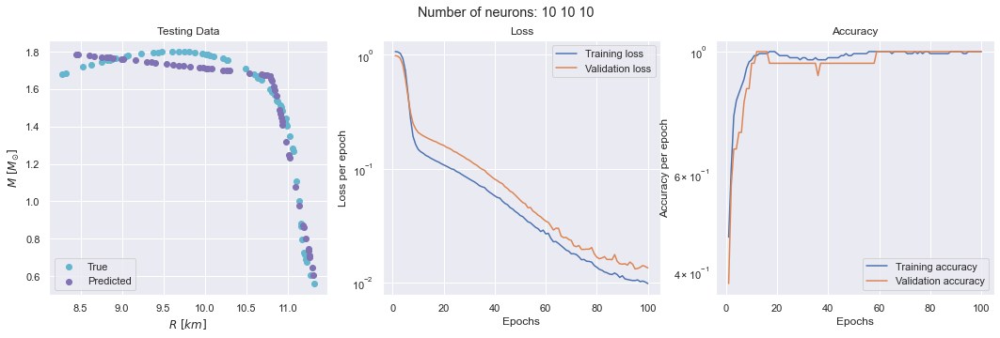

2/2 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.64670513942669


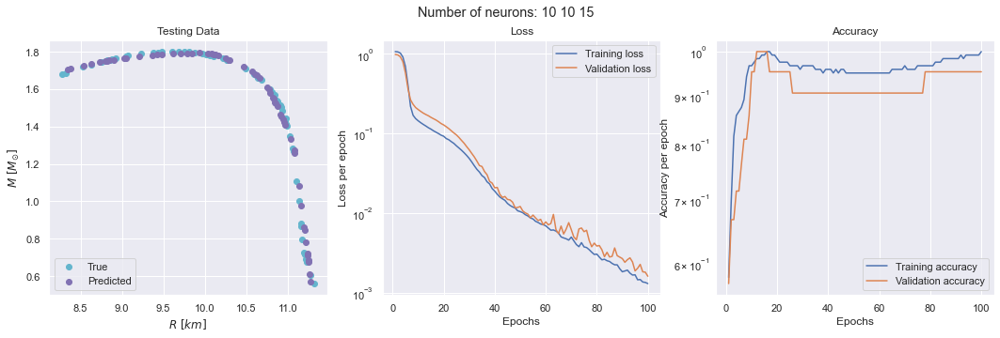

2/2 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.42264401087462


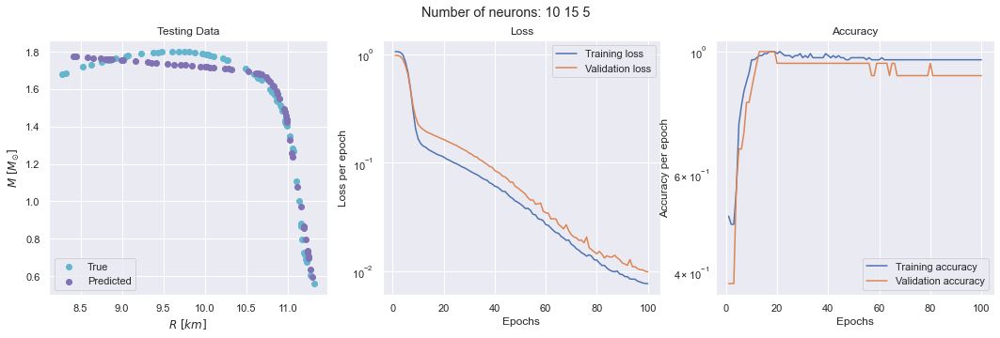

2/2 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.73908120068705


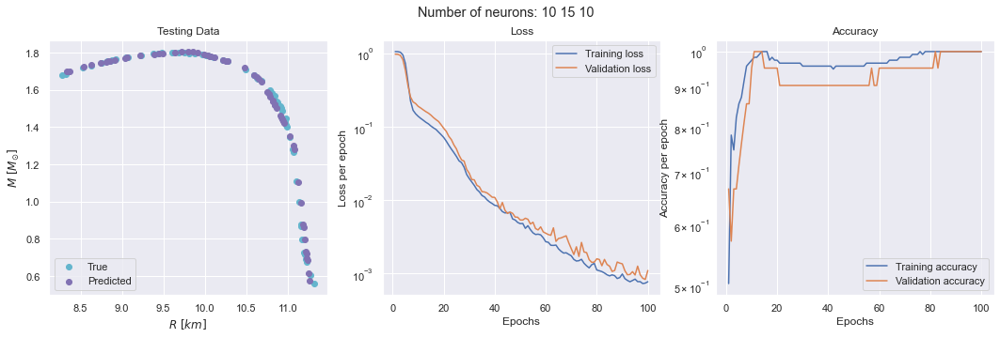

2/2 [==============================] - 0s 1000us/step
The Accuracy of ANN model is: 99.7316303446804


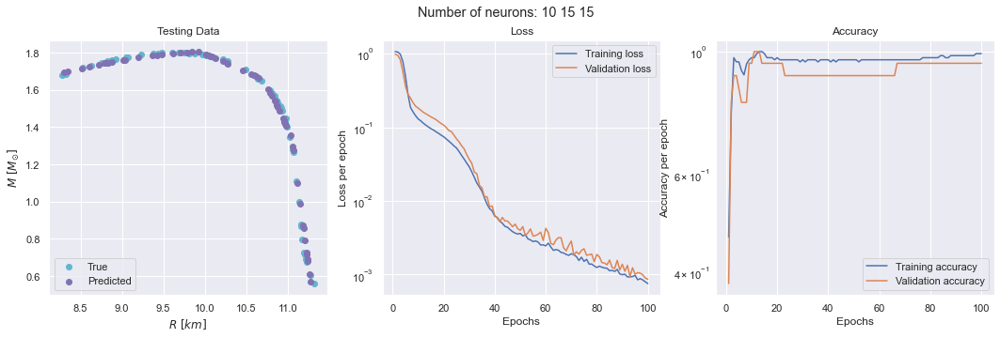

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 98.82858503292223


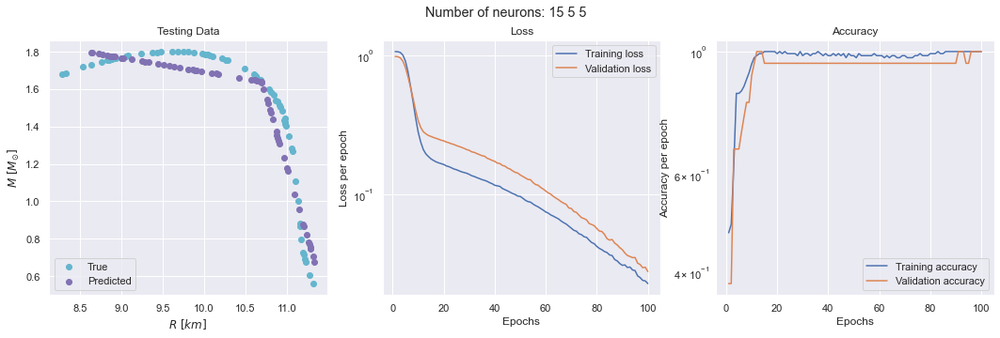

2/2 [==============================] - 0s 1000us/step
The Accuracy of ANN model is: 99.46592275754286


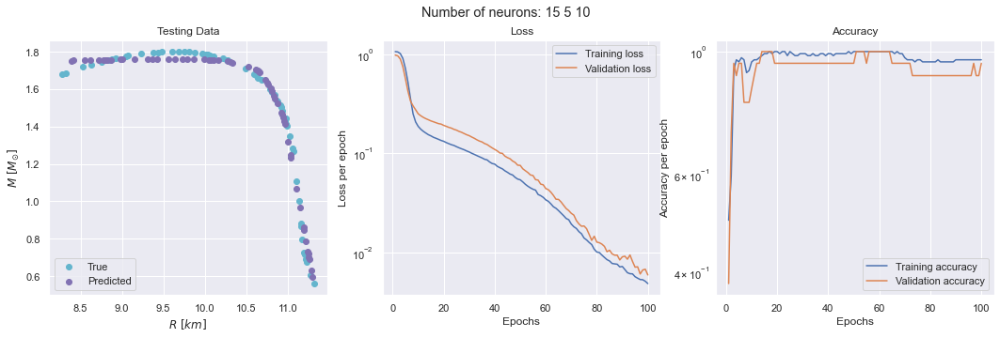

2/2 [==============================] - 0s 1000us/step
The Accuracy of ANN model is: 99.60164209790712


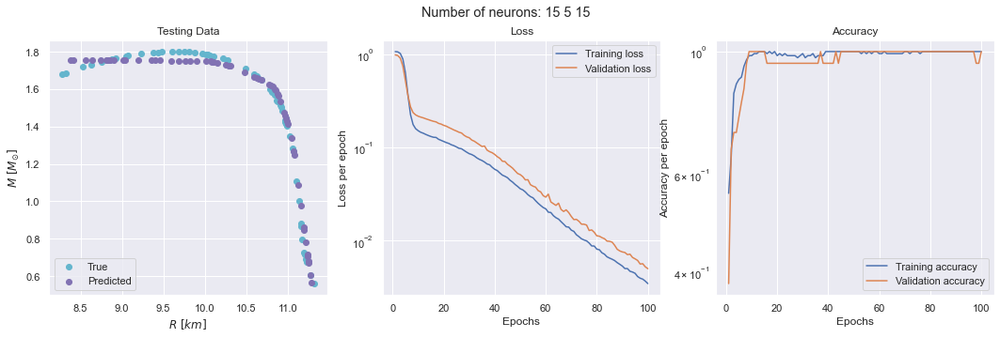

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.41075788993885


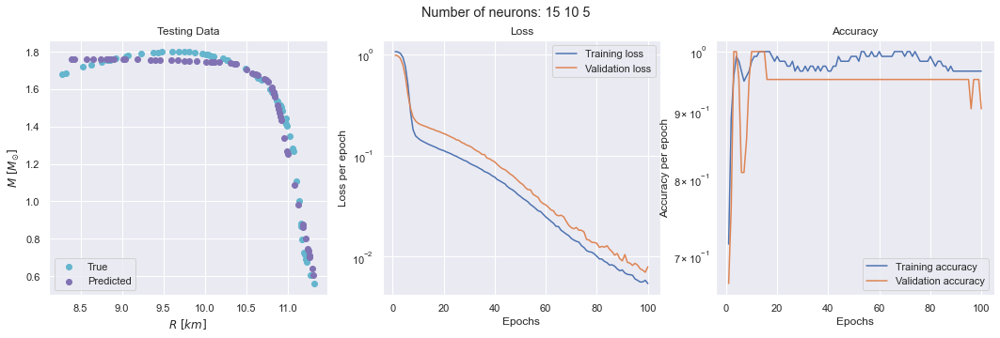

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.52034664515705


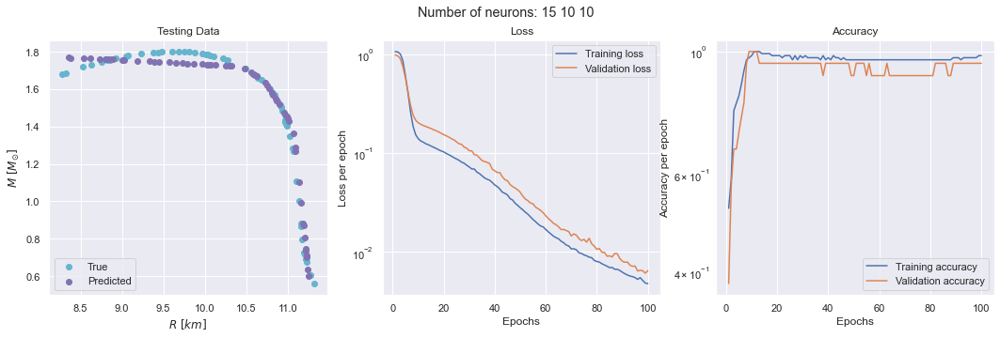

2/2 [==============================] - 0s 1000us/step
The Accuracy of ANN model is: 99.75200543752848


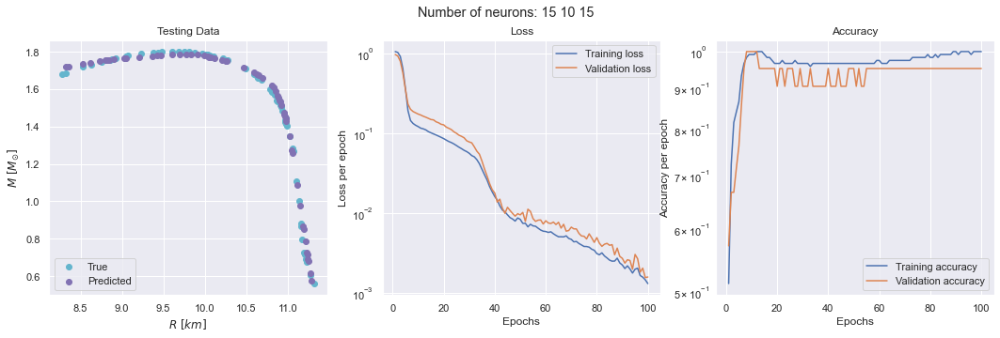

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.41153385723298


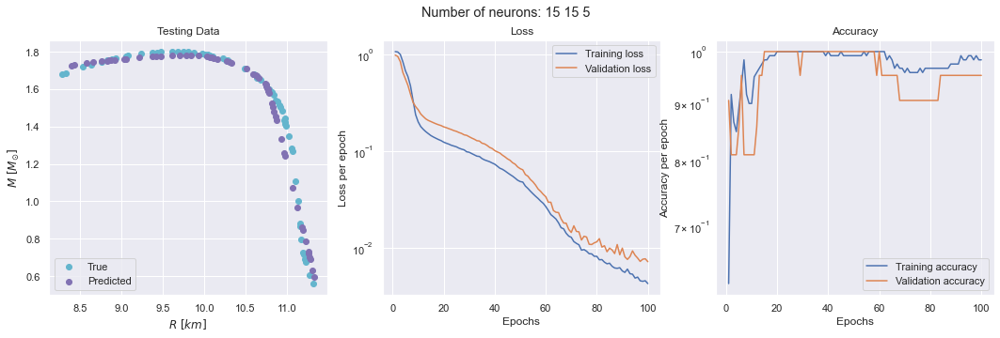

2/2 [==============================] - 0s 999us/step
The Accuracy of ANN model is: 99.78459720535115


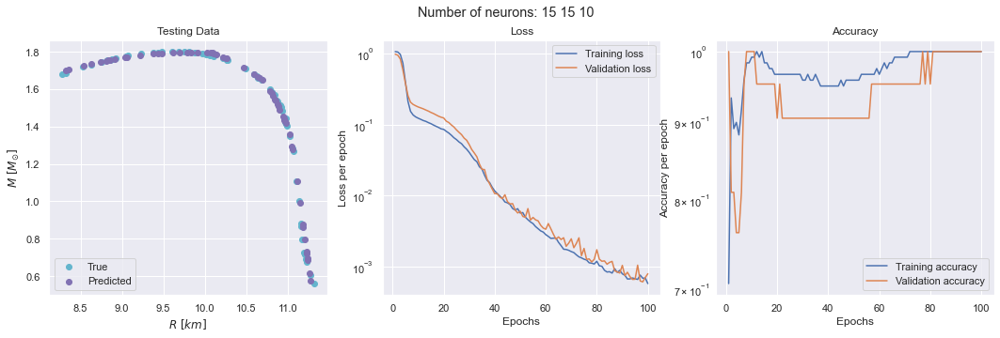

2/2 [==============================] - 0s 1000us/step
The Accuracy of ANN model is: 99.67744969637894


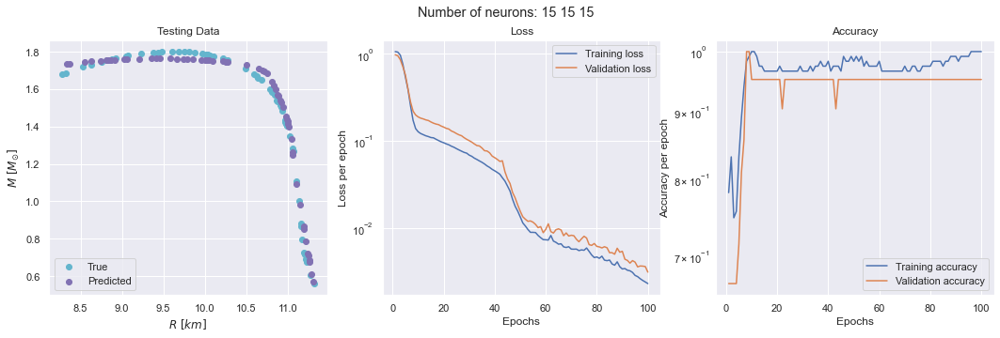

In [ ]:
eps = 100
neuron_list = [5,10,15]


for i in neuron_list:
    for j in neuron_list:
        for k in neuron_list:


            model = Sequential()
            
            model.add(Dense(units = i, input_dim=X_train.shape[1], kernel_initializer='normal', activation='tanh'))

            model.add(Dense(units = j, kernel_initializer='normal', activation='tanh'))

            model.add(Dense(units = k, kernel_initializer='normal', activation='relu'))

            #             model.add(Dense(units=15, kernel_initializer='normal', activation='tanh'))

            #             model.add(Dense(units=20, kernel_initializer='normal', activation='relu'))

            model.add(Dense(2, kernel_initializer='normal'))

            model.compile(loss='mean_squared_error', optimizer='adam', metrics=['accuracy'])

            trial = model.fit(X_train, y_train ,batch_size = 5, epochs = eps, verbose=0, validation_split = 0.15)

            Predictions=model.predict(X_test)

            Predictions=TargetVarScalerFit.inverse_transform(Predictions)

            y_test_orig=TargetVarScalerFit.inverse_transform(y_test)

            Test_Data=PredictorScalerFit.inverse_transform(X_test)

            TestingData=pd.DataFrame(data=Test_Data, columns=Predictors)

            TestingData['M'] = y_test_orig.T[0]
            TestingData['R'] = y_test_orig.T[1]

            TestingData['M_pred'] = Predictions.T[0]
            TestingData['R_pred'] = Predictions.T[1]

            Testing_norm   = np.sqrt(TestingData.M.values**2 + TestingData.R.values**2)
            Predicted_norm = np.sqrt(TestingData.M_pred.values**2 + TestingData.R_pred.values**2)
            Test_pred_norm = np.sqrt((TestingData.M.values-TestingData.M_pred.values)**2 + (TestingData.R.values-TestingData.R_pred.values)**2)


            APE=100*(Test_pred_norm/Testing_norm)
            TestingData['APE']=APE

            print('The Accuracy of ANN model is:', 100-np.mean(APE))

            import matplotlib.pyplot as plt
            x1 = TestingData.R.values
            y1 = TestingData.M.values

            x2 = TestingData.R_pred.values
            y2 = TestingData.M_pred.values

            fig, ax = plt.subplots(1, 3, figsize=(18,5))
            ax[0].scatter(x1,y1, color = 'c', label = 'True')
            ax[0].scatter(x2,y2, color = 'm', label = 'Predicted')
            ax[0].legend()
            ax[0].set_xlabel('$ R \ [km] $')
            ax[0].set_ylabel('$ M \ [M_{\odot}] $')
            ax[0].set_title("Testing Data")


            val_loss_list = trial.history['val_loss']
            loss_list     = trial.history['loss']
            epos          = np.linspace(1,eps,eps)
            ax[1].semilogy(epos, loss_list    , label = 'Training loss')
            ax[1].semilogy(epos, val_loss_list, label = 'Validation loss')
            ax[1].set_xlabel('Epochs')
            ax[1].set_ylabel('Loss per epoch')
            ax[1].legend()
            ax[1].set_title("Loss")
            
            val_acc_list = trial.history['val_accuracy']
            acc_list     = trial.history['accuracy']
            epos         = np.linspace(1,eps,eps)
            ax[2].semilogy(epos, acc_list    , label = 'Training accuracy')
            ax[2].semilogy(epos, val_acc_list, label = 'Validation accuracy')
            ax[2].set_xlabel('Epochs')
            ax[2].set_ylabel('Accuracy per epoch')
            ax[2].legend()
            ax[2].set_title("Accuracy")
            
            
            fig.suptitle('Number of neurons: '+str(i)+" "+str(j)+" "+str(k))
            plt.show()

## Searching for the best tuning

2/2 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.81714016946569


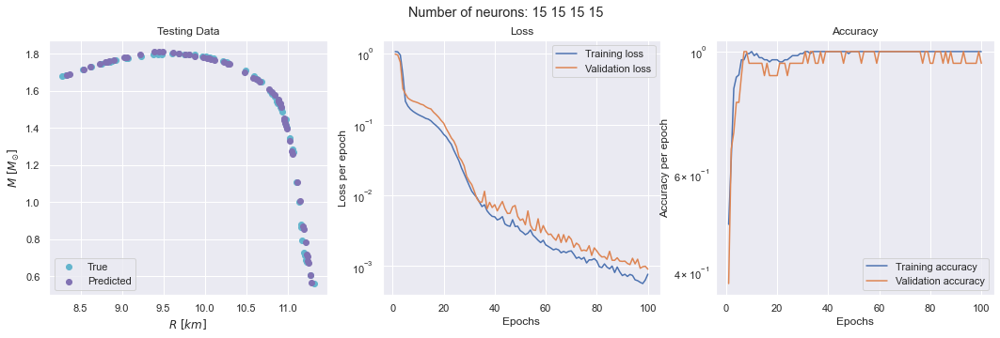

2/2 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.80228451171456


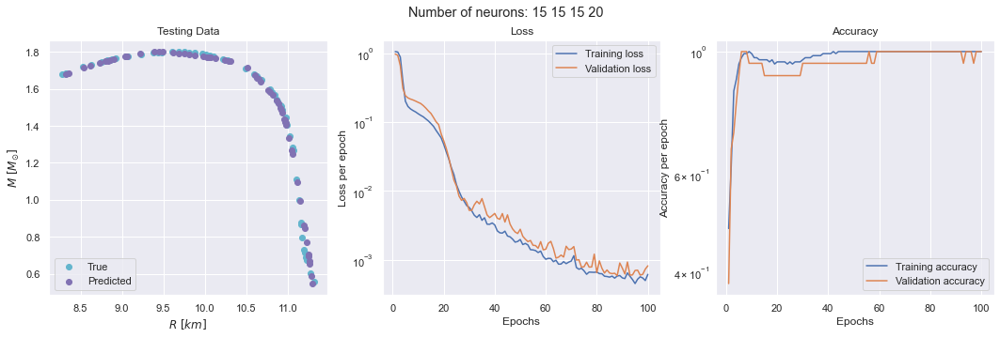

2/2 [==============================] - 0s 999us/step
The Accuracy of ANN model is: 99.74813830941686


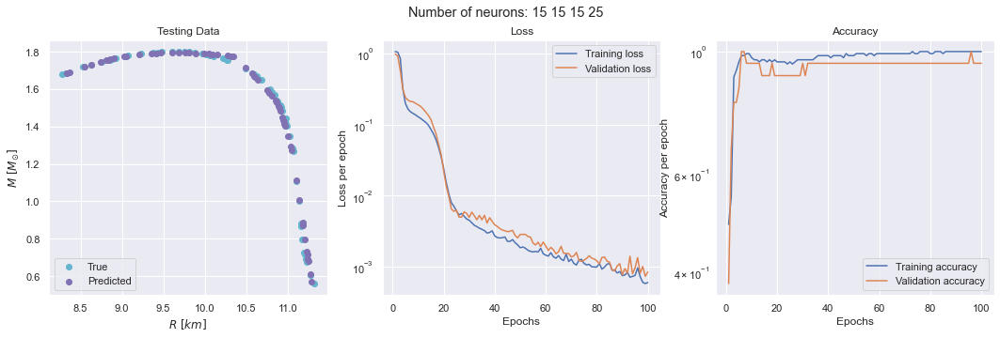

2/2 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.82423840716194


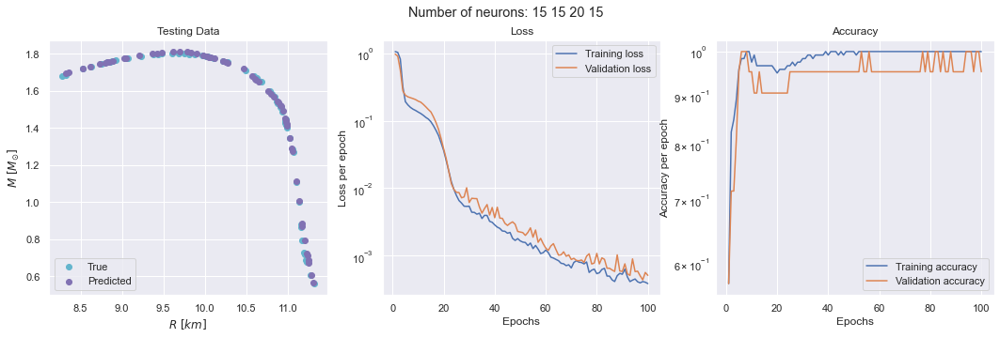

2/2 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.81359296632967


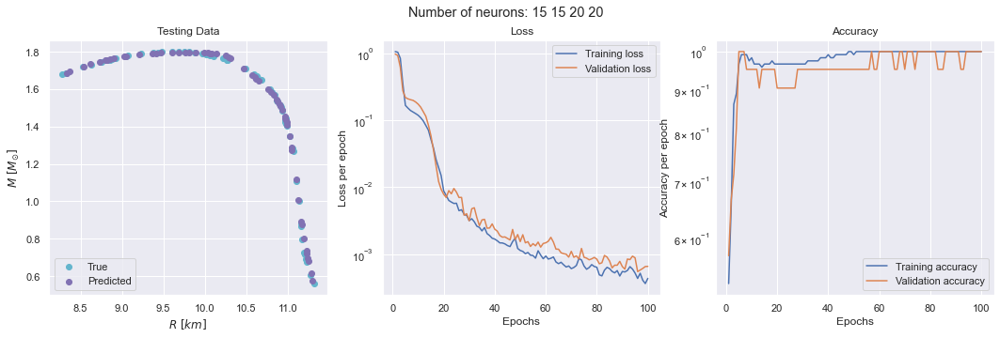

2/2 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.82256026860156


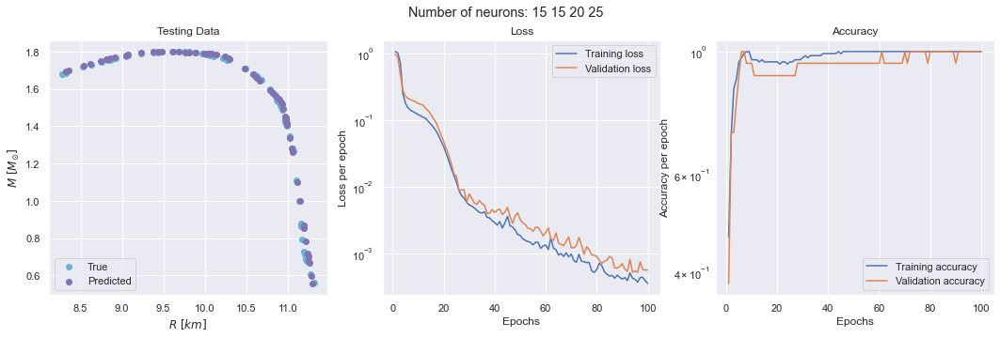

2/2 [==============================] - 0s 1000us/step
The Accuracy of ANN model is: 99.84625535977304


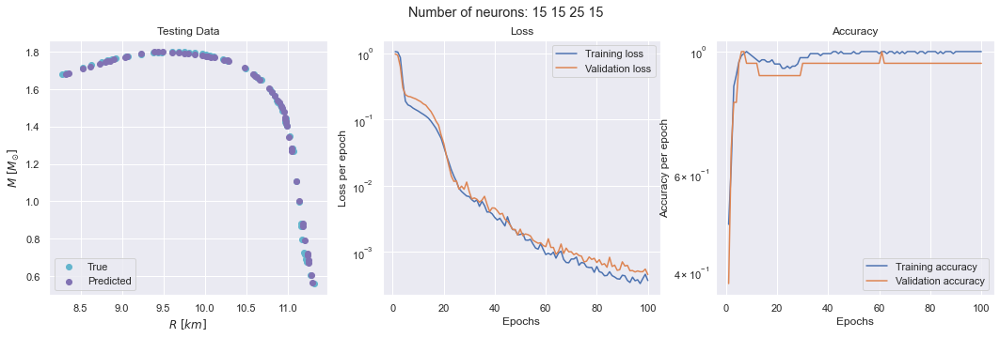

2/2 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.82173746256727


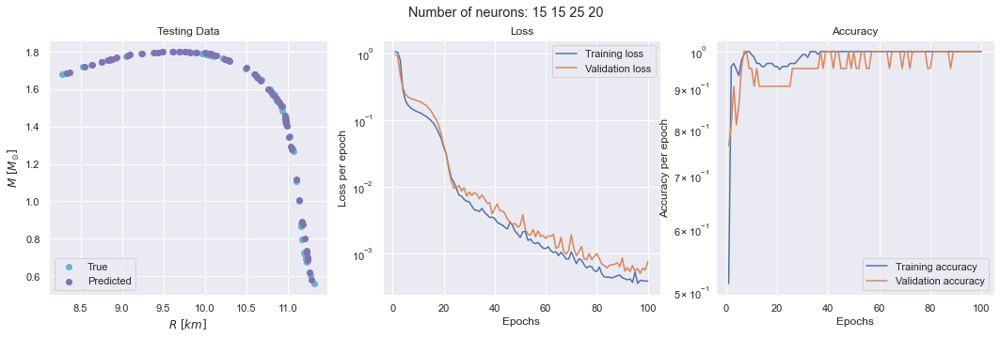

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.80687537838041


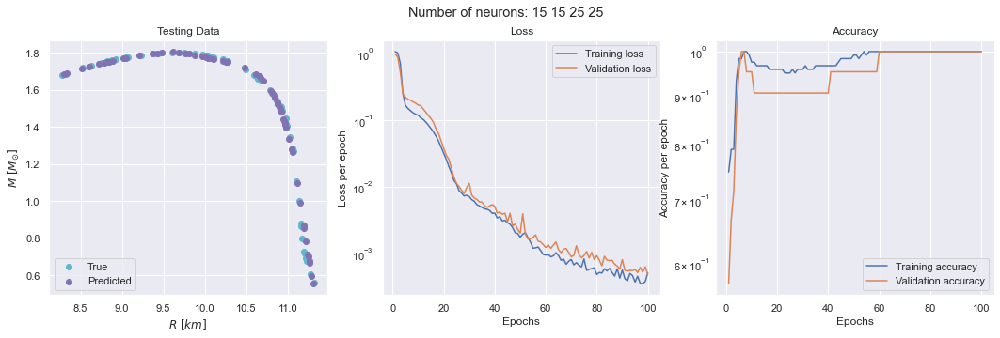

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.84910913030656


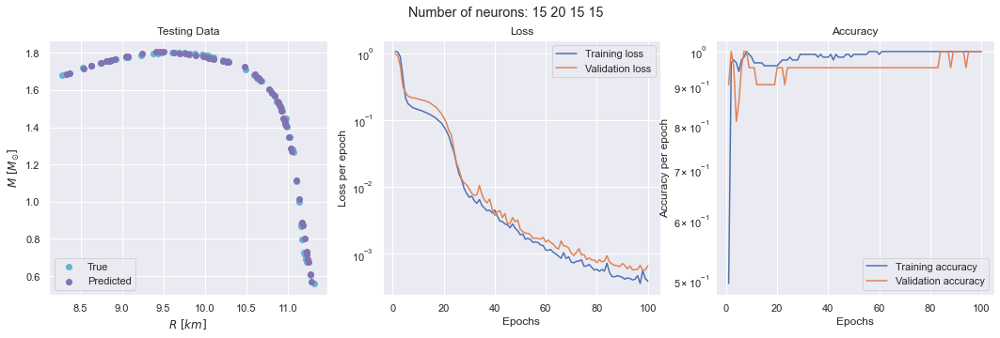

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.8043041505916


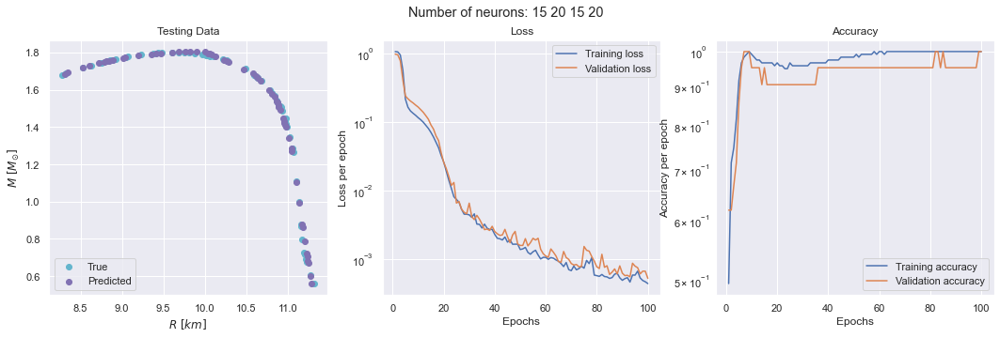

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.82623616439159


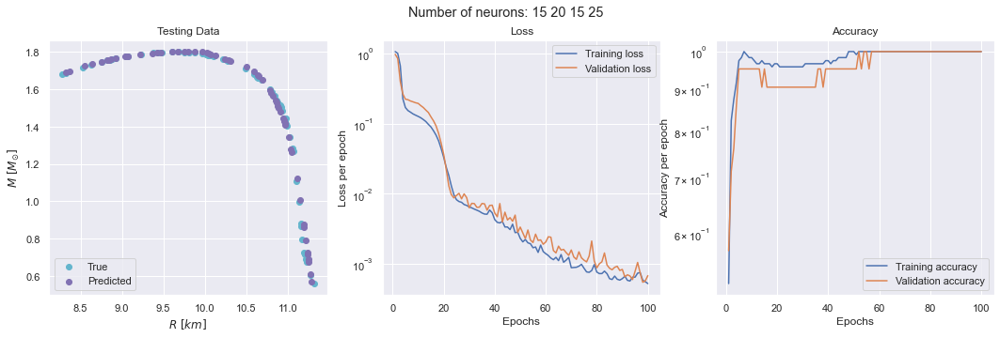

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.84397584019601


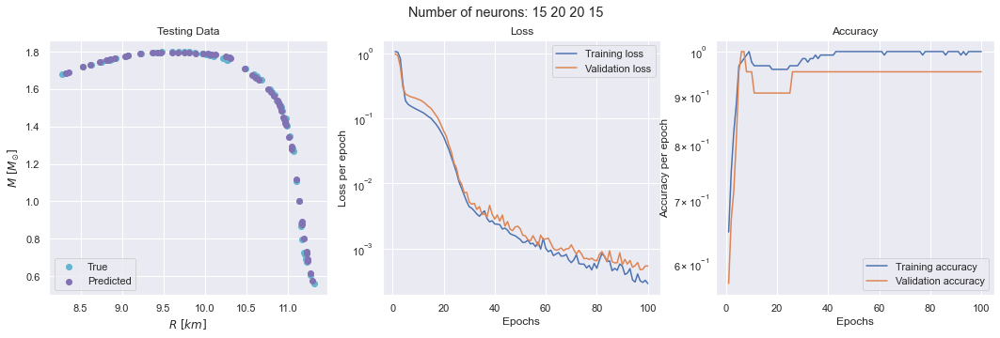

2/2 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.81574895208843


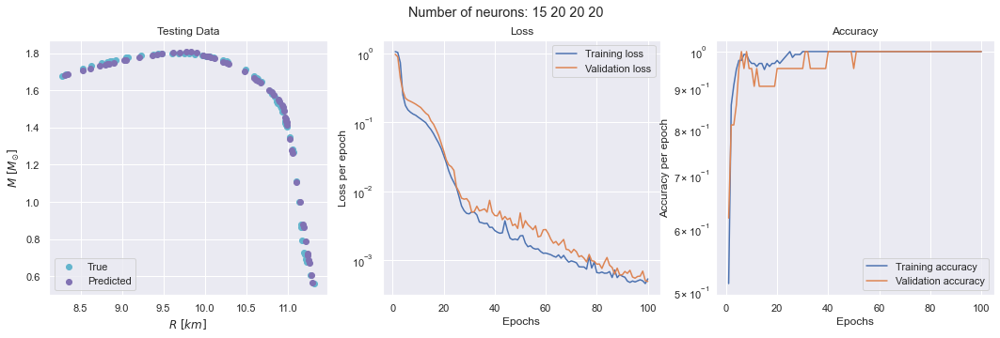

2/2 [==============================] - 0s 999us/step
The Accuracy of ANN model is: 99.80789950772683


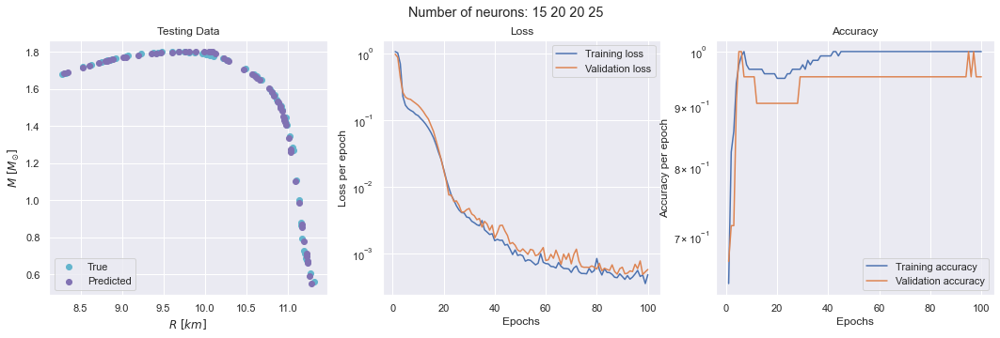

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.81629655171399


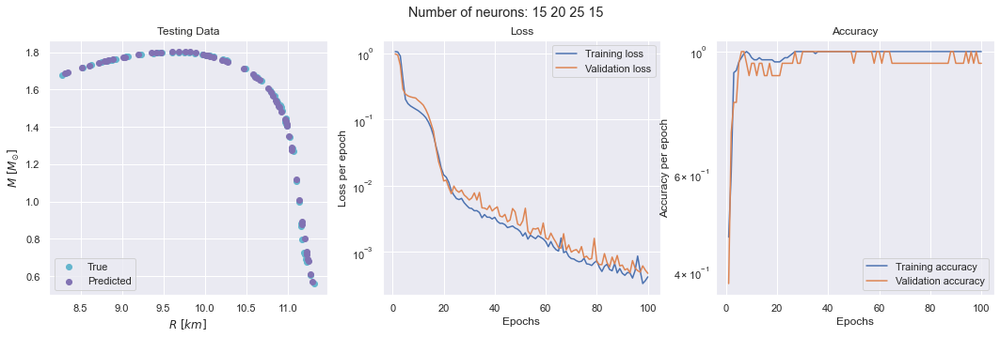

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.8273592955202


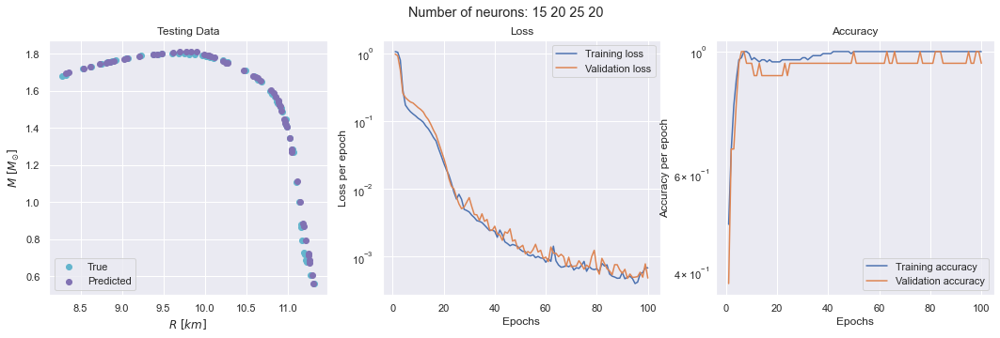

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.8440701411241


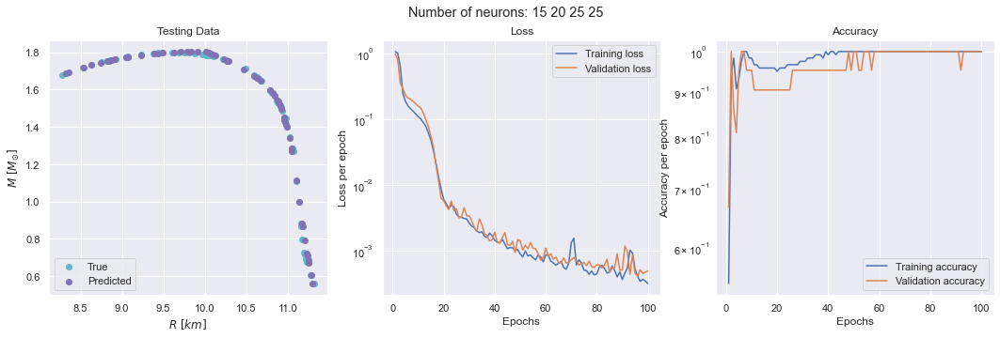

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.83179402299422


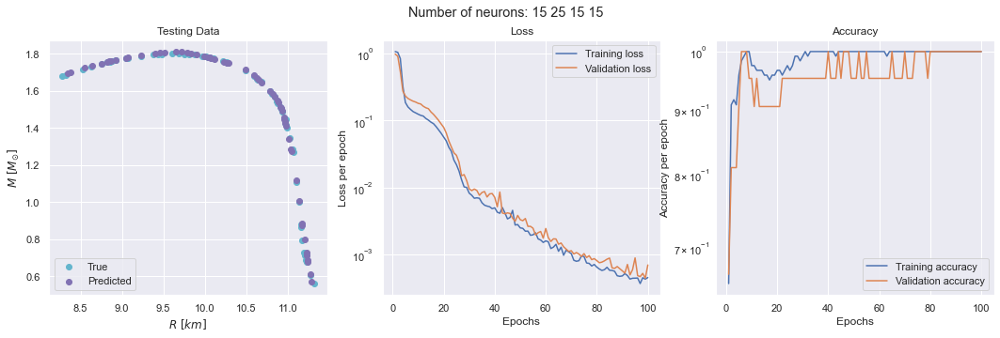

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.82425510267304


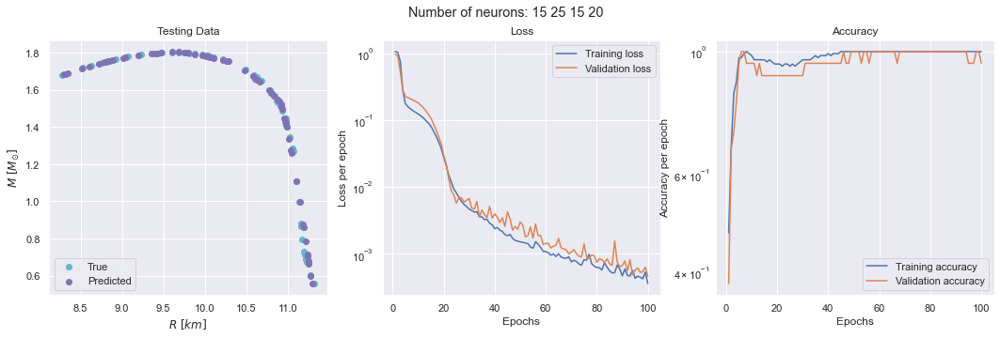

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.83293696592692


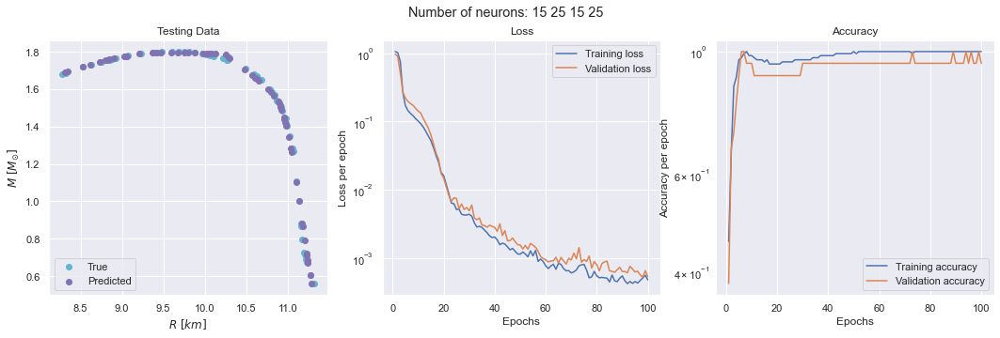

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.77625437289035


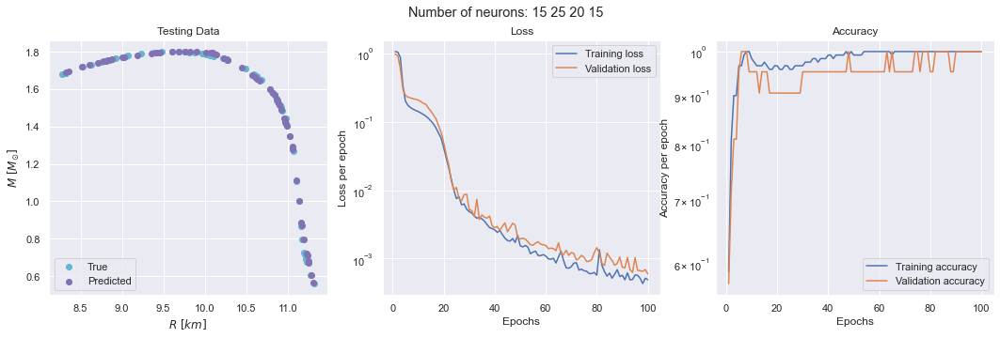

2/2 [==============================] - 0s 999us/step
The Accuracy of ANN model is: 99.7876374495142


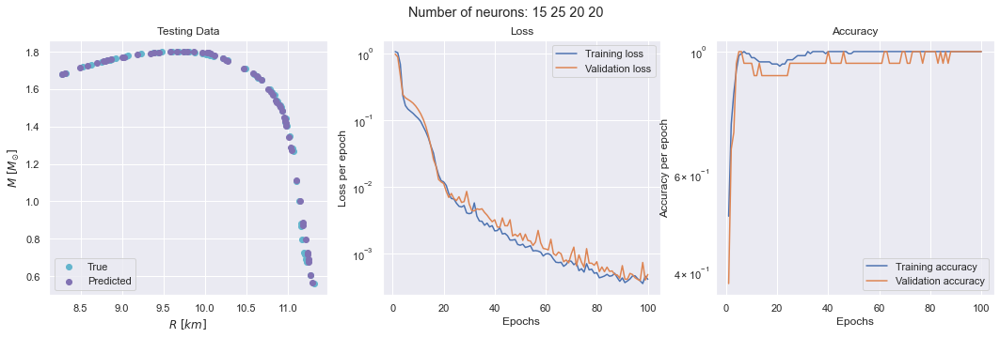

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.8245486982608


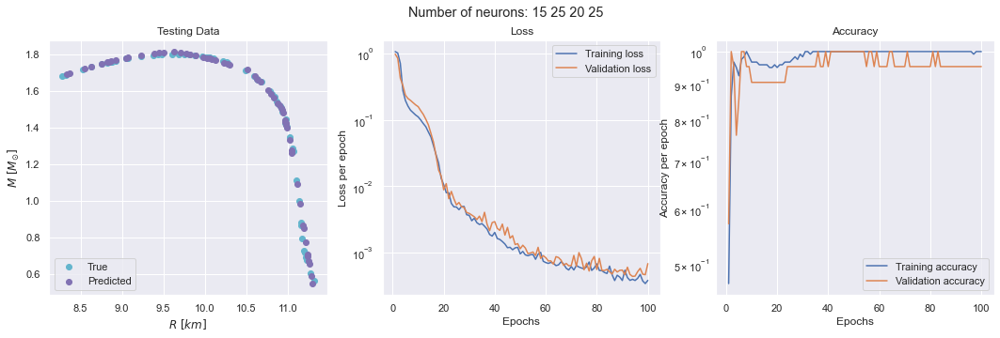

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.82617404442612


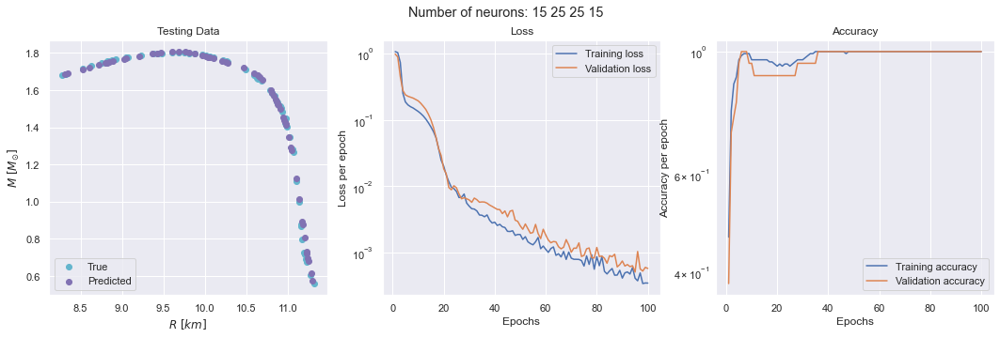

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.79519913561359


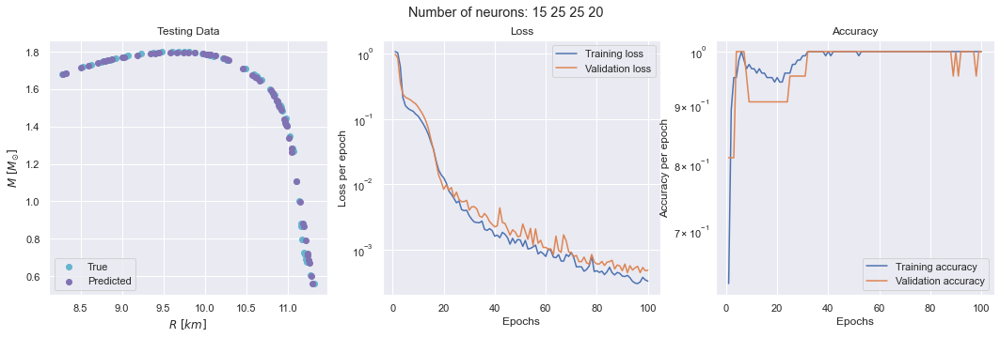

2/2 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.85792900716216


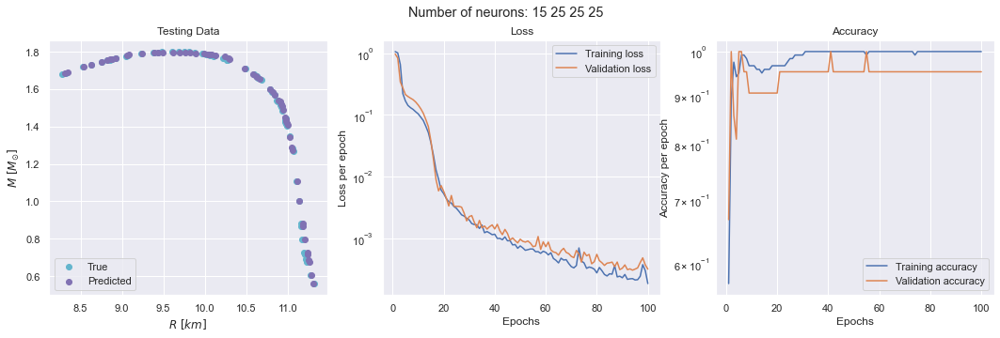

2/2 [==============================] - 0s 1000us/step
The Accuracy of ANN model is: 99.77453329903142


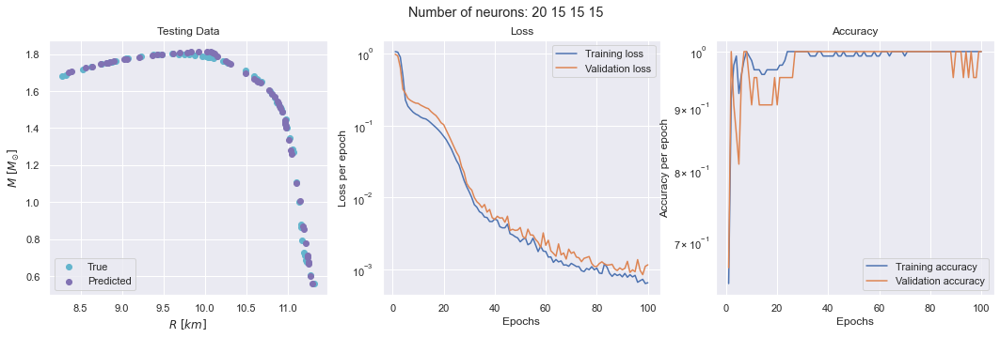

2/2 [==============================] - 0s 999us/step
The Accuracy of ANN model is: 99.68482618009931


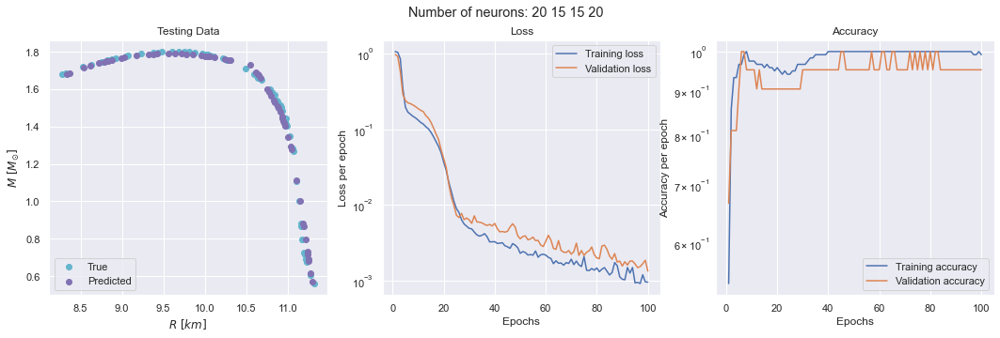

2/2 [==============================] - 0s 1000us/step
The Accuracy of ANN model is: 99.81533033720144


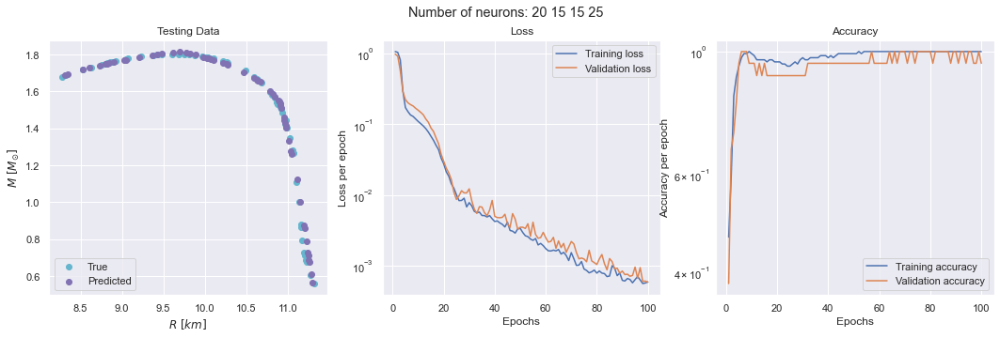

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.80747662110853


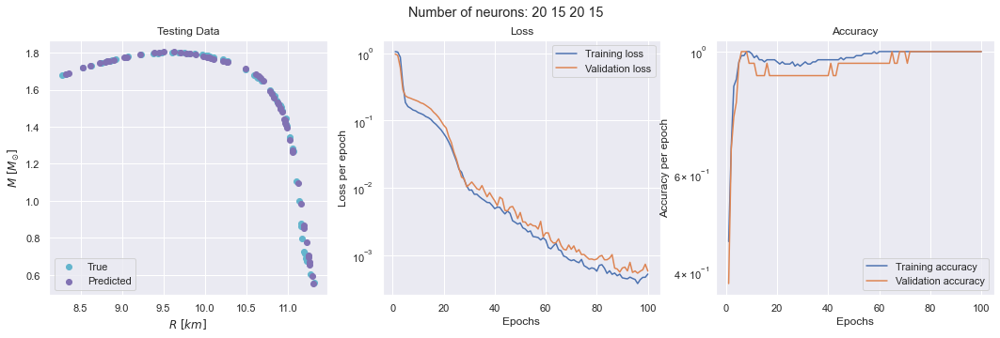

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.79323227194014


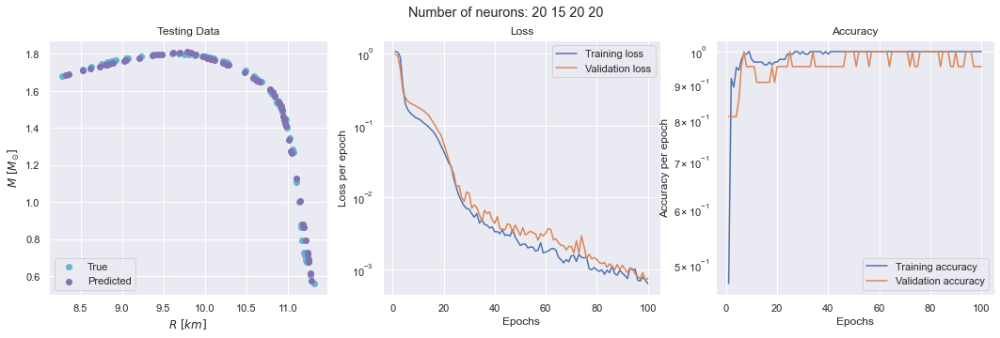

2/2 [==============================] - 0s 1000us/step
The Accuracy of ANN model is: 99.81336268286334


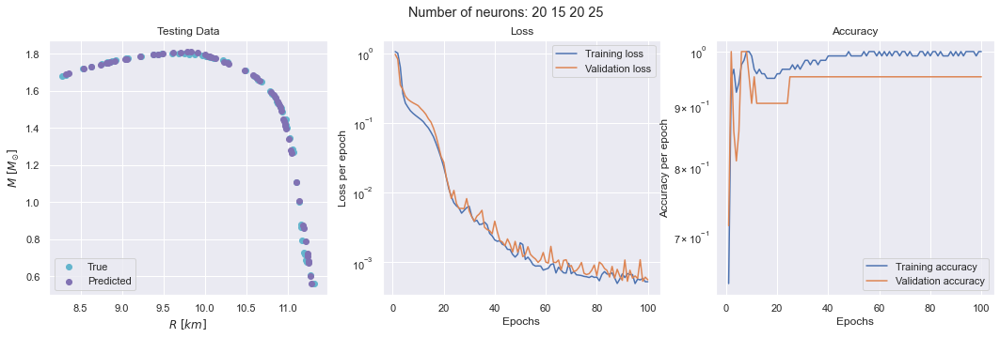

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.81539631090565


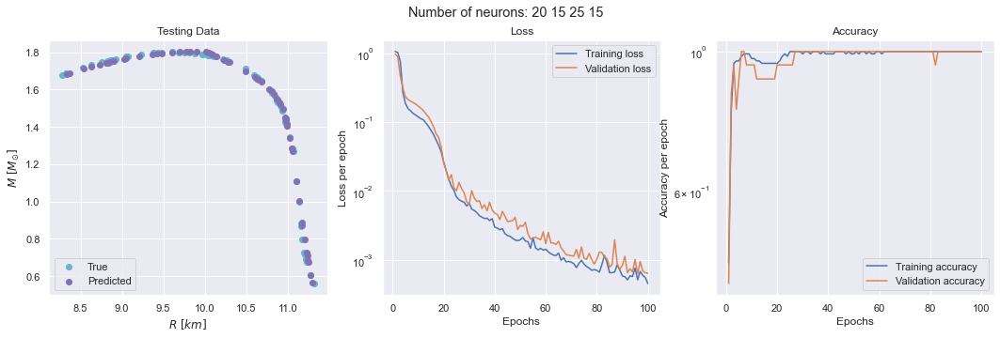

2/2 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.87378690145353


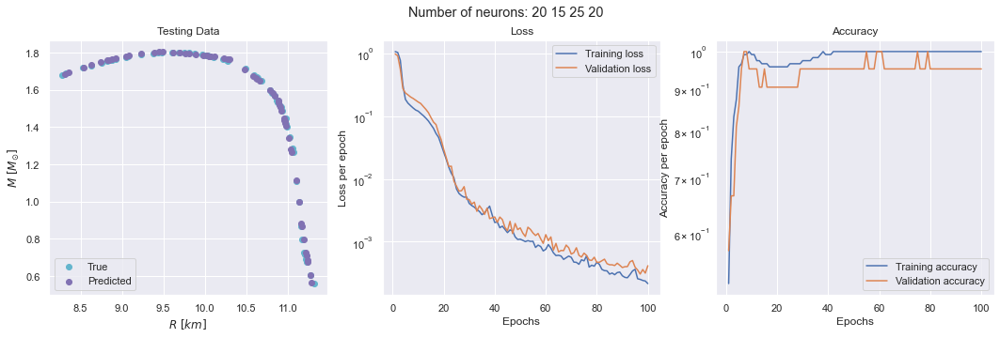

2/2 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.88103842219347


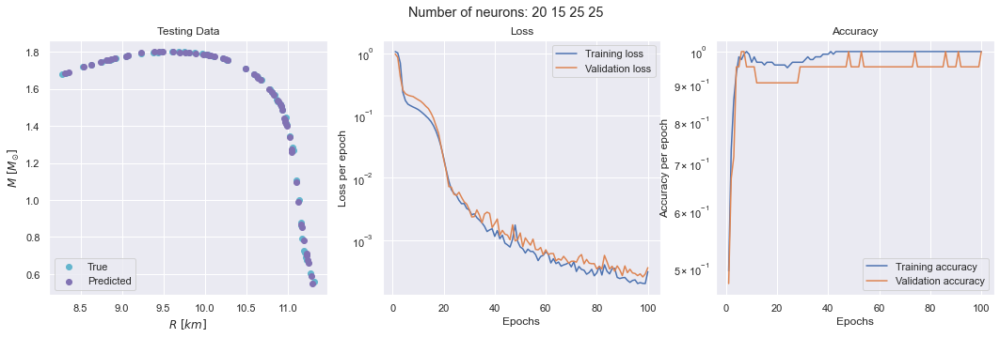

2/2 [==============================] - 0s 999us/step
The Accuracy of ANN model is: 99.79338410920006


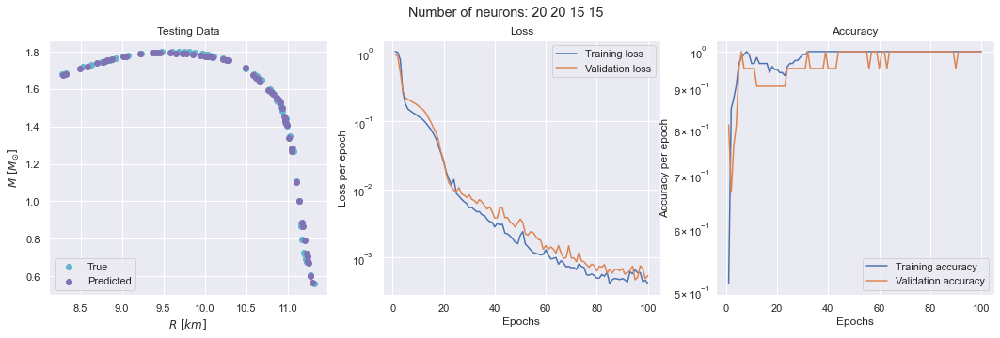

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.77447272652608


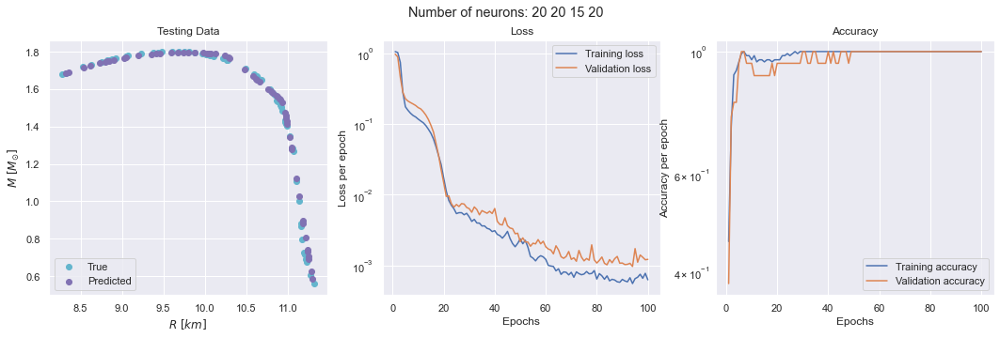

2/2 [==============================] - 0s 999us/step
The Accuracy of ANN model is: 99.82362647593088


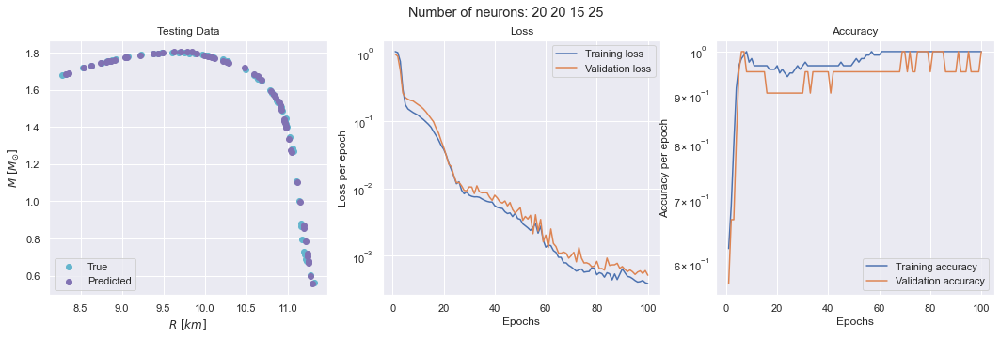

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.85976772439226


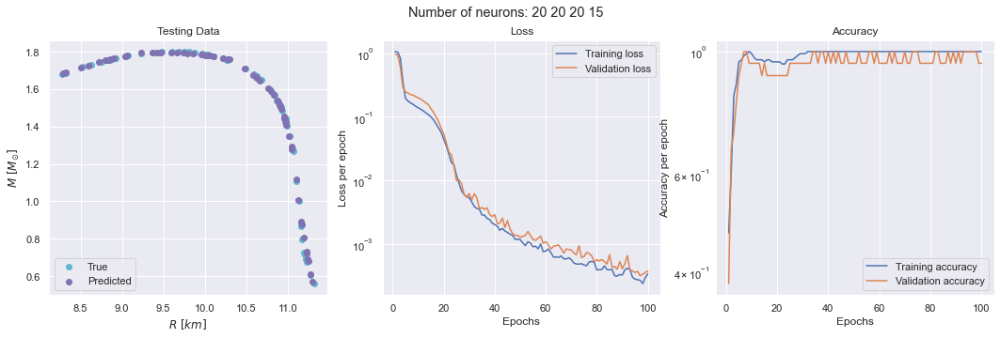

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.87446847040302


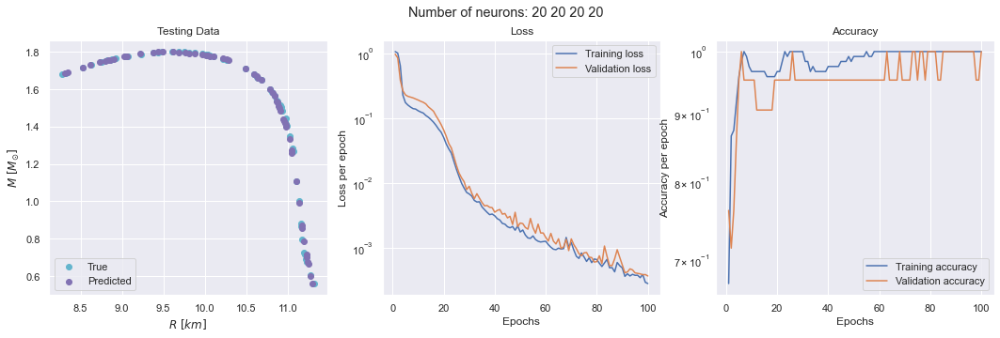

2/2 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.77891964764699


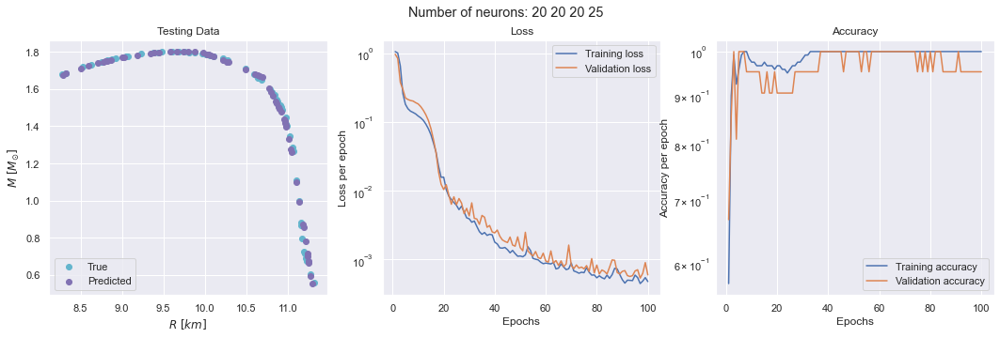

2/2 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.87793131914815


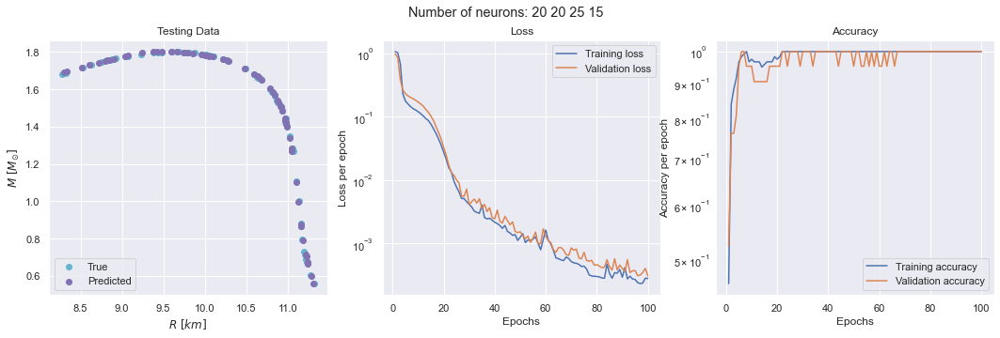

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.88472667606017


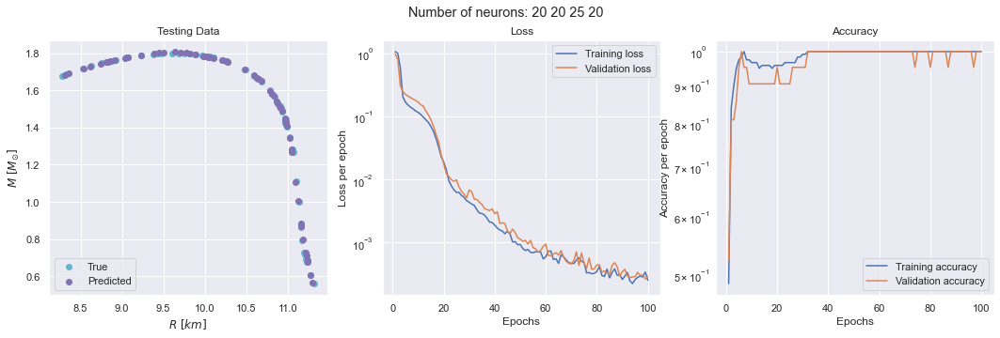

2/2 [==============================] - 0s 1000us/step
The Accuracy of ANN model is: 99.82187830952115


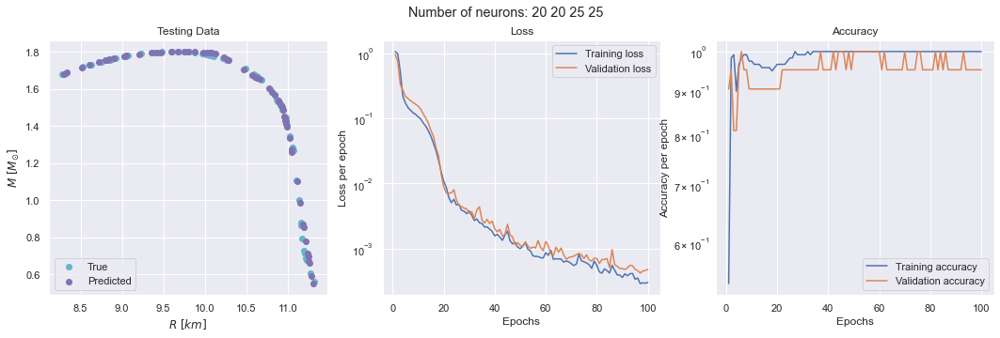

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.75215400974837


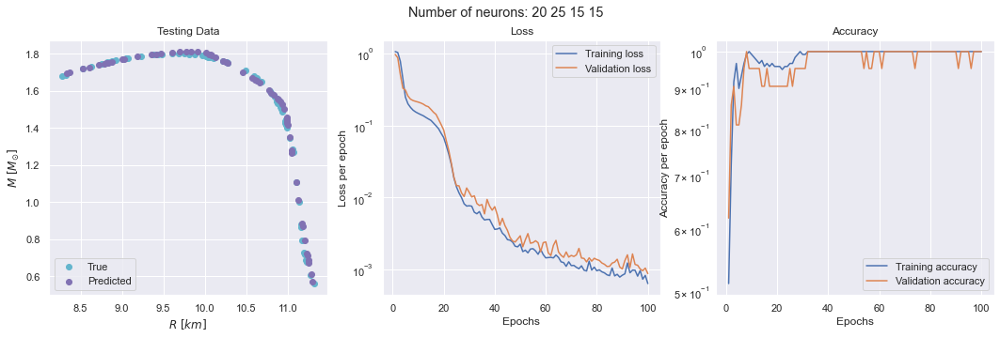

2/2 [==============================] - 0s 1000us/step
The Accuracy of ANN model is: 99.74871315852408


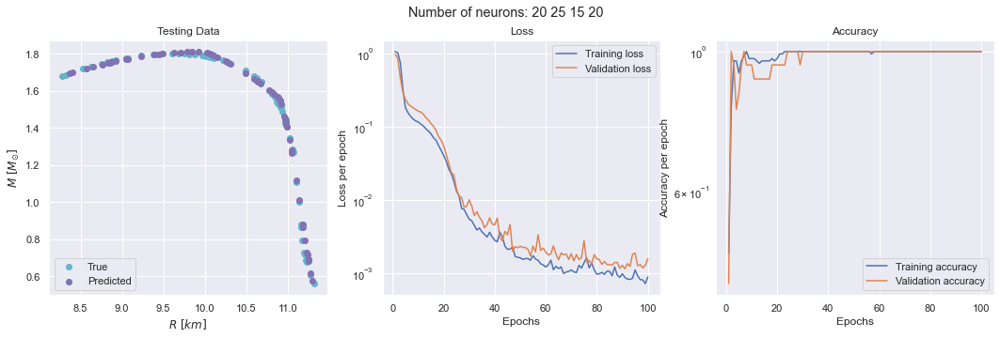

2/2 [==============================] - 1s 2ms/step
The Accuracy of ANN model is: 99.85822509701099


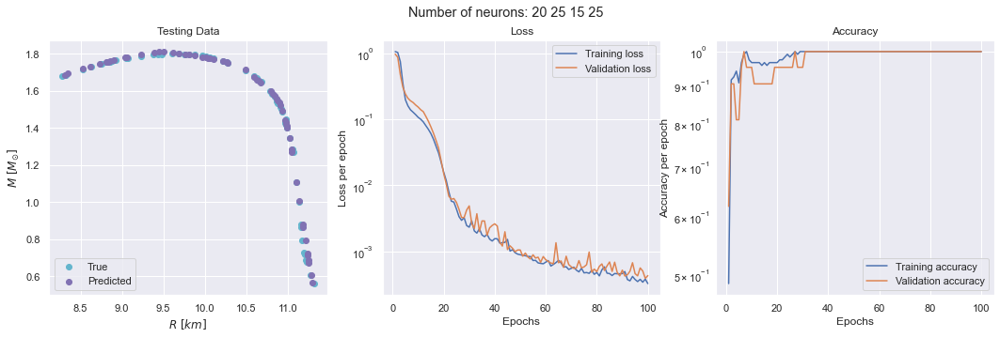

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.80829361292314


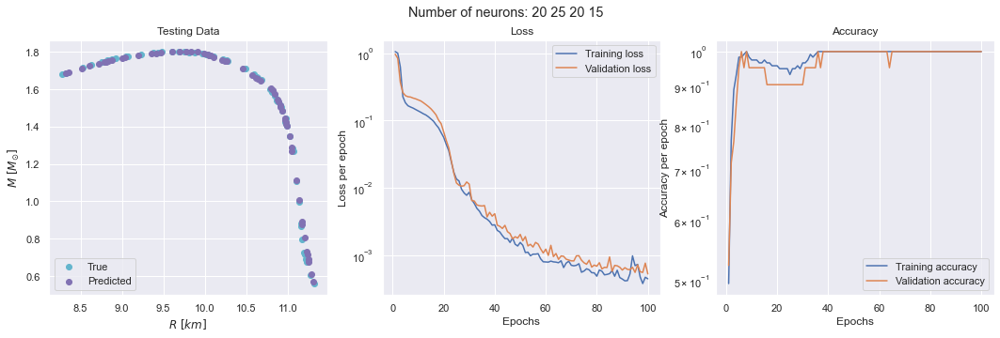

2/2 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.85534773364013


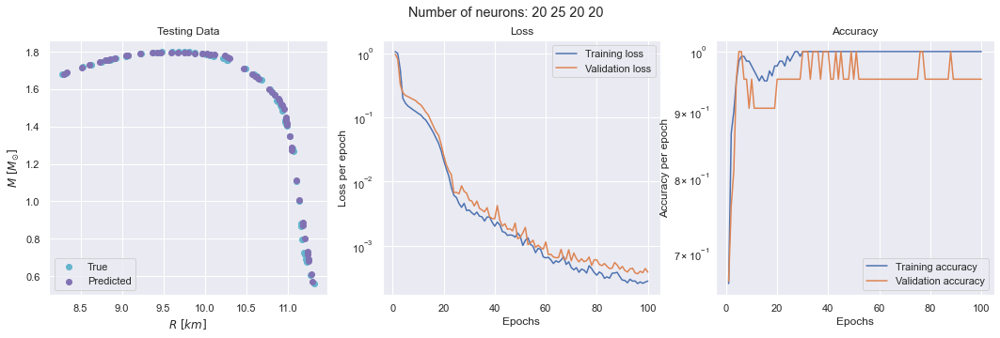

2/2 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.84999112552279


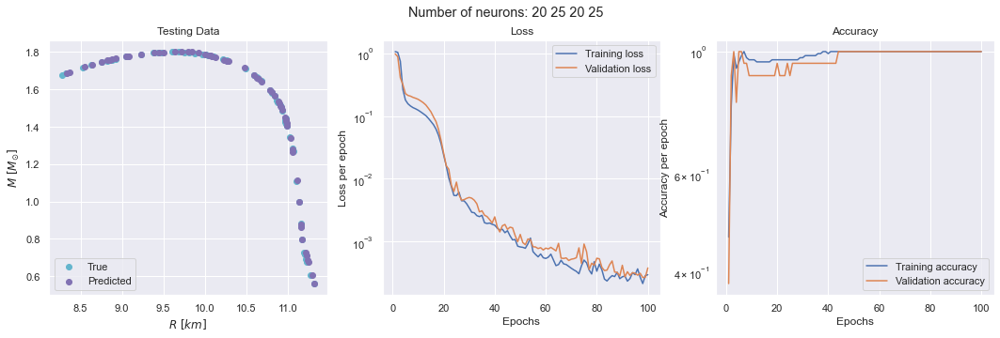

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.8403644438909


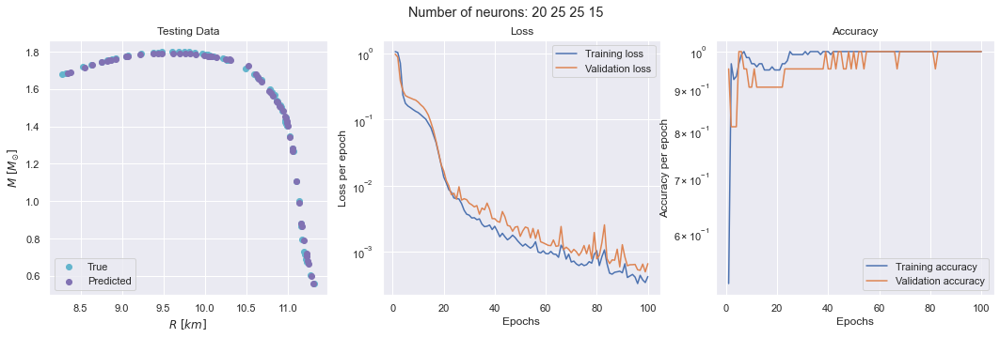

2/2 [==============================] - 0s 1000us/step
The Accuracy of ANN model is: 99.88673360167739


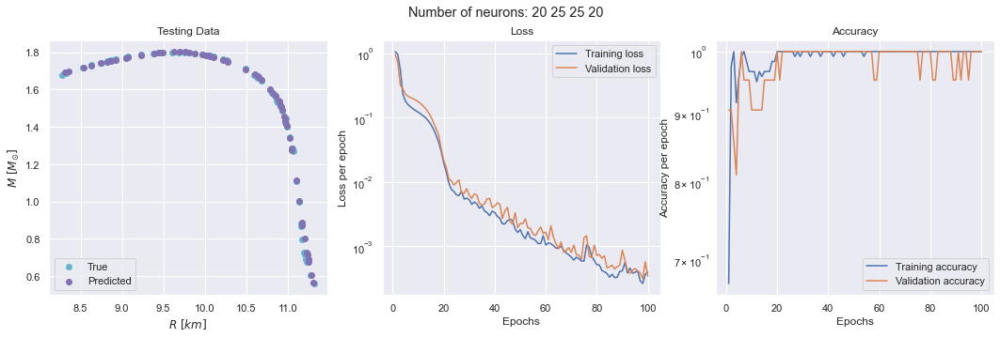

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.86784672801804


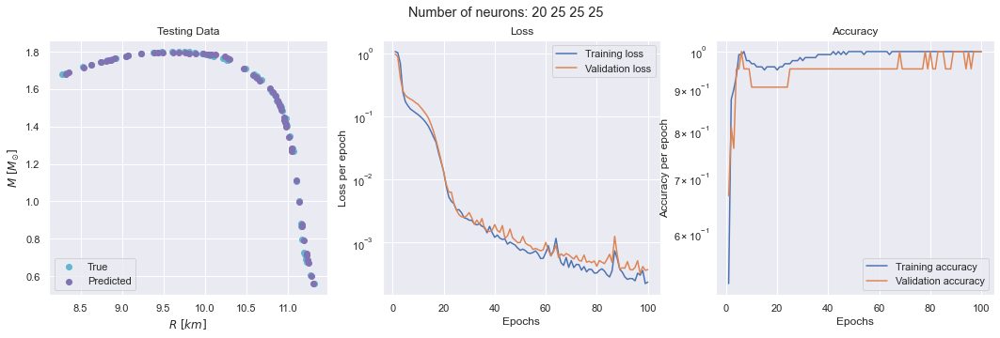

2/2 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.78921148472887


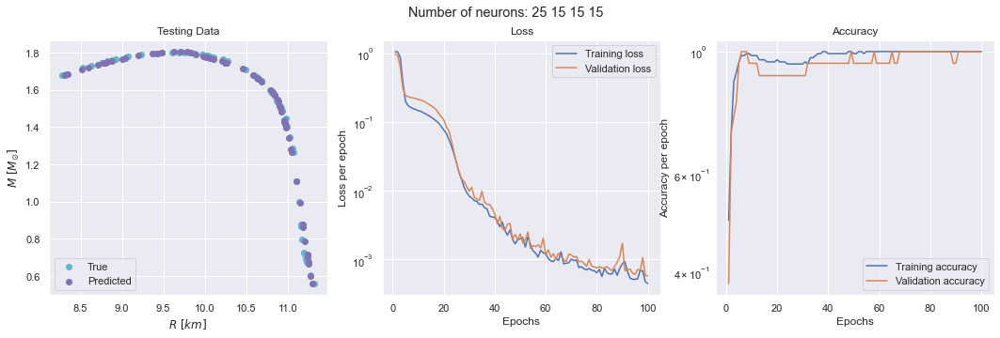

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.78297275397628


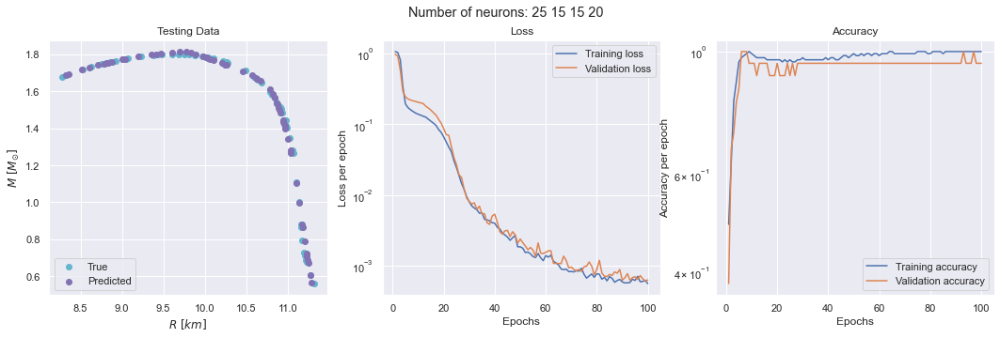

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.82351011611117


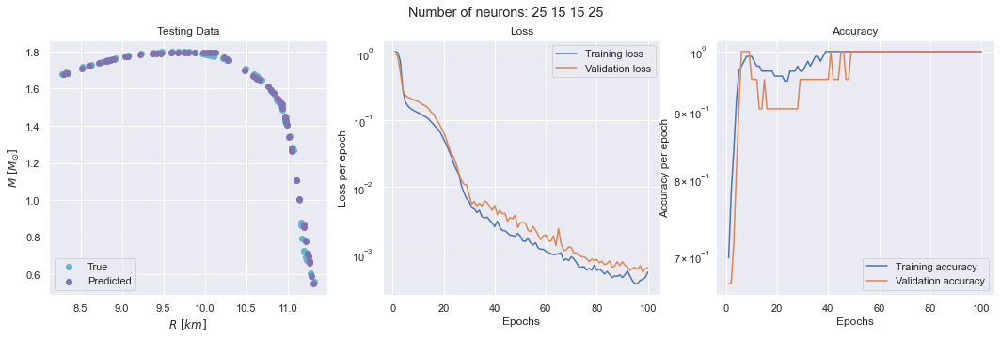

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.79478276633432


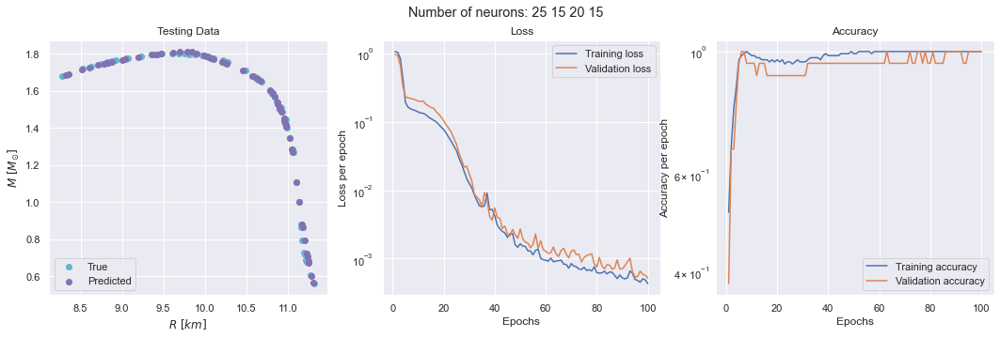

2/2 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.82810108787095


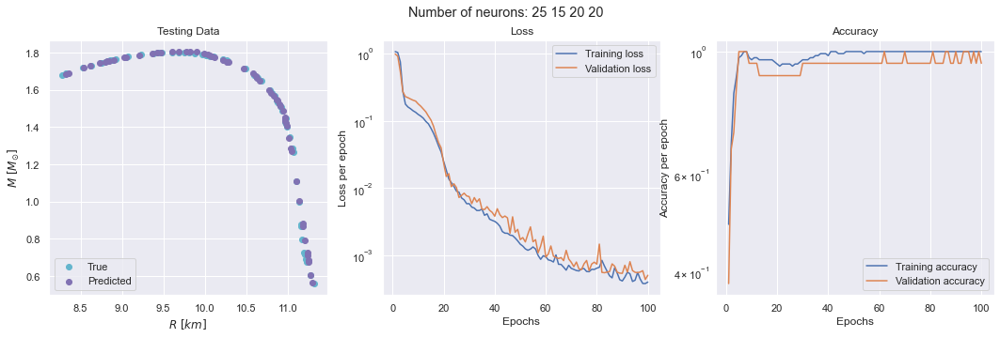

2/2 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.83875891250533


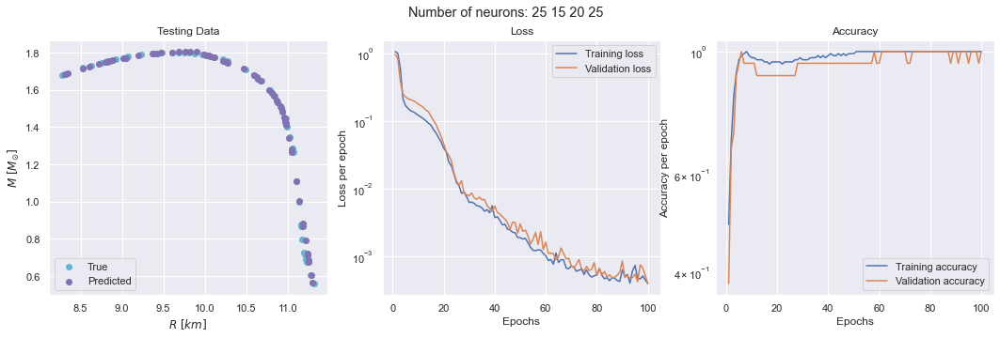

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.88669816910782


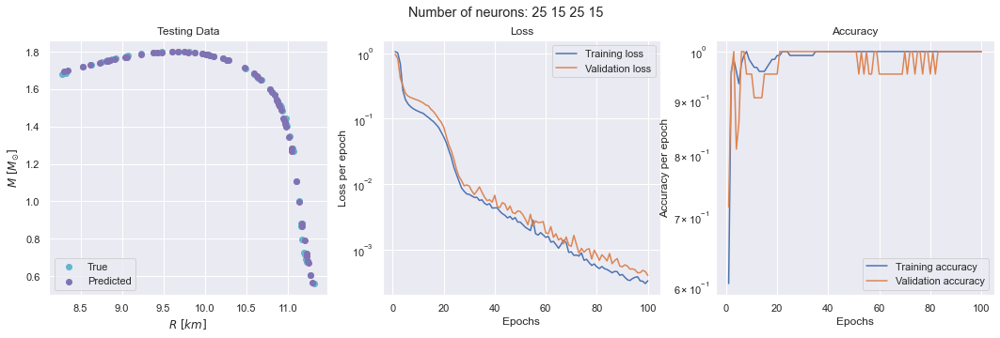

2/2 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.8410330419825


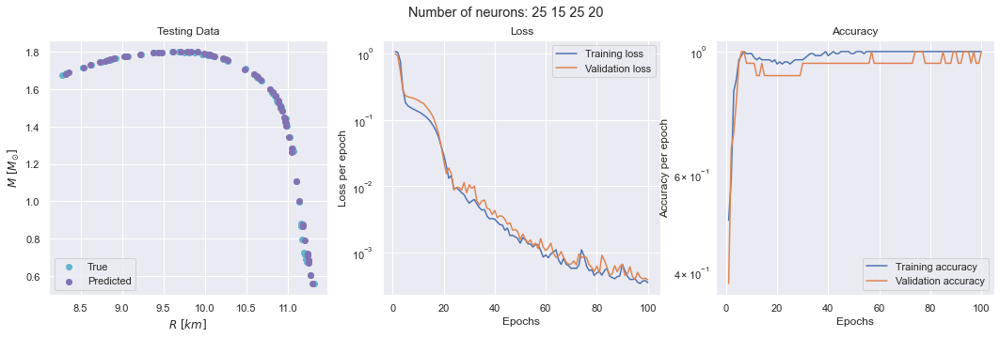

2/2 [==============================] - 0s 999us/step
The Accuracy of ANN model is: 99.83122983146396


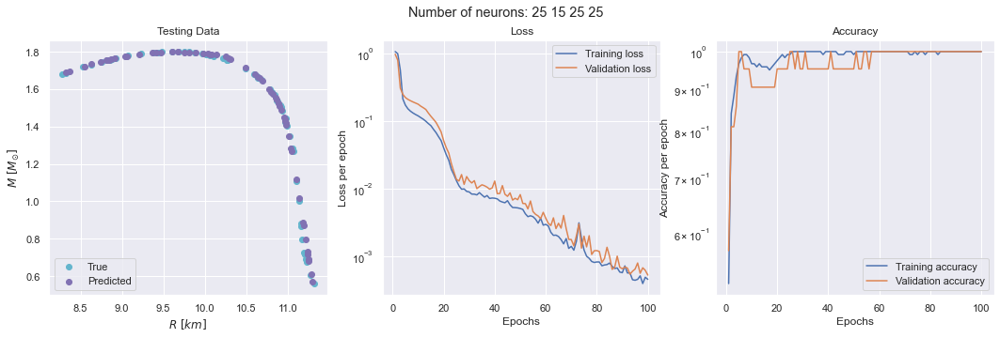

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.8798808380475


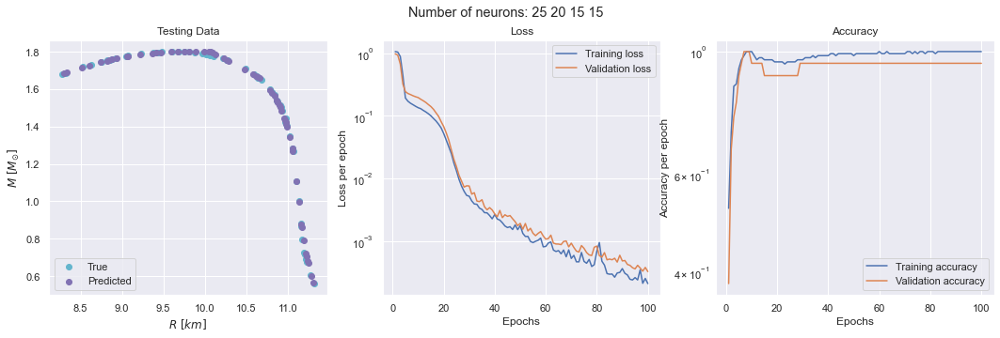

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.80797576955008


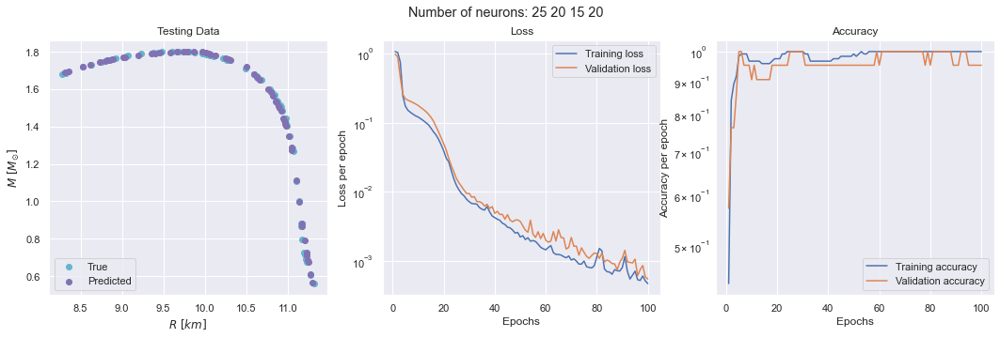

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.76717264360748


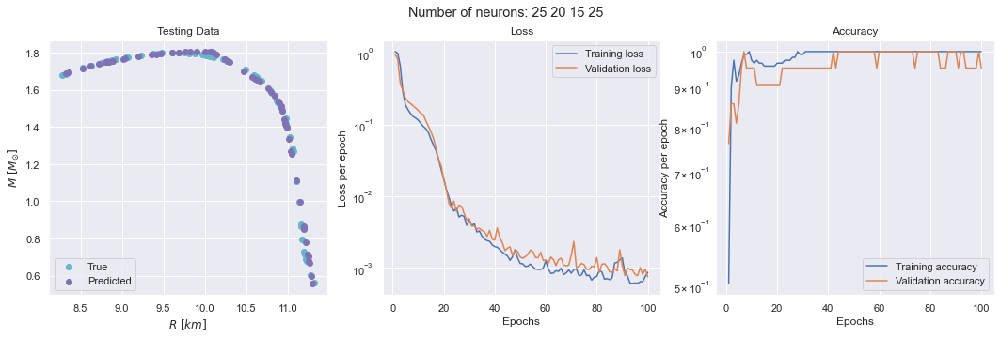

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.86063445409064


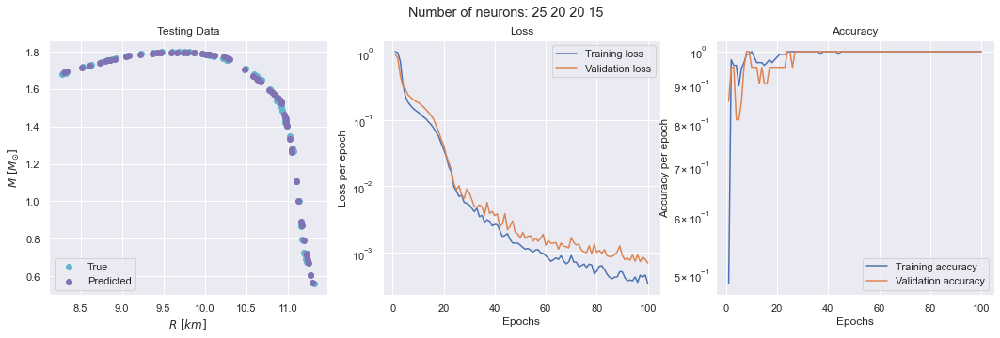

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.87194174475509


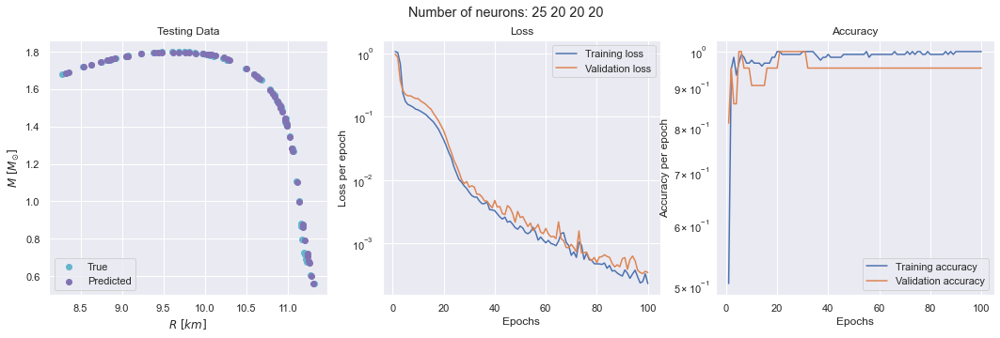

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.87610528056224


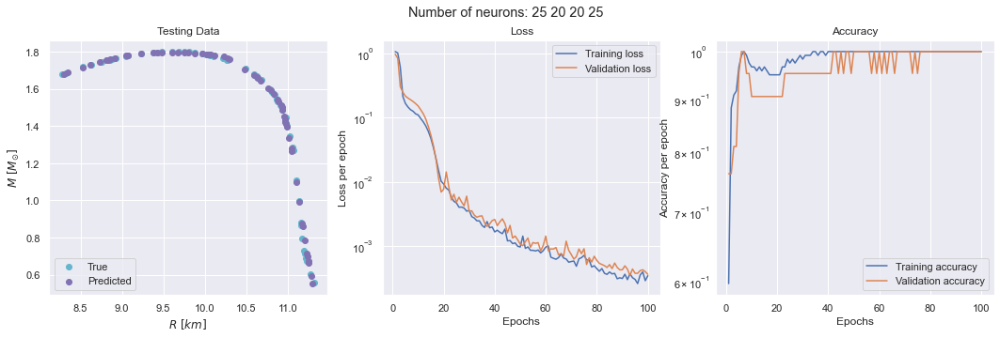

2/2 [==============================] - 0s 1000us/step
The Accuracy of ANN model is: 99.84577631978632


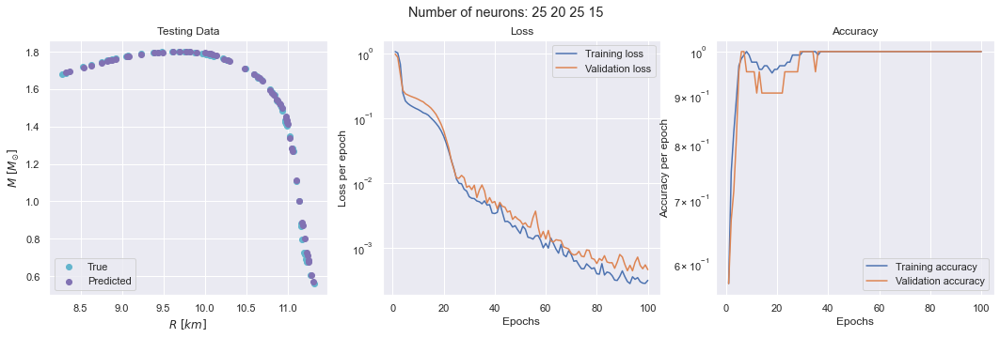

2/2 [==============================] - 0s 999us/step
The Accuracy of ANN model is: 99.8925246751705


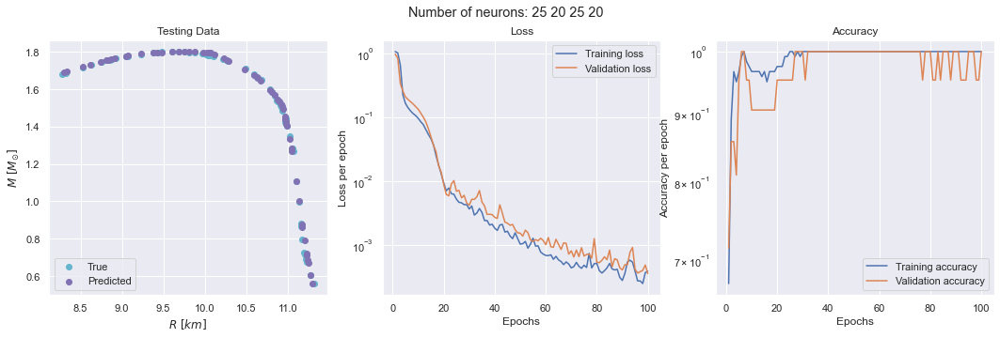

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.83875987861977


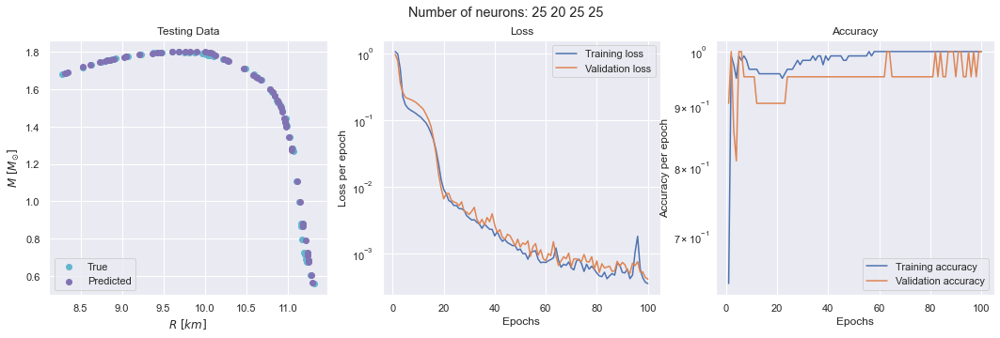

2/2 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.75050208684213


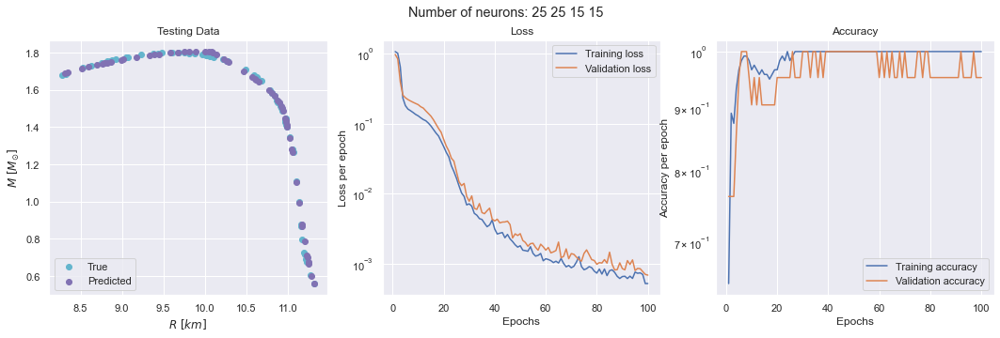

2/2 [==============================] - 0s 1000us/step
The Accuracy of ANN model is: 99.79809435220754


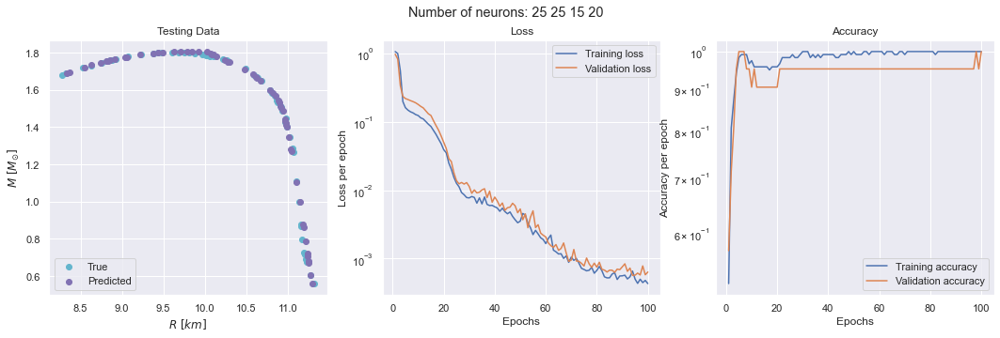

2/2 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.86367451407638


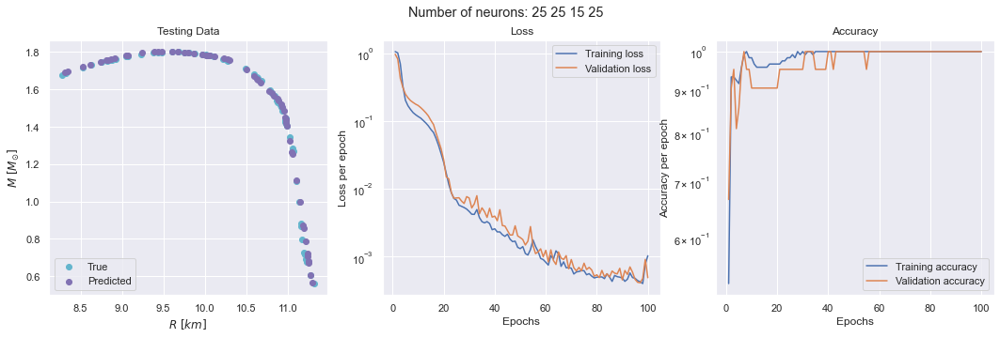

2/2 [==============================] - 0s 1000us/step
The Accuracy of ANN model is: 99.88777722969431


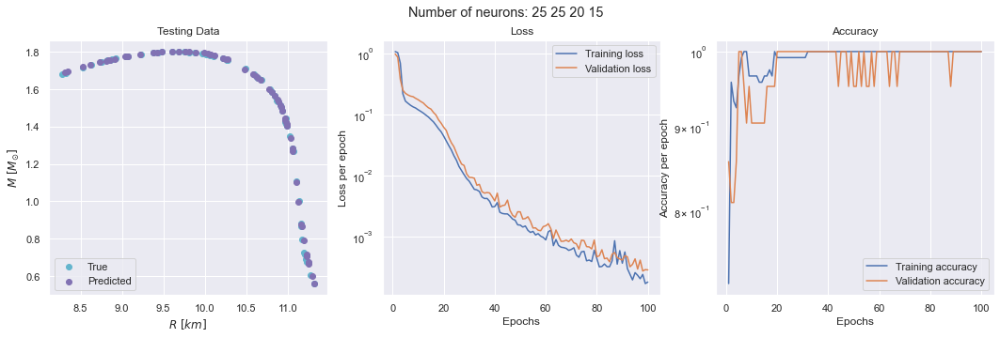

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.88191138433763


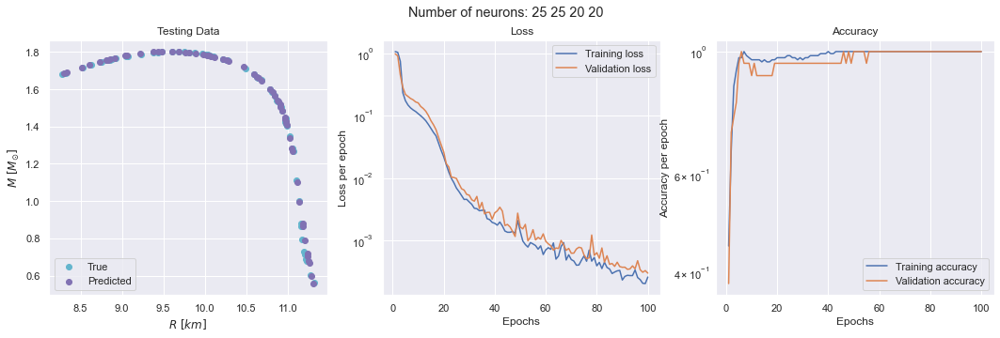

2/2 [==============================] - 0s 1000us/step
The Accuracy of ANN model is: 99.90153704644327


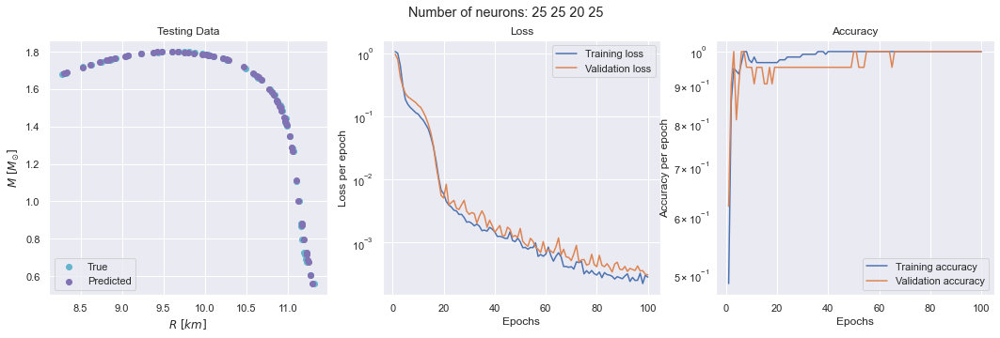

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.9043330930953


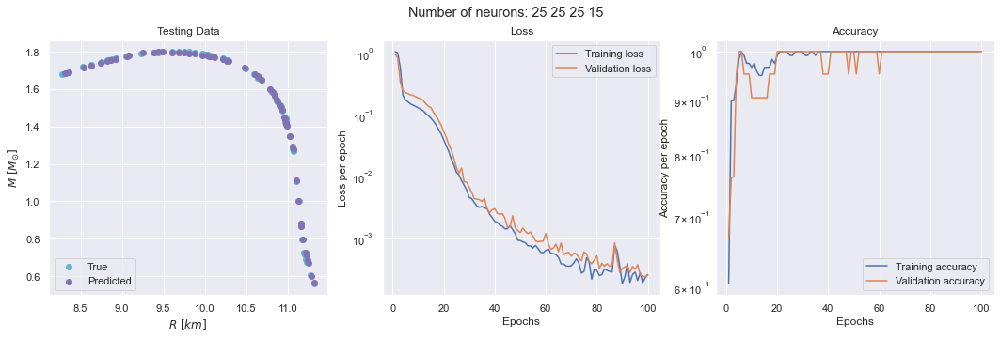

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.8886470547993


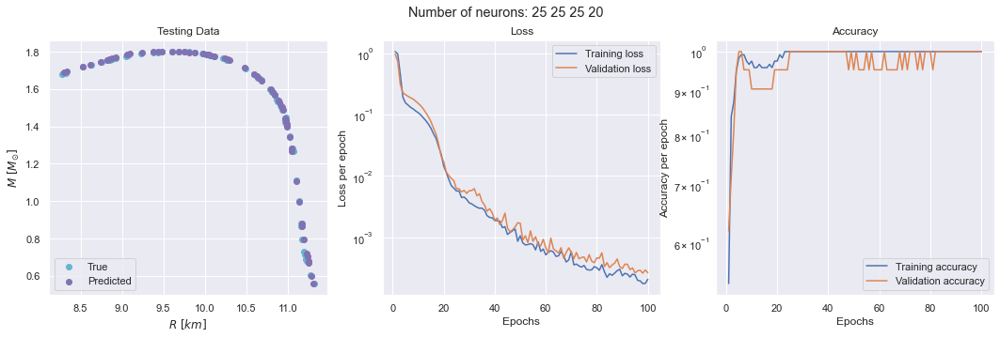

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.82971383741008


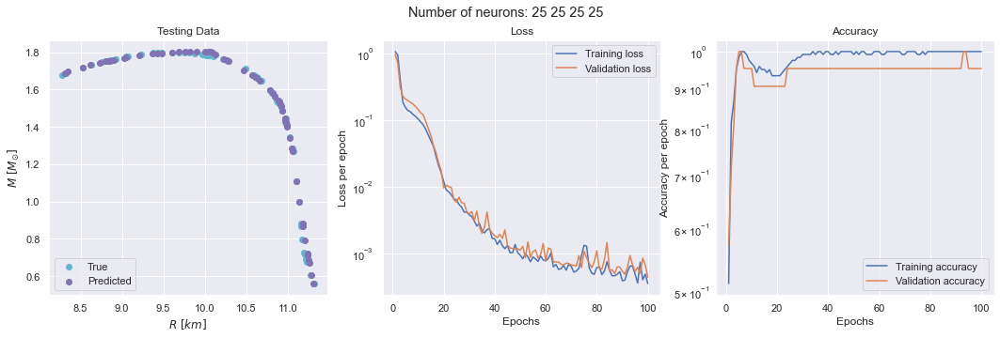

In [ ]:
eps         = 100
neuron_list = [15,20,25]
ape_list    = []
accur_list  = []
neu_list    = []
dist_list   = []

for i in neuron_list:
    for j in neuron_list:
        for k in neuron_list:
            for l in neuron_list:
                
                model = Sequential()
                
                model.add(Dense(units = i, input_dim=X_train.shape[1], kernel_initializer='normal', activation='tanh'))

                # Defining the hidden layers of the model
                model.add(Dense(units = j, kernel_initializer='normal', activation='tanh'))

                model.add(Dense(units = k, kernel_initializer='normal', activation='relu'))

                model.add(Dense(units = l, kernel_initializer='normal', activation='tanh'))

#                 model.add(Dense(units=20, kernel_initializer='normal', activation='relu'))

                model.add(Dense(2, kernel_initializer='normal'))


                model.compile(loss='mean_squared_error', optimizer='adam', metrics=['accuracy'])

                trial = model.fit(X_train, y_train ,batch_size = 5, epochs = eps, verbose=0, validation_split = 0.15)

                Predictions=model.predict(X_test)

                Predictions=TargetVarScalerFit.inverse_transform(Predictions)

                y_test_orig=TargetVarScalerFit.inverse_transform(y_test)

                Test_Data=PredictorScalerFit.inverse_transform(X_test)

                TestingData=pd.DataFrame(data=Test_Data, columns=Predictors)

                TestingData['M'] = y_test_orig.T[0]
                TestingData['R'] = y_test_orig.T[1]

                TestingData['M_pred'] = Predictions.T[0]
                TestingData['R_pred'] = Predictions.T[1]

                Testing_norm   = np.sqrt(TestingData.M.values**2 + TestingData.R.values**2)
                Predicted_norm = np.sqrt(TestingData.M_pred.values**2 + TestingData.R_pred.values**2)
                Test_pred_norm = np.sqrt((TestingData.M.values-TestingData.M_pred.values)**2 + (TestingData.R.values-TestingData.R_pred.values)**2)

                APE=100*(Test_pred_norm/Testing_norm)
                TestingData['APE']=APE

                print('The Accuracy of ANN model is:', 100-np.mean(APE))

                import matplotlib.pyplot as plt
                x1 = TestingData.R.values
                y1 = TestingData.M.values

                x2 = TestingData.R_pred.values
                y2 = TestingData.M_pred.values

                fig, ax = plt.subplots(1, 3, figsize=(18,5))
                ax[0].scatter(x1,y1, color = 'c', label = 'True')
                ax[0].scatter(x2,y2, color = 'm', label = 'Predicted')
                ax[0].legend()
                ax[0].set_xlabel('$ R \ [km] $')
                ax[0].set_ylabel('$ M \ [M_{\odot}] $')
                ax[0].set_title("Testing Data")


                val_loss_list = trial.history['val_loss']
                loss_list     = trial.history['loss']
                epos          = np.linspace(1,eps,eps)
                ax[1].semilogy(epos, loss_list    , label = 'Training loss')
                ax[1].semilogy(epos, val_loss_list, label = 'Validation loss')
                ax[1].set_xlabel('Epochs')
                ax[1].set_ylabel('Loss per epoch')
                ax[1].legend()
                ax[1].set_title("Loss")

                val_acc_list = trial.history['val_accuracy']
                acc_list     = trial.history['accuracy']
                epos         = np.linspace(1,eps,eps)
                ax[2].semilogy(epos, acc_list    , label = 'Training accuracy')
                ax[2].semilogy(epos, val_acc_list, label = 'Validation accuracy')
                ax[2].set_xlabel('Epochs')
                ax[2].set_ylabel('Accuracy per epoch')
                ax[2].legend()
                ax[2].set_title("Accuracy")

                distance = np.array(acc_list)-np.array(val_acc_list)
                distance = np.mean(distance[-10:])
                
                neu_list.append(str(i)+" "+str(j)+" "+str(k)+" "+str(l))
                ape_list.append(100-np.mean(APE))
                dist_list.append(distance)
                accur_list.append(np.mean(acc_list))
                
                fig.suptitle('Number of neurons: '+str(i)+" "+str(j)+" "+str(k)+" "+str(l))
                plt.show()

In [ ]:
# df = pd.DataFrame({})
# df['neurons']    = neu_list
# df['ape']        = ape_list
# df['mean_acc']   = accur_list
# df['final_dist'] = dist_list
# df.to_pickle(r'C:\Users\admin\Desktop\Γιάννης\Πτυχιακή\files\layers_4_to_choose.pkl')

APE filter: ['25 25 20 25' '25 25 25 15']
Accuracy filter: ['20 25 25 20' '25 25 20 15']


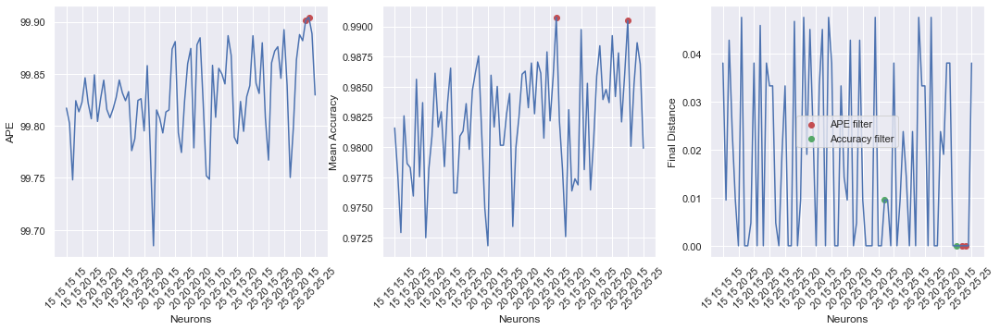

In [ ]:
df = pd.read_pickle(r'C:\Users\admin\Desktop\Γιάννης\Πτυχιακή\files\layers_4_to_choose.pkl')


x  = df.neurons.values
y1 = df.ape.values
y2 = df.mean_acc.values
y3 = df.final_dist.values

import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 3, figsize=(18,5))
ax[0].plot(x,y1)
ax[0].set_ylabel('APE')
ax[0].scatter(x[y1 > 99.9], y1[y1 > 99.9], color = 'r')

ax[1].plot(x,y2)
ax[1].set_ylabel('Mean Accuracy')
ax[1].scatter(x[y2 > 0.99], y2[y2 > 0.99], color = 'r')

ax[2].plot(x,y3)
ax[2].set_ylabel('Final Distance')
ax[2].scatter(x[y1 > 99.9], y3[y1 > 99.9], color = 'r', label = 'APE filter')
ax[2].scatter(x[y2 > 0.99], y3[y2 > 0.99], color = 'g', label = 'Accuracy filter')
ax[2].legend()


ax[0].set_xlabel('Neurons')
ax[1].set_xlabel('Neurons')
ax[2].set_xlabel('Neurons')
ax[0].xaxis.set_major_locator(plt.MaxNLocator(20))
ax[0].tick_params(axis='x', labelrotation=45)
ax[1].xaxis.set_major_locator(plt.MaxNLocator(20))
ax[1].tick_params(axis='x', labelrotation=45)
ax[2].xaxis.set_major_locator(plt.MaxNLocator(20))
ax[2].tick_params(axis='x', labelrotation=45)

print('APE filter:', x[y1 > 99.9])
print('Accuracy filter:', x[y2 > 0.99])

## Searching for the best Activation Functions

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.68780688395148


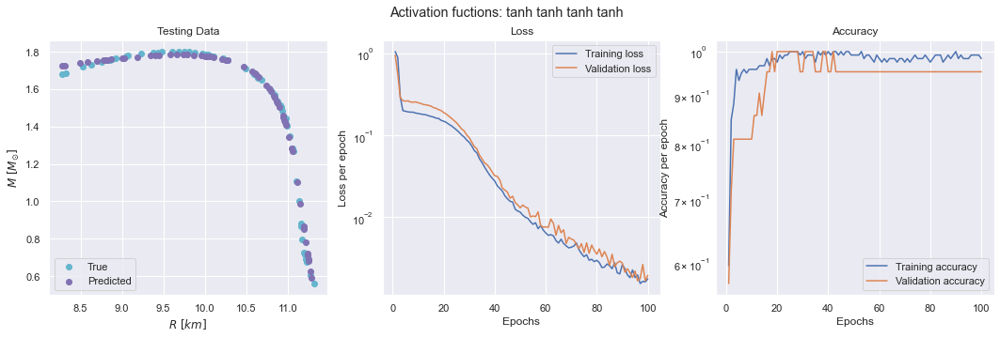

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.83309775066388


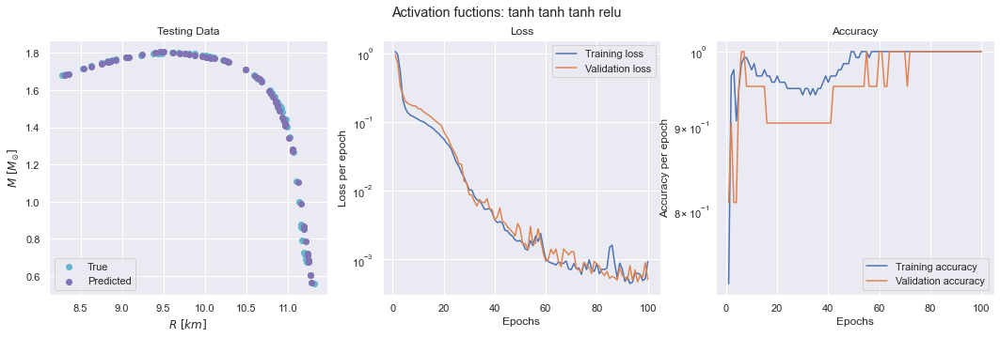

2/2 [==============================] - 0s 1000us/step
The Accuracy of ANN model is: 99.78891499492744


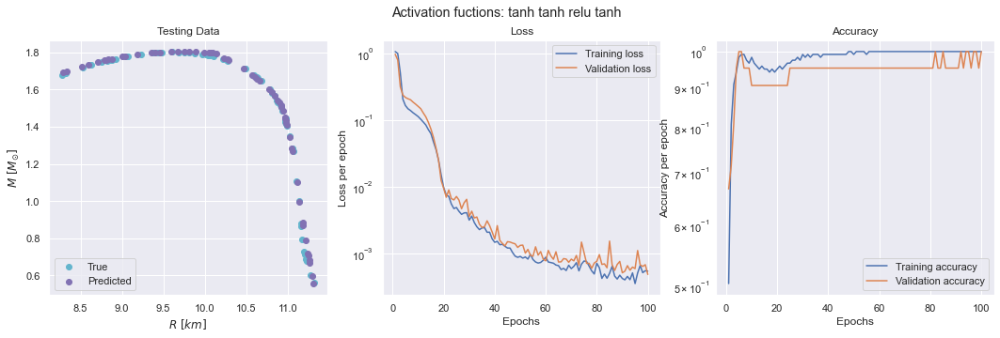

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.8760887138731


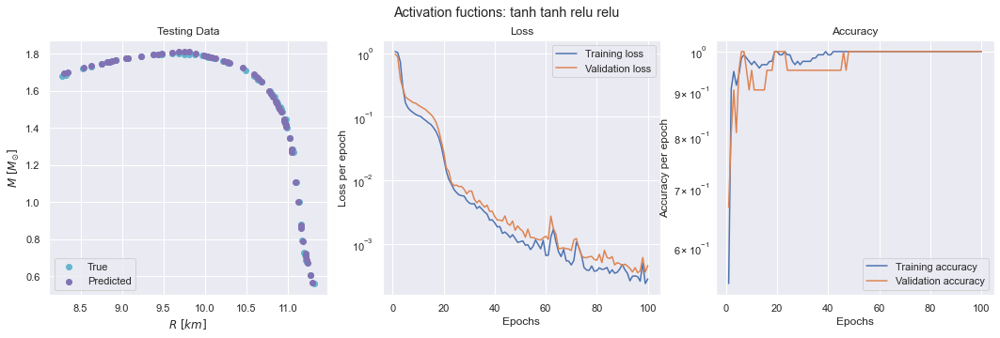

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.88162131280141


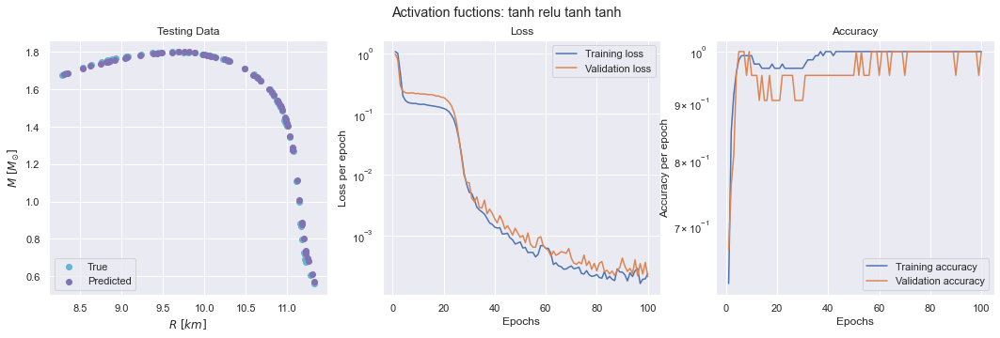

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.85859170345712


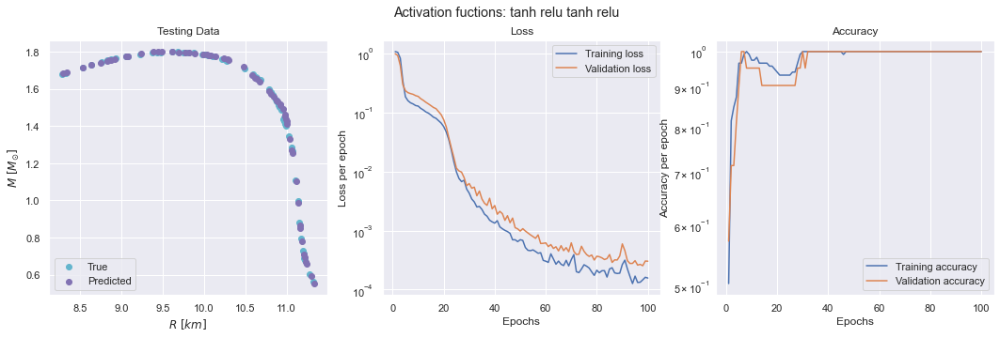

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.87418108846431


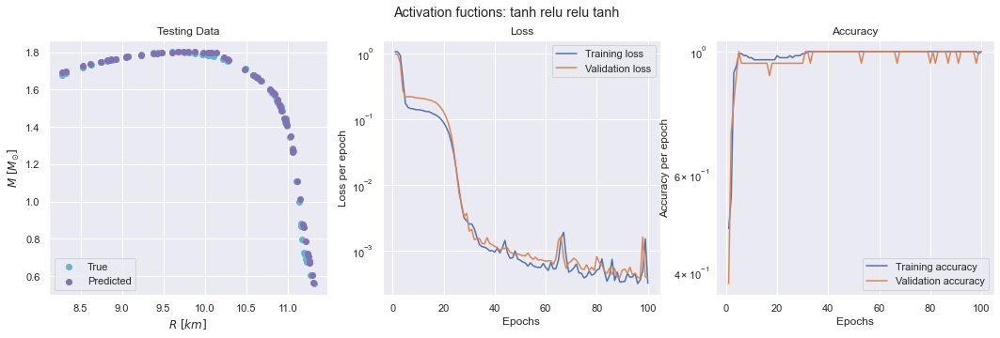

2/2 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.89306122004459


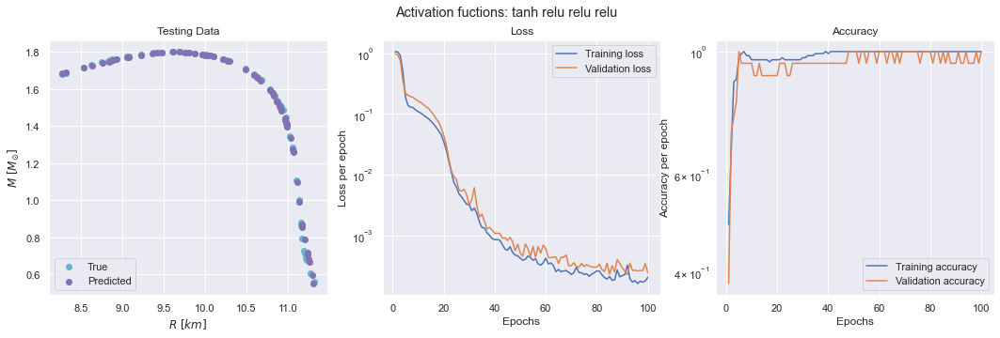

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.74288675463364


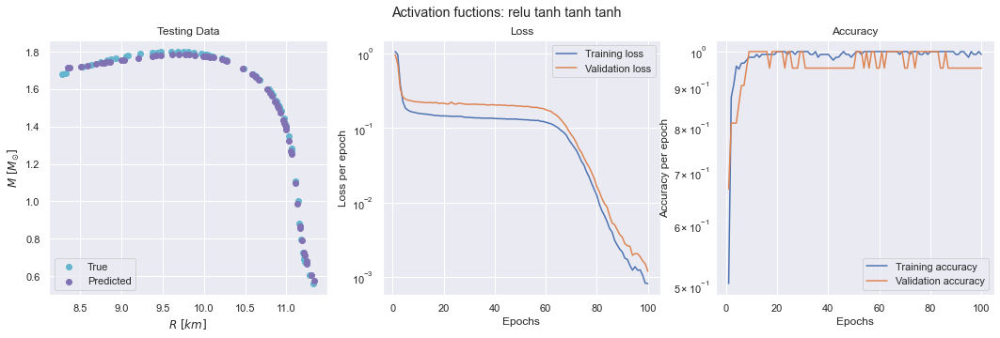

2/2 [==============================] - 0s 1000us/step
The Accuracy of ANN model is: 99.8680976289853


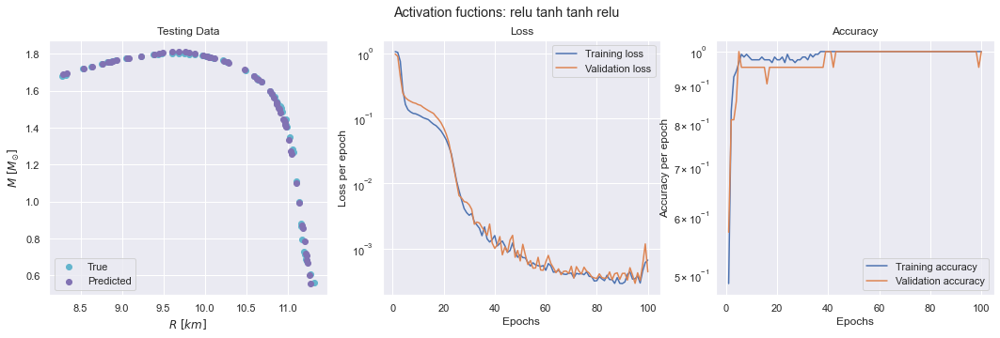

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.83694280400542


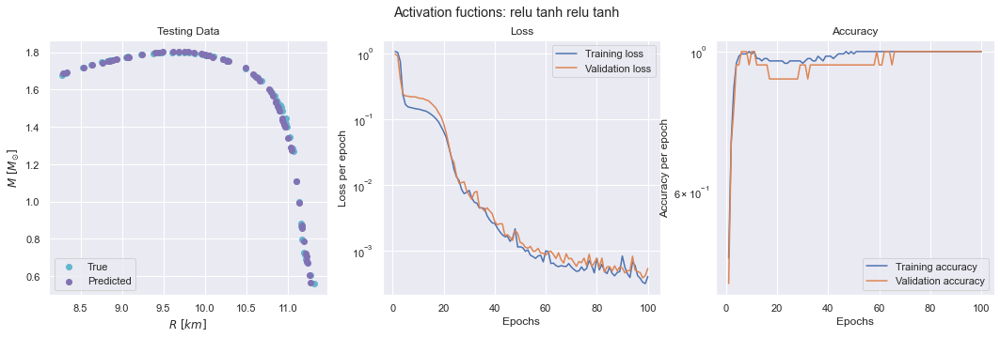

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.8858026761806


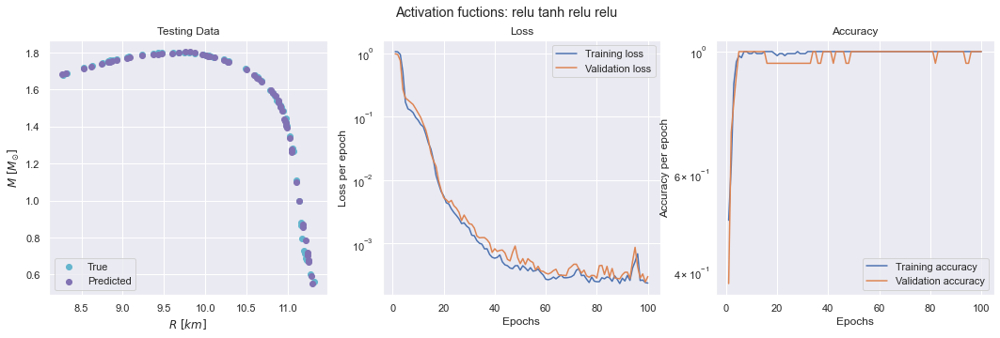

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.88465553300755


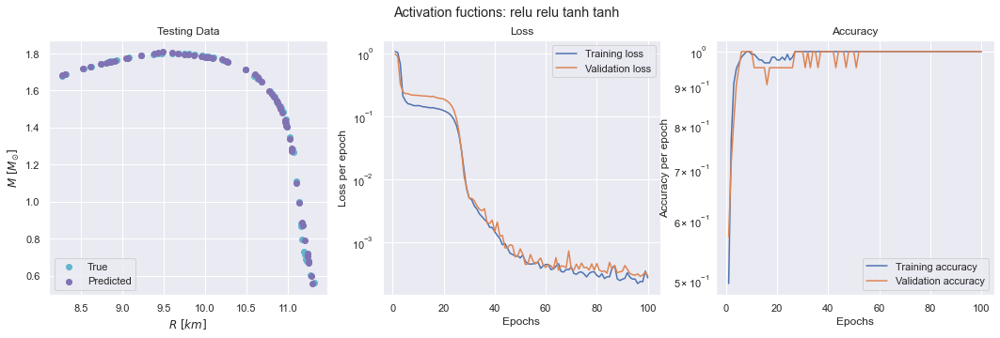

2/2 [==============================] - 1s 992us/step
The Accuracy of ANN model is: 99.88851628168533


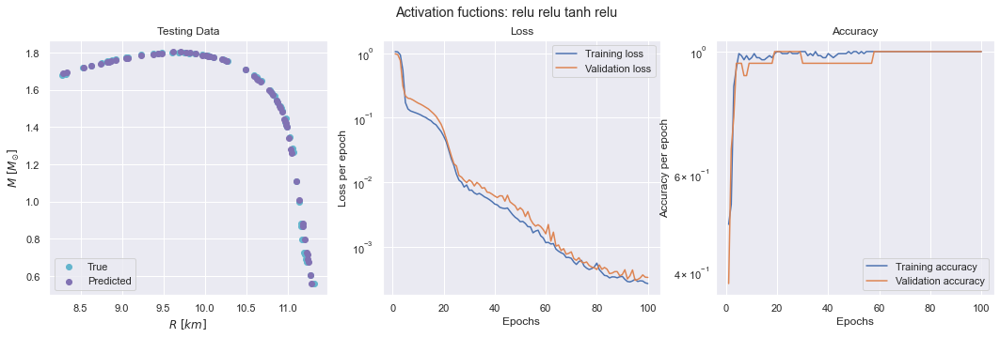

2/2 [==============================] - 0s 1000us/step
The Accuracy of ANN model is: 99.84348173562411


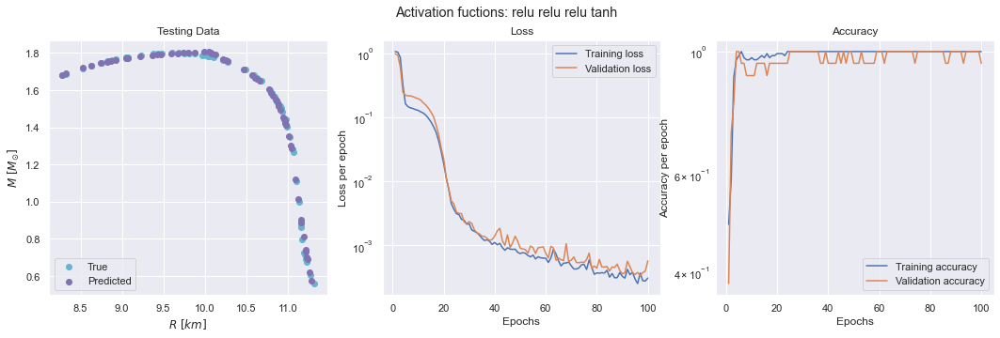

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.90934450929278


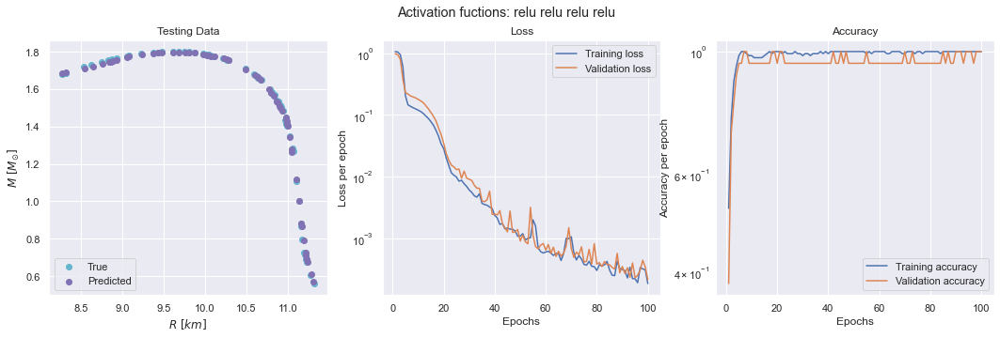

In [ ]:
eps         = 100
activ_list  = ['tanh','relu']
ape_list    = []
accur_list  = []
neu_list    = []
dist_list   = []

for i in activ_list:
    for j in activ_list:
        for k in activ_list:
            for l in activ_list:
                
                model = Sequential()
                
                model.add(Dense(units = 25, input_dim=X_train.shape[1], kernel_initializer='normal', activation=i))

                model.add(Dense(units = 25, kernel_initializer='normal', activation=j))

                model.add(Dense(units = 20, kernel_initializer='normal', activation=k))

                model.add(Dense(units = 25, kernel_initializer='normal', activation=l))

                model.add(Dense(2, kernel_initializer='normal'))


                model.compile(loss='mean_squared_error', optimizer='adam', metrics=['accuracy'])


                trial = model.fit(X_train, y_train ,batch_size = 5, epochs = eps, verbose=0, validation_split = 0.15)

                Predictions=model.predict(X_test)

                Predictions=TargetVarScalerFit.inverse_transform(Predictions)

                y_test_orig=TargetVarScalerFit.inverse_transform(y_test)

                Test_Data=PredictorScalerFit.inverse_transform(X_test)

                TestingData=pd.DataFrame(data=Test_Data, columns=Predictors)

                TestingData['M'] = y_test_orig.T[0]
                TestingData['R'] = y_test_orig.T[1]

                TestingData['M_pred'] = Predictions.T[0]
                TestingData['R_pred'] = Predictions.T[1]

                Testing_norm   = np.sqrt(TestingData.M.values**2 + TestingData.R.values**2)
                Predicted_norm = np.sqrt(TestingData.M_pred.values**2 + TestingData.R_pred.values**2)
                Test_pred_norm = np.sqrt((TestingData.M.values-TestingData.M_pred.values)**2 + (TestingData.R.values-TestingData.R_pred.values)**2)


                APE=100*(Test_pred_norm/Testing_norm)
                TestingData['APE']=APE

                print('The Accuracy of ANN model is:', 100-np.mean(APE))

                import matplotlib.pyplot as plt
                x1 = TestingData.R.values
                y1 = TestingData.M.values

                x2 = TestingData.R_pred.values
                y2 = TestingData.M_pred.values

                fig, ax = plt.subplots(1, 3, figsize=(18,5))
                ax[0].scatter(x1,y1, color = 'c', label = 'True')
                ax[0].scatter(x2,y2, color = 'm', label = 'Predicted')
                ax[0].legend()
                ax[0].set_xlabel('$ R \ [km] $')
                ax[0].set_ylabel('$ M \ [M_{\odot}] $')
                ax[0].set_title("Testing Data")


                val_loss_list = trial.history['val_loss']
                loss_list     = trial.history['loss']
                epos          = np.linspace(1,eps,eps)
                ax[1].semilogy(epos, loss_list    , label = 'Training loss')
                ax[1].semilogy(epos, val_loss_list, label = 'Validation loss')
                ax[1].set_xlabel('Epochs')
                ax[1].set_ylabel('Loss per epoch')
                ax[1].legend()
                ax[1].set_title("Loss")

                val_acc_list = trial.history['val_accuracy']
                acc_list     = trial.history['accuracy']
                epos         = np.linspace(1,eps,eps)
                ax[2].semilogy(epos, acc_list    , label = 'Training accuracy')
                ax[2].semilogy(epos, val_acc_list, label = 'Validation accuracy')
                ax[2].set_xlabel('Epochs')
                ax[2].set_ylabel('Accuracy per epoch')
                ax[2].legend()
                ax[2].set_title("Accuracy")

                distance = np.array(acc_list)-np.array(val_acc_list)
                distance = np.mean(distance[-10:])
                
                neu_list.append(str(i)+" "+str(j)+" "+str(k)+" "+str(l))
                ape_list.append(100-np.mean(APE))
                dist_list.append(distance)
                accur_list.append(np.mean(acc_list))
                
                fig.suptitle('Activation fuctions: '+str(i)+" "+str(j)+" "+str(k)+" "+str(l))
                plt.show()

In [ ]:
# df = pd.DataFrame({})
# df['act_func']    = neu_list
# df['ape']        = ape_list
# df['mean_acc']   = accur_list
# df['final_dist'] = dist_list
# df.to_pickle(r'C:\Users\admin\Desktop\Γιάννης\Πτυχιακή\files\act_func_to_choose.pkl')

APE filter: ['tanh relu relu relu' 'relu relu relu relu']
Accuracy filter: ['relu tanh tanh tanh' 'relu tanh relu relu' 'relu relu tanh tanh'
 'relu relu relu relu']


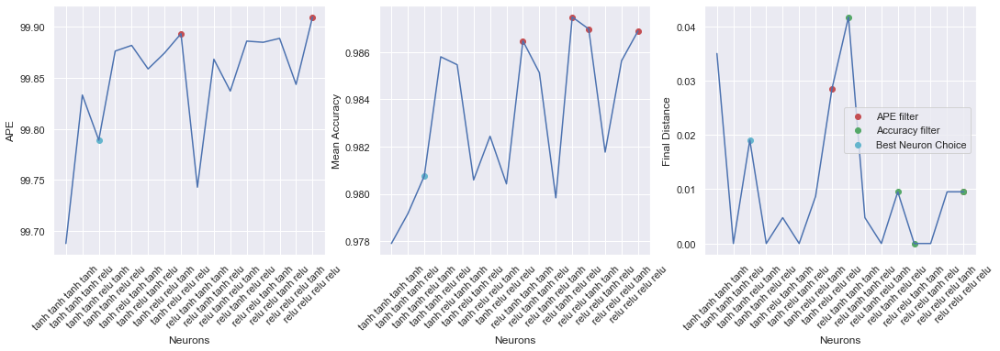

In [ ]:
df = pd.read_pickle(r'C:\Users\admin\Desktop\Γιάννης\Πτυχιακή\files\act_func_to_choose.pkl')


x  = df.act_func.values
y1 = df.ape.values
y2 = df.mean_acc.values
y3 = df.final_dist.values

import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 3, figsize=(18,5))
ax[0].plot(x,y1)
ax[0].set_ylabel('APE')
ax[0].scatter(x[y1 > 99.89], y1[y1 > 99.89], color = 'r')
ax[0].scatter(x[x == 'tanh tanh relu tanh'], y1[x == 'tanh tanh relu tanh'], color = 'c', label = 'Best Neuron Choice')


ax[1].plot(x,y2)
ax[1].set_ylabel('Mean Accuracy')
ax[1].scatter(x[y2 > 0.986], y2[y2 > 0.986], color = 'r')
ax[1].scatter(x[x == 'tanh tanh relu tanh'], y2[x == 'tanh tanh relu tanh'], color = 'c', label = 'Best Neuron Choice')

ax[2].plot(x,y3)
ax[2].set_ylabel('Final Distance')
ax[2].scatter(x[y1 > 99.89], y3[y1 > 99.89]  , color = 'r', label = 'APE filter')
ax[2].scatter(x[y2 > 0.986], y3[y2 > 0.986], color = 'g', label = 'Accuracy filter')
ax[2].scatter(x[x == 'tanh tanh relu tanh'], y3[x == 'tanh tanh relu tanh'], color = 'c', label = 'Best Neuron Choice')
ax[2].legend()


ax[0].set_xlabel('Neurons')
ax[1].set_xlabel('Neurons')
ax[2].set_xlabel('Neurons')
ax[0].xaxis.set_major_locator(plt.MaxNLocator(20))
ax[0].tick_params(axis='x', labelrotation=45)
ax[1].xaxis.set_major_locator(plt.MaxNLocator(20))
ax[1].tick_params(axis='x', labelrotation=45)
ax[2].xaxis.set_major_locator(plt.MaxNLocator(20))
ax[2].tick_params(axis='x', labelrotation=45)

print('APE filter:', x[y1 > 99.89])
print('Accuracy filter:', x[y2 > 0.986])

## 4 hidden layers - best model so far

2/2 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.72946882753737


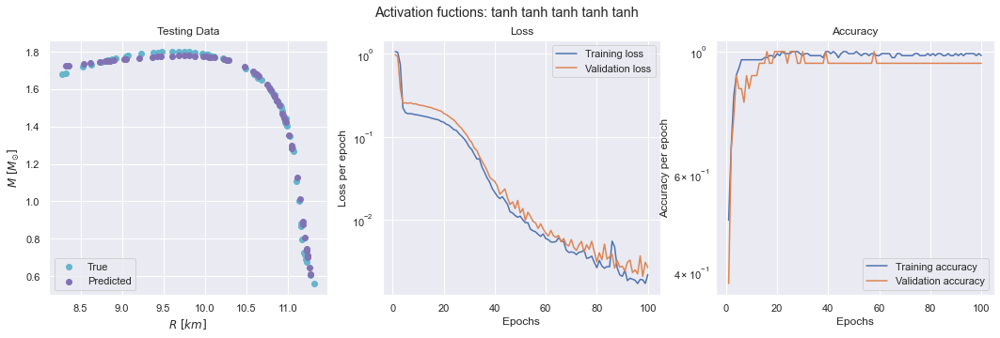

2/2 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.8059548153643


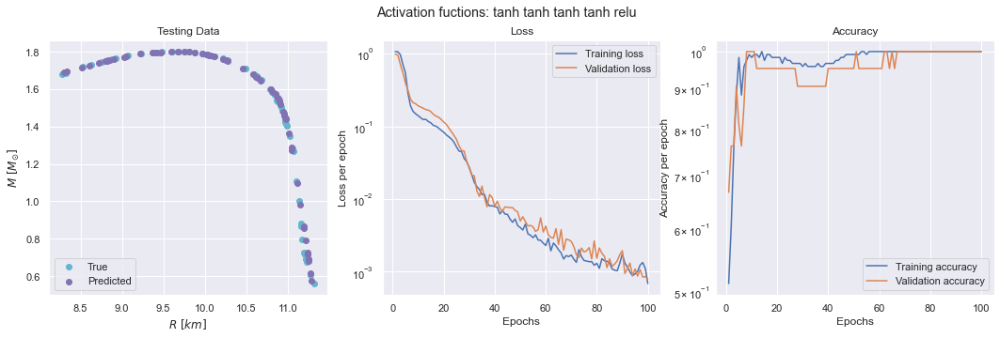

2/2 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 91.19227081694004


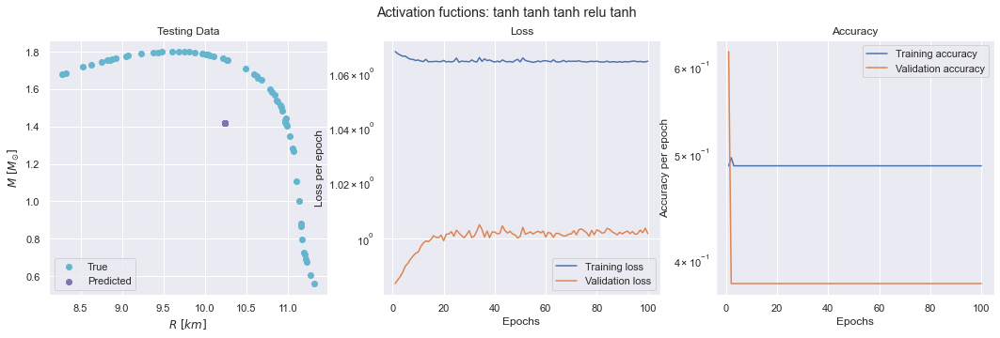

2/2 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.6882719717639


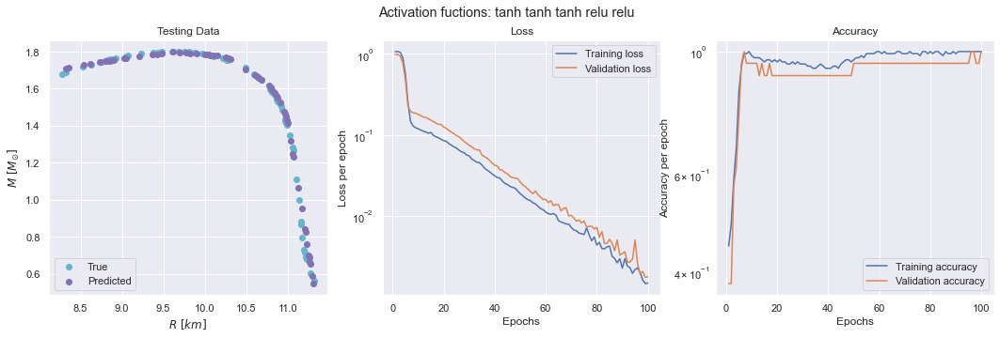

2/2 [==============================] - 0s 1000us/step
The Accuracy of ANN model is: 99.78127336617082


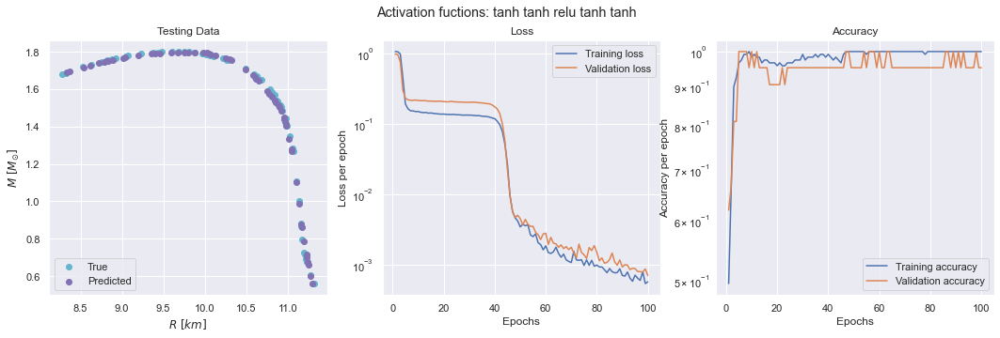

2/2 [==============================] - 0s 1000us/step
The Accuracy of ANN model is: 99.84390013338937


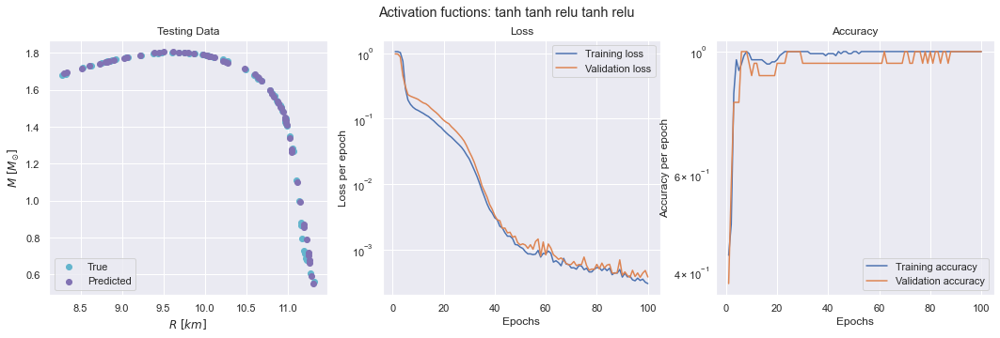

2/2 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.85105500419482


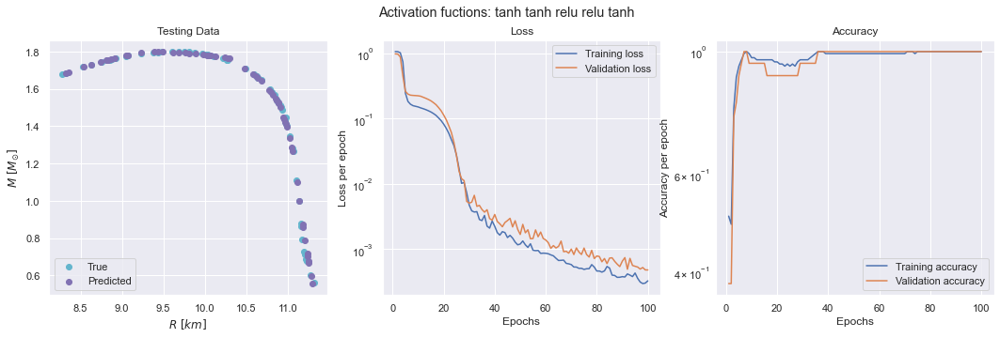

2/2 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.89042362128487


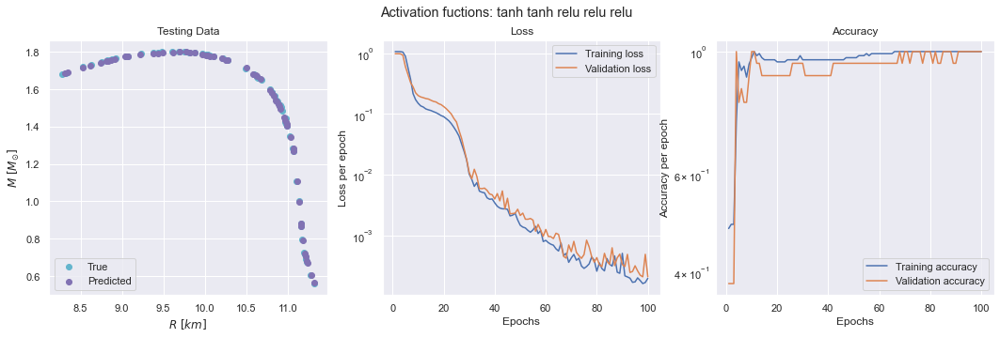

2/2 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.78044966402523


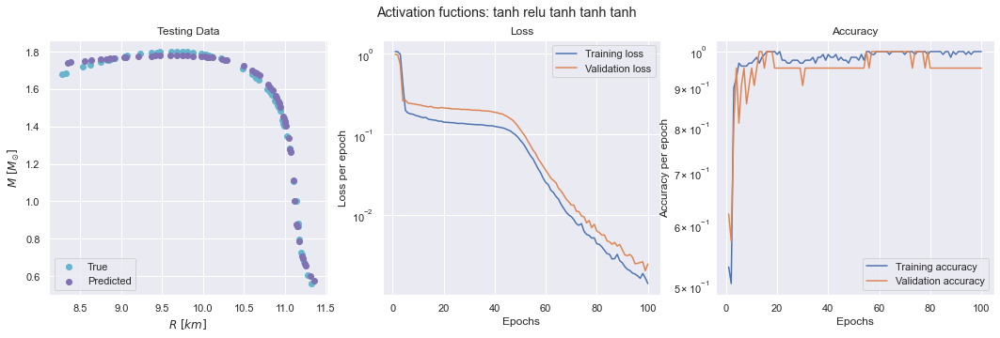

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.8155528855082


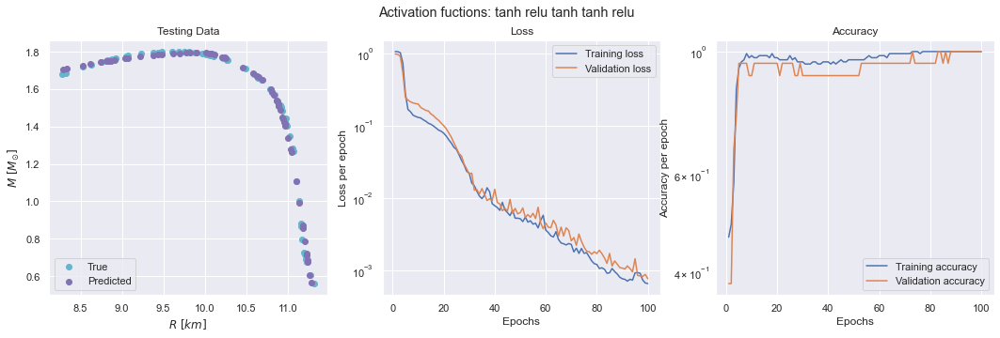

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.86942166490981


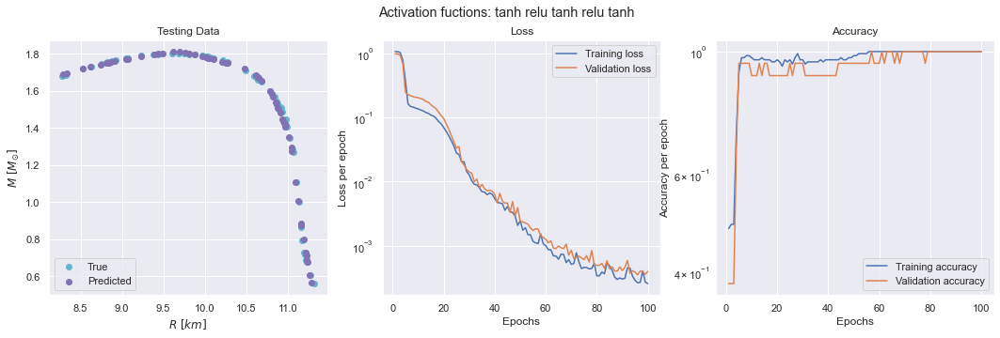

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.85049222845299


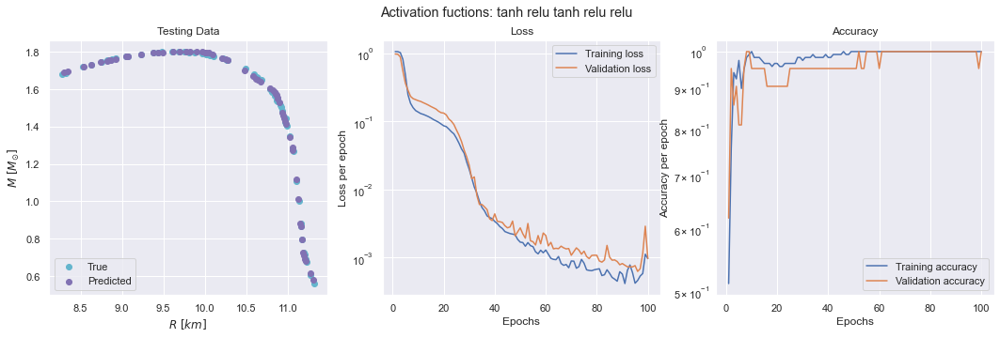

2/2 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.86509338276339


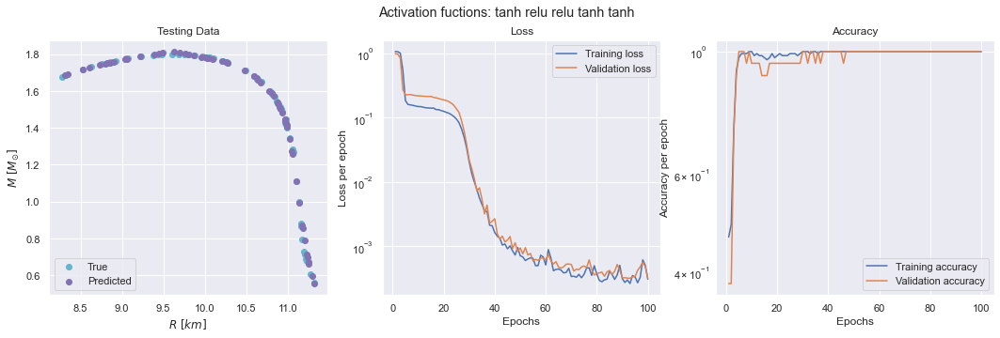

2/2 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.91206513286726


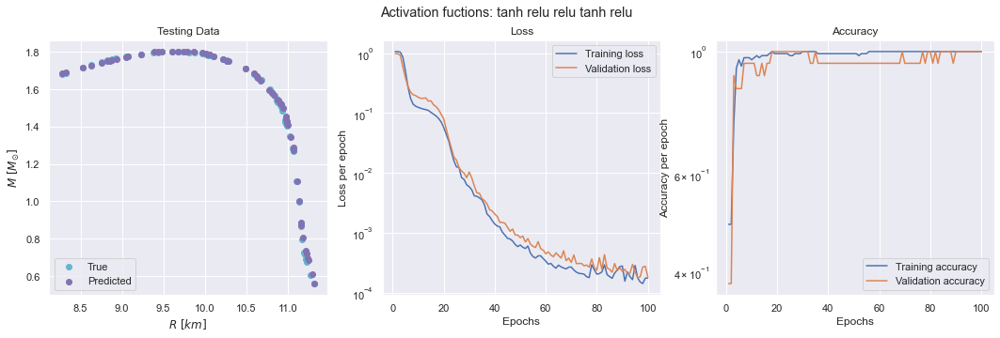

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.7987577199718


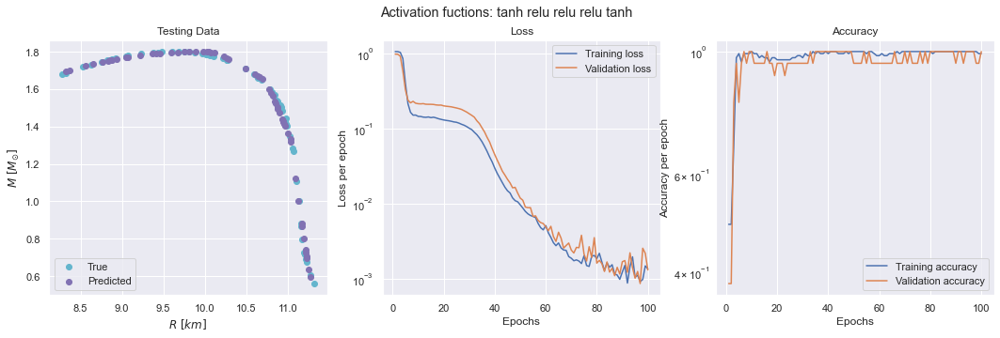

2/2 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.86583622013495


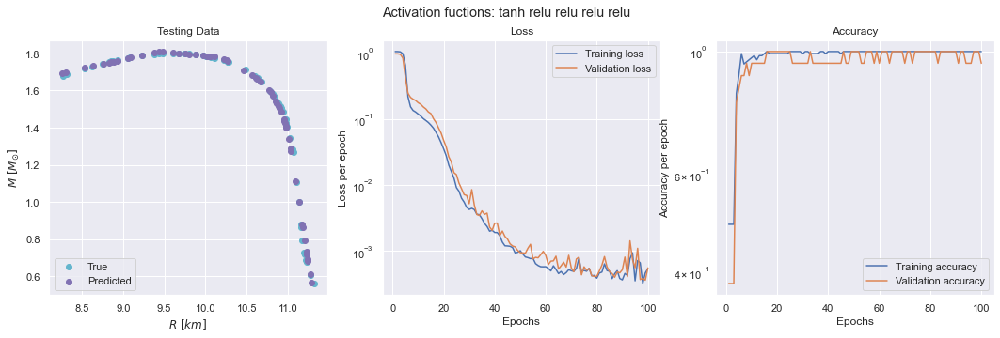

2/2 [==============================] - 0s 1000us/step
The Accuracy of ANN model is: 99.81054276979744


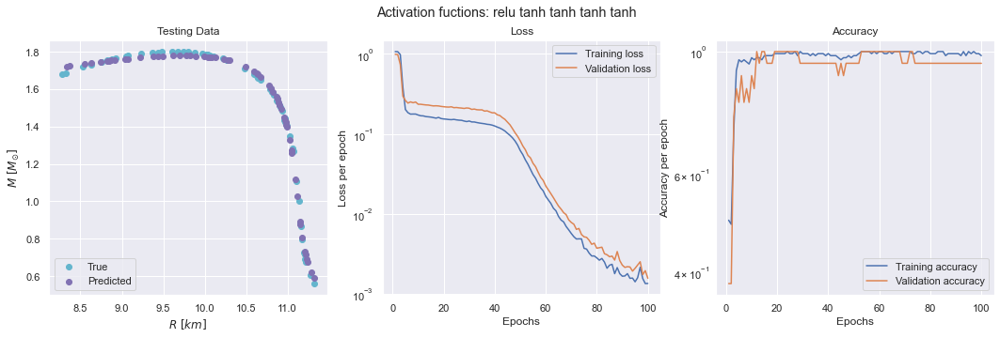

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.8218376502511


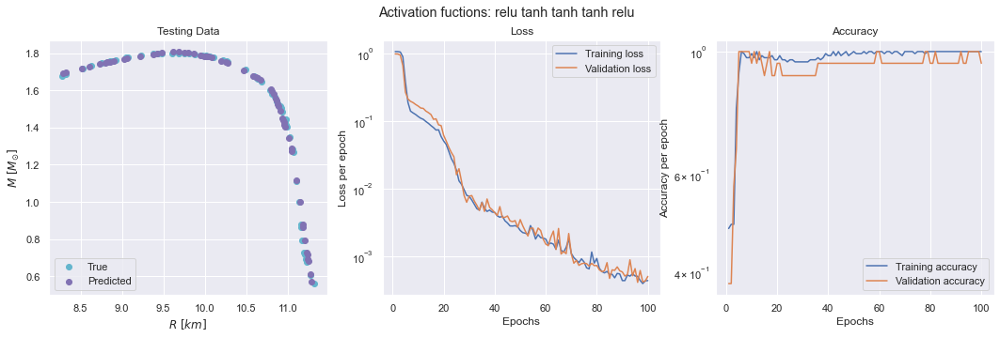

2/2 [==============================] - 0s 999us/step
The Accuracy of ANN model is: 99.84962871964092


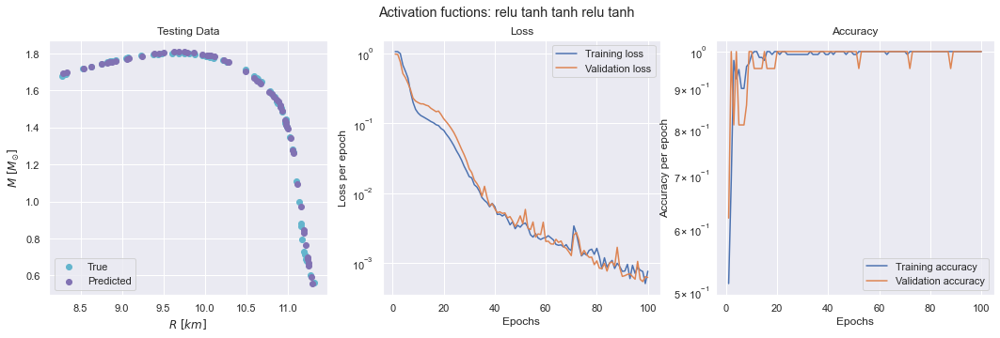

2/2 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.91621835513166


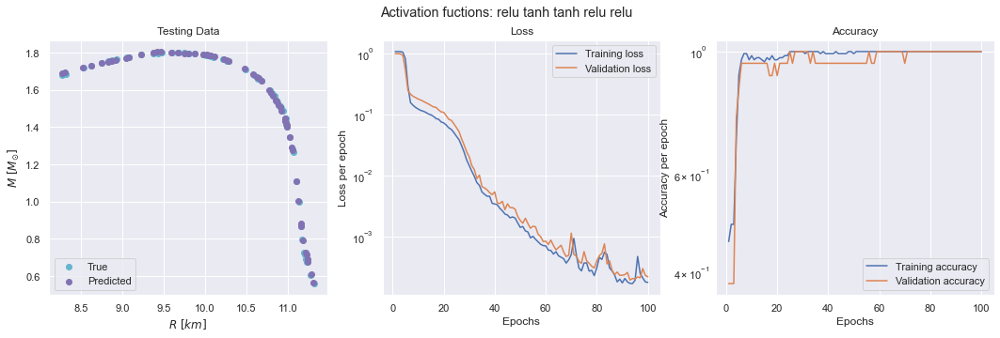

2/2 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.67368840830419


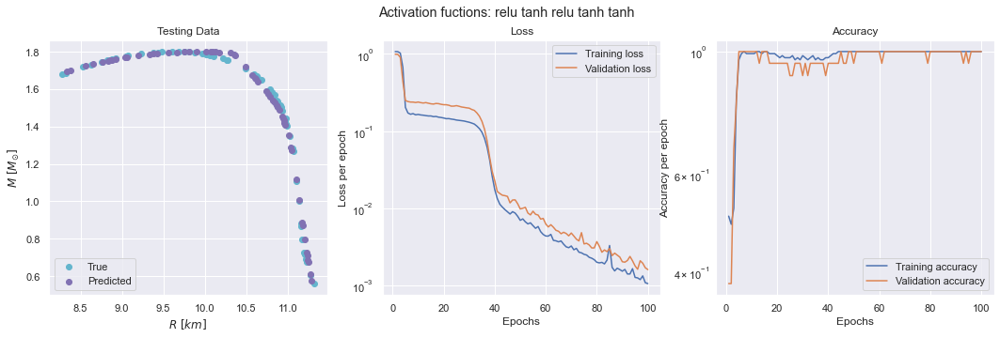

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.88282269234112


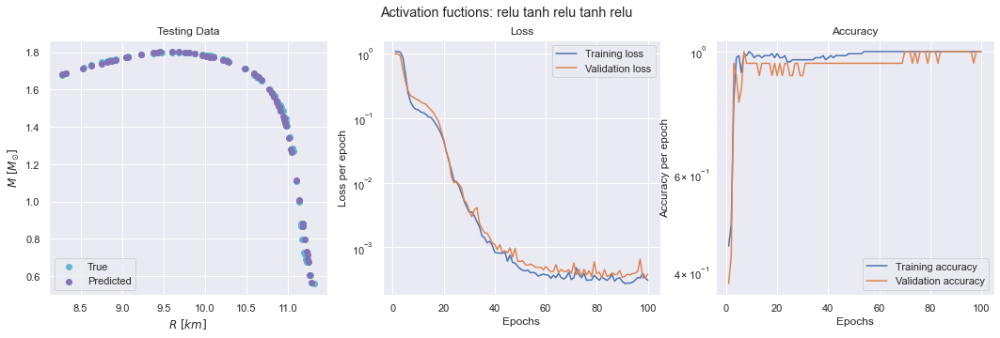

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.88102520452678


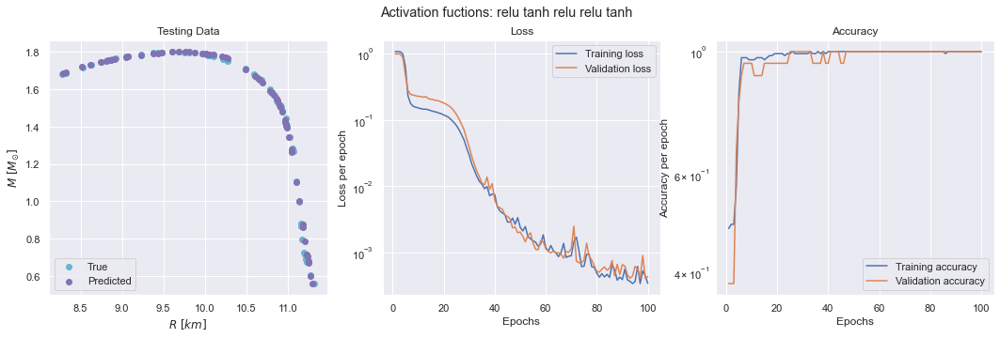

2/2 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.83967385600258


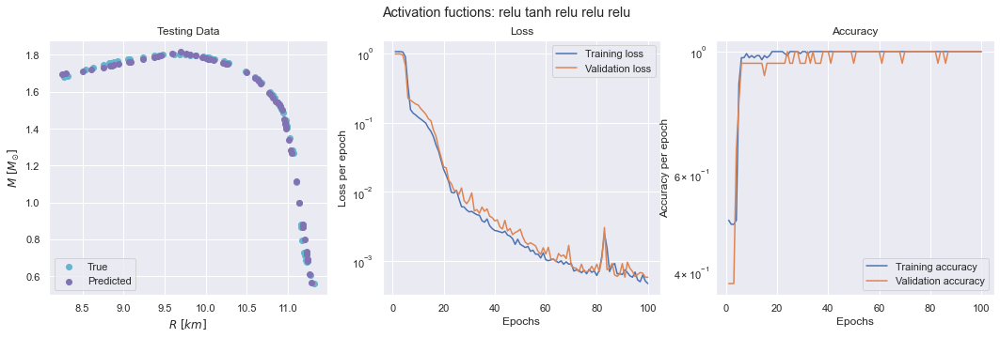

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.86298097755517


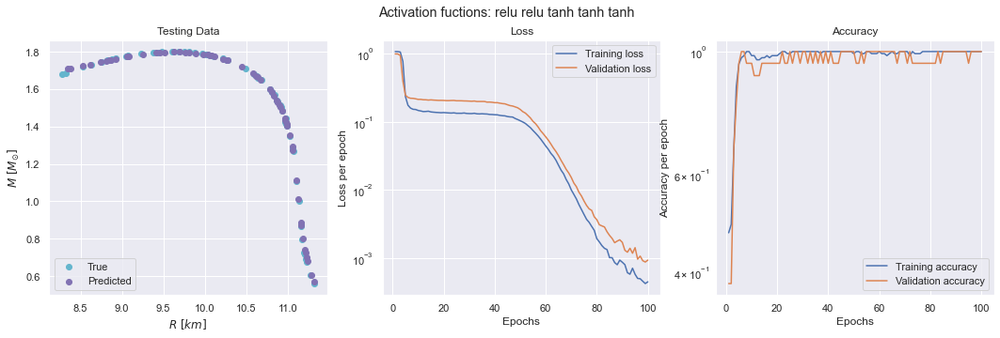

2/2 [==============================] - 0s 1000us/step
The Accuracy of ANN model is: 99.79884114650979


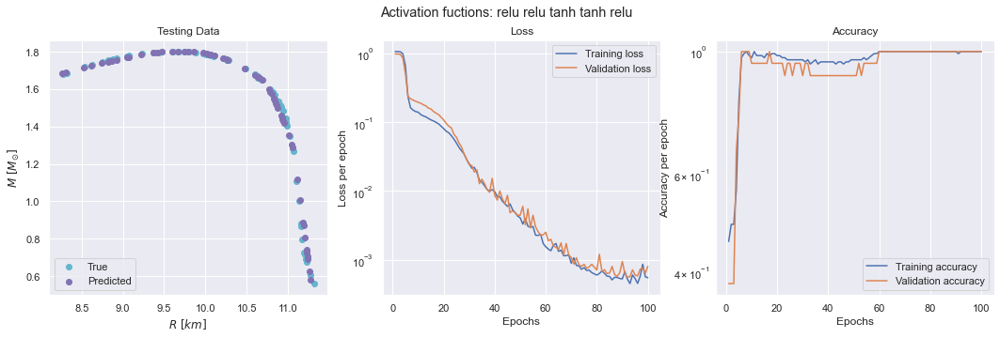

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.78296218842773


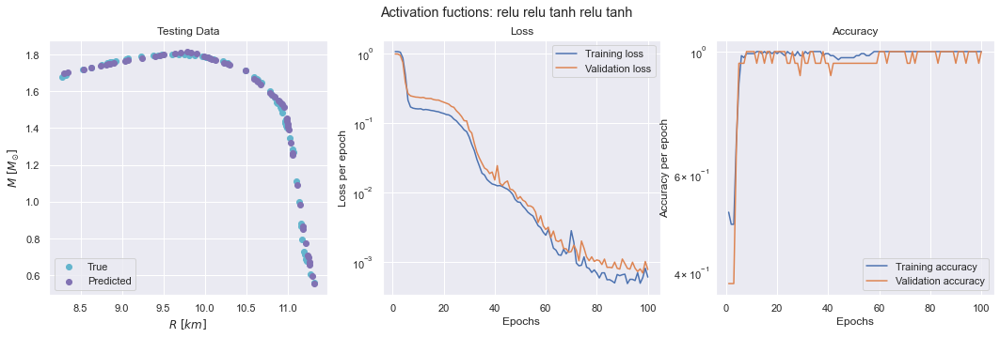

2/2 [==============================] - 0s 1000us/step
The Accuracy of ANN model is: 99.86733395963824


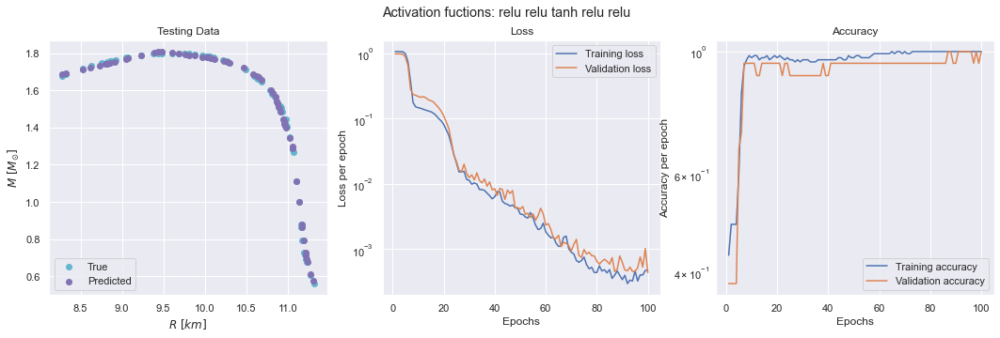

2/2 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.73654210046479


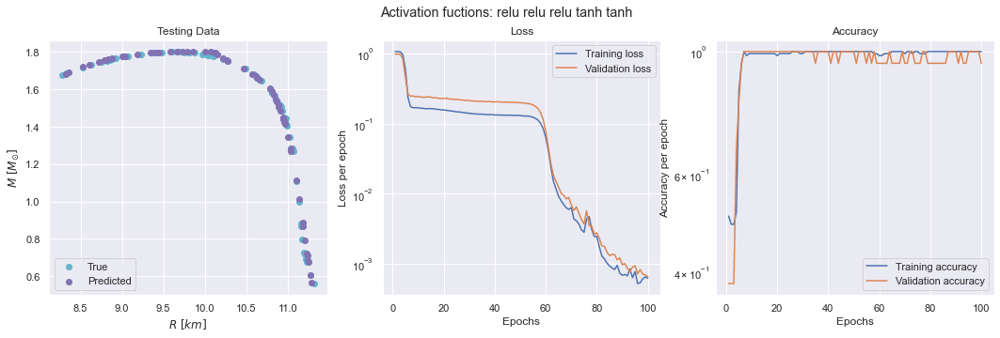

2/2 [==============================] - 0s 999us/step
The Accuracy of ANN model is: 99.86993270695879


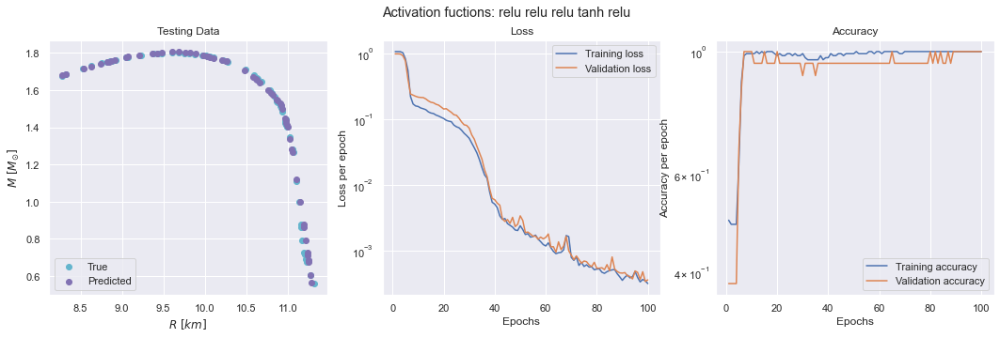

2/2 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.85612967165973


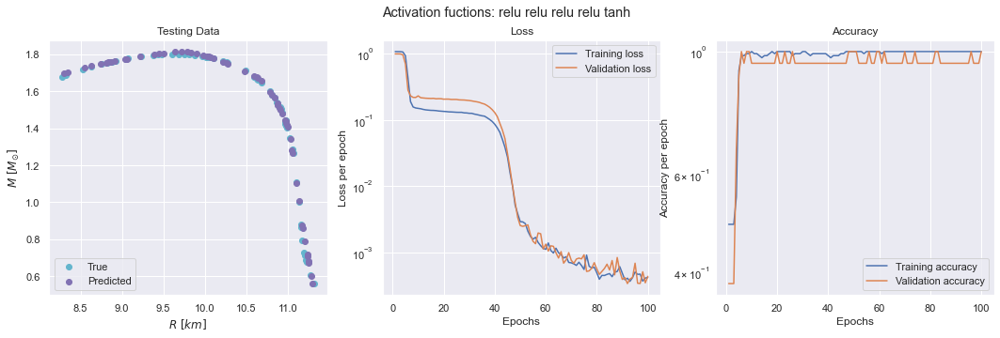

2/2 [==============================] - 0s 2ms/step
The Accuracy of ANN model is: 99.82248733453388


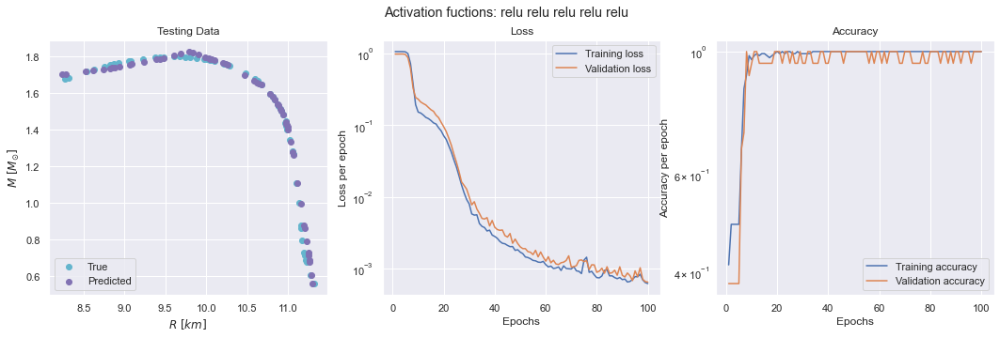

In [ ]:
eps         = 100
activ_list  = ['tanh','relu']
ape_list    = []
accur_list  = []
neu_list    = []
dist_list   = []

for i in activ_list:
    for j in activ_list:
        for k in activ_list:
            for l in activ_list:
                for m in activ_list:
                
                    model = Sequential()

                    model.add(Dense(units=5, input_dim=1, kernel_initializer='normal', activation=i))

                    model.add(Dense(units=20, kernel_initializer='normal', activation=j))

                    model.add(Dense(units=25, kernel_initializer='normal', activation=k))

                    model.add(Dense(units=15, kernel_initializer='normal', activation=l))

                    model.add(Dense(units=20, kernel_initializer='normal', activation=m))

                    model.add(Dense(2, kernel_initializer='normal'))

                    model.compile(loss='mean_squared_error', optimizer='adam', metrics=['accuracy'])

                    trial = model.fit(X_train, y_train ,batch_size = 5, epochs = eps, verbose=0, validation_split = 0.15)

                    Predictions=model.predict(X_test)

                    Predictions=TargetVarScalerFit.inverse_transform(Predictions)

                    y_test_orig=TargetVarScalerFit.inverse_transform(y_test)

                    Test_Data=PredictorScalerFit.inverse_transform(X_test)

                    TestingData=pd.DataFrame(data=Test_Data, columns=Predictors)

                    TestingData['M'] = y_test_orig.T[0]
                    TestingData['R'] = y_test_orig.T[1]

                    TestingData['M_pred'] = Predictions.T[0]
                    TestingData['R_pred'] = Predictions.T[1]

                    Testing_norm   = np.sqrt(TestingData.M.values**2 + TestingData.R.values**2)
                    Predicted_norm = np.sqrt(TestingData.M_pred.values**2 + TestingData.R_pred.values**2)
                    Test_pred_norm = np.sqrt((TestingData.M.values-TestingData.M_pred.values)**2 + (TestingData.R.values-TestingData.R_pred.values)**2)


                    APE=100*(Test_pred_norm/Testing_norm)
                    TestingData['APE']=APE

                    print('The Accuracy of ANN model is:', 100-np.mean(APE))

                    import matplotlib.pyplot as plt
                    x1 = TestingData.R.values
                    y1 = TestingData.M.values

                    x2 = TestingData.R_pred.values
                    y2 = TestingData.M_pred.values

                    fig, ax = plt.subplots(1, 3, figsize=(18,5))
                    ax[0].scatter(x1,y1, color = 'c', label = 'True')
                    ax[0].scatter(x2,y2, color = 'm', label = 'Predicted')
                    ax[0].legend()
                    ax[0].set_xlabel('$ R \ [km] $')
                    ax[0].set_ylabel('$ M \ [M_{\odot}] $')
                    ax[0].set_title("Testing Data")


                    val_loss_list = trial.history['val_loss']
                    loss_list     = trial.history['loss']
                    epos          = np.linspace(1,eps,eps)
                    ax[1].semilogy(epos, loss_list    , label = 'Training loss')
                    ax[1].semilogy(epos, val_loss_list, label = 'Validation loss')
                    ax[1].set_xlabel('Epochs')
                    ax[1].set_ylabel('Loss per epoch')
                    ax[1].legend()
                    ax[1].set_title("Loss")

                    val_acc_list = trial.history['val_accuracy']
                    acc_list     = trial.history['accuracy']
                    epos         = np.linspace(1,eps,eps)
                    ax[2].semilogy(epos, acc_list    , label = 'Training accuracy')
                    ax[2].semilogy(epos, val_acc_list, label = 'Validation accuracy')
                    ax[2].set_xlabel('Epochs')
                    ax[2].set_ylabel('Accuracy per epoch')
                    ax[2].legend()
                    ax[2].set_title("Accuracy")

                    distance = np.array(acc_list)-np.array(val_acc_list)
                    distance = np.mean(distance[-10:])

                    neu_list.append(str(i)+" "+str(j)+" "+str(k)+" "+str(l)+" "+str(m))
                    ape_list.append(100-np.mean(APE))
                    dist_list.append(distance)
                    accur_list.append(np.mean(acc_list))

                    fig.suptitle('Activation fuctions: '+str(i)+" "+str(j)+" "+str(k)+" "+str(l)+" "+str(m))
                    plt.show()



2/2 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.76733591993333


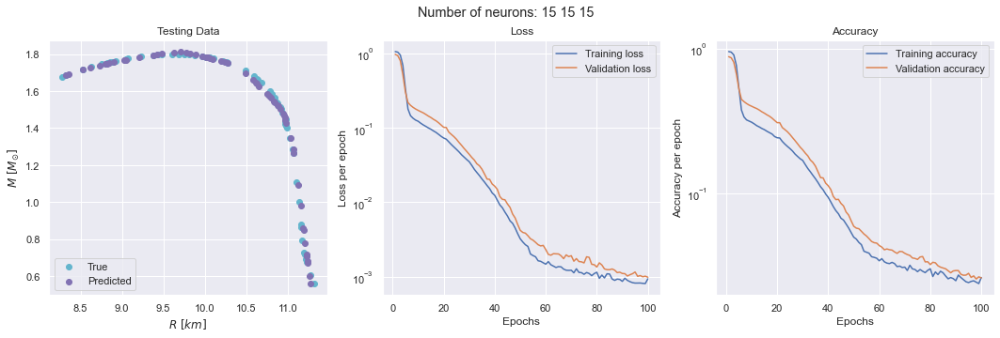

In [ ]:
eps = 100
neuron_list = [15]


for i in neuron_list:
    for j in neuron_list:
        for k in neuron_list:

            model = Sequential()
            
            model.add(Dense(units = i, input_dim=X_train.shape[1], kernel_initializer='normal', activation='tanh'))

            model.add(Dense(units = j, kernel_initializer='normal', activation='tanh'))

            model.add(Dense(units = k, kernel_initializer='normal', activation='relu'))

            #             model.add(Dense(units=15, kernel_initializer='normal', activation='tanh'))

            #             model.add(Dense(units=20, kernel_initializer='normal', activation='relu'))

            model.add(Dense(2, kernel_initializer='normal'))

            model.compile(loss='mean_squared_error', optimizer='adam', metrics=[rmse])


            trial = model.fit(X_train, y_train ,batch_size = 5, epochs = eps, verbose=0, validation_split = 0.15)

            Predictions=model.predict(X_test)

            Predictions=TargetVarScalerFit.inverse_transform(Predictions)

            y_test_orig=TargetVarScalerFit.inverse_transform(y_test)

            Test_Data=PredictorScalerFit.inverse_transform(X_test)

            TestingData=pd.DataFrame(data=Test_Data, columns=Predictors)

            TestingData['M'] = y_test_orig.T[0]
            TestingData['R'] = y_test_orig.T[1]

            TestingData['M_pred'] = Predictions.T[0]
            TestingData['R_pred'] = Predictions.T[1]

            Testing_norm   = np.sqrt(TestingData.M.values**2 + TestingData.R.values**2)
            Predicted_norm = np.sqrt(TestingData.M_pred.values**2 + TestingData.R_pred.values**2)
            Test_pred_norm = np.sqrt((TestingData.M.values-TestingData.M_pred.values)**2 + (TestingData.R.values-TestingData.R_pred.values)**2)


            APE=100*(Test_pred_norm/Testing_norm)
            TestingData['APE']=APE

            print('The Accuracy of ANN model is:', 100-np.mean(APE))

            import matplotlib.pyplot as plt
            x1 = TestingData.R.values
            y1 = TestingData.M.values

            x2 = TestingData.R_pred.values
            y2 = TestingData.M_pred.values

            fig, ax = plt.subplots(1, 3, figsize=(18,5))
            ax[0].scatter(x1,y1, color = 'c', label = 'True')
            ax[0].scatter(x2,y2, color = 'm', label = 'Predicted')
            ax[0].legend()
            ax[0].set_xlabel('$ R \ [km] $')
            ax[0].set_ylabel('$ M \ [M_{\odot}] $')
            ax[0].set_title("Testing Data")


            val_loss_list = trial.history['val_loss']
            loss_list     = trial.history['loss']
            epos          = np.linspace(1,eps,eps)
            ax[1].semilogy(epos, loss_list    , label = 'Training loss')
            ax[1].semilogy(epos, val_loss_list, label = 'Validation loss')
            ax[1].set_xlabel('Epochs')
            ax[1].set_ylabel('Loss per epoch')
            ax[1].legend()
            ax[1].set_title("Loss")
            
            val_acc_list = trial.history['val_rmse']
            acc_list     = trial.history['rmse']
            epos         = np.linspace(1,eps,eps)
            ax[2].semilogy(epos, acc_list    , label = 'Training accuracy')
            ax[2].semilogy(epos, val_acc_list, label = 'Validation accuracy')
            ax[2].set_xlabel('Epochs')
            ax[2].set_ylabel('Accuracy per epoch')
            ax[2].legend()
            ax[2].set_title("Accuracy")
            
            
            fig.suptitle('Number of neurons: '+str(i)+" "+str(j)+" "+str(k))
            plt.show()

In [ ]:
from keras import backend
 
def rmse(y_true, y_pred):
    return backend.sqrt(backend.mean(backend.square(y_pred - y_true), axis=-1))

5/5 [==============================] - 0s 750us/step


Text(0.5, 1.0, 'Trial data')

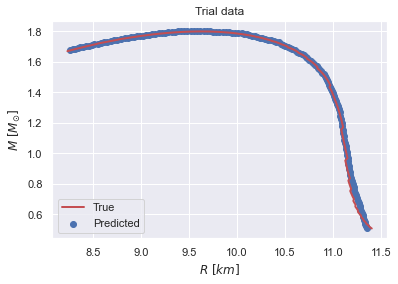

In [ ]:
import math
from sklearn.preprocessing import StandardScaler
PredictorScaler=StandardScaler()

X = np.array([np.logspace(math.log10(min(data.rho_c)), math.log10(max(data.rho_c)), num = 150, base=10),]).T

trial_df = pd.DataFrame({})

trial_df['rho_c'] = X.T[0]

PredictorScaler=StandardScaler()


PredictorScalerFit=PredictorScaler.fit(X)

X=PredictorScalerFit.transform(X)

Predictions=model.predict(X)

Predictions=TargetVarScalerFit.inverse_transform(Predictions)




trial_df['M_pred'] = Predictions.T[0]
trial_df['R_pred'] = Predictions.T[1]

x1 = data.R.values
y1 = data.M.values

x2 = trial_df.R_pred.values
y2 = trial_df.M_pred.values

plt.plot(x1, y1, linewidth = 2, color = 'r', label = 'True')
plt.scatter(x2, y2, label = 'Predicted')

plt.legend()

plt.xlabel('$ R \ [km] $')
plt.ylabel('$ M \ [M_{\odot}] $')
plt.title('Trial data')

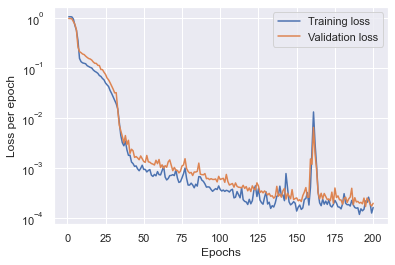

In [ ]:
eps = 200

val_loss_list = trial.history['val_loss']
loss_list     = trial.history['loss']
epos          = np.linspace(1,eps,eps)
plt.semilogy(epos, loss_list, label = 'Training loss')
plt.semilogy(epos, val_loss_list, label = 'Validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss per epoch')
plt.legend()

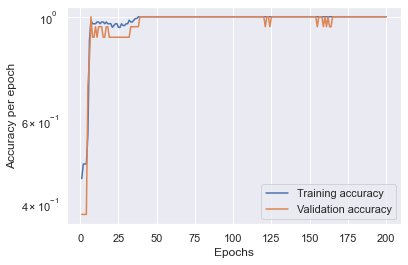

In [ ]:
val_acc_list = trial.history['val_accuracy']
acc_list     = trial.history['accuracy']
epos         = np.linspace(1,eps,eps)
plt.semilogy(epos, acc_list, label = 'Training accuracy')
plt.semilogy(epos, val_acc_list, label = 'Validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy per epoch')
plt.legend()

In [ ]:
# from sklearn.preprocessing import StandardScaler
# PredictorScaler=StandardScaler()


# X = np.array([np.linspace(min(data.rho_c), max(data.rho_c), 200),]).T

# trial_df['rho_c_lin'] = X.T[0]

# PredictorScaler=StandardScaler()


# PredictorScalerFit=PredictorScaler.fit(X)

# X=PredictorScalerFit.transform(X)

# Predictions=model.predict(X)

# Predictions=TargetVarScalerFit.inverse_transform(Predictions)




# trial_df['M_pred_lin'] = Predictions.T[0]
# trial_df['R_pred_lin'] = Predictions.T[1]

# x1 = data.R.values
# y1 = data.M.values

# x3 = trial_df.R_pred_lin.values
# y3 = trial_df.M_pred_lin.values

# plt.scatter(x1, y1, label = 'True')
# plt.scatter(x2, y2, label = 'Predicted log2')
# plt.scatter(x3, y3, marker = 's', label = 'Predicted lin')

# plt.legend()

# plt.xlabel('$ R \ [km] $')
# plt.ylabel('$ M \ [M_{\odot}] $')
# plt.title('Trial data')